# Part E: Generate figures and make analysis: Process-based and general figures

## Introduction
Alongside the other notebooks, it covers all the analysis performed in: "Assessing the Impact of Geological Map Detail on Process-Based and Data-Driven Hydrological Models" paper by do Nascimento et al. (in review). To be able to run this notebook, please ensure that you have downloaded the acompanying data of the paper. All links can be found in the data section of the paper.

Author: Thiago Nascimento (thiago.nascimento@eawag.ch)

## Requirements

**Files**

- estreams_gauging_stations.csv https://doi.org/10.5281/zenodo.14778580 (Last access: 11 February 2025)
- estreams_geology_moselle_regional_attributes.csv https://doi.org/10.5281/zenodo.14778580 (Last access: 15 February 2025)
- estreams_attributes_filtered_quality_geology_v01.csv https://github.com/thiagovmdon/LSH-quality_geology (Last access: 11 February 2025)



## Import modules

In [1]:
import pandas as pd
import datetime as datetime
import matplotlib.pyplot as plt
import numpy as np
import time
import os
import tqdm as tqdm
from utils.functions import find_max_unique_rows
from utils.functions import find_iterative_immediate_downstream
import geopandas as gpd
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import rasterio
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import xarray as xr
from neuralhydrology.evaluation.signatures import (
    baseflow_index, hfd_mean, high_q_dur, high_q_freq, low_q_dur,
    low_q_freq, q5, q95, q_mean, runoff_ratio, slope_fdc, stream_elas, zero_q_freq
)

import matplotlib as mpl
import matplotlib.ticker as ticker

## Configurations

In [2]:
# Path to where the EStreams dataset is stored
# Eawag
path_estreams = r'/Users/nascimth/Documents/data/EStreams'

## Personal
#path_estreams = r'/Users/thiagomedeirosdonascimento/Downloads/Python 2/Scripts/estreams_part_b/data/EStreams'

# Path to where other datasets are stored
# Eawag
path_data = r"/Users/nascimth/Documents/data"

## Import data

### Shapefiles

In [3]:
moselle=gpd.read_file(path_data+"/gis/paper_moselle/gis/moselle_delienation.shp")
rivers_moselle=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/rivers_moselle.shp")
catchment_boundaries = gpd.read_file(path_data+'//EStreams/shapefiles/estreams_catchments.shp')
catchment_boundaries.set_index("basin_id", inplace=True)

rivers_garonne=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/rivers_garonne.shp")

garonne=gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne.shp")


### Geological maps (clipped to the Moselle basin)


In [4]:
##################################################################################################################
# Global geology clipped to the Moselle catchment
GLiM_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/glim_moselle_wgs.shp")

attribute_field = 'xx'
GLiM_moselle_dissolved = GLiM_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_moselle_dissolved["class"] = GLiM_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_moselle_dissolved['permeability'] = GLiM_moselle_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Moselle catchment
geology_median_moselle = gpd.read_file(path_data+"/gis/paper_moselle//raster/geology_median_moselle_wgs.shp")

attribute_field = 'LEVEL3'
geology_median_moselle_dissolved = geology_median_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_moselle_dissolved["class"] = geology_median_moselle_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_moselle_dissolved['permeability'] = geology_median_moselle_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Moselle catchment
geology_high_moselle = gpd.read_file(path_data+'/gis/lithology/moselle_hr_ff.shp')

attribute_field = 'Labels01'
geology_high_moselle_dissolved = geology_high_moselle.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_moselle_dissolved["class"] = geology_high_moselle_dissolved.index

# Set the CRS to WGS84
geology_high_moselle_dissolved = geology_high_moselle_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Alluvium", 'Coal', 'Conglomerate', 'Gravel and sand',
             'Sand', 'Sand and gravel', 'Sandstone and conglomerate', 'Sandstone'
        ],
    
    "medium": ['Limestone', 'Sandstone and marl', 'Sandstone and schist',
              'Sandstone, conglomerate and marl'],
    
    "low": ['Arkose', 'Dolomite rock', 'Limestone and marl', 'Marl', 
             'Marl and dolomite', 'Marl and limestone', 'Marl and sandstone',
             'Sandstone and siltstone', 'Sandstone, siltstone and schist', 
              'Schist and sandstone', 'Silt',  'Silt and schist', 'Siltstone, sandstone and schist'
              ,"Siltstone"
             ],
    
    "very low": ['Cristallin basement', 'Plutonic rock',  'Quarzite',
                    'Schist','Volcanic rock' 
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_moselle_dissolved['permeability'] = geology_high_moselle_dissolved['class'].apply(reclassify_geology_class)

In [5]:
GLiM_garonne = gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne_lr.shp")
GLiM_garonne

,OBJECTID,IDENTITY_,Litho,xx,Shape_Leng,Shape_Area,litho_grou,basin_id,gauge_id,country,...,etateh,natureeh,milieueh,themeeh,origineeh,layer_2,path_2,litho_name,class,geometry
0,1218980.0,FRA20016,smmx__,sm,570225.208029,1.368545e+09,Limestones,FR001604,O262002002,FR,...,2,3,3,4,1,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Limestones,"MULTIPOLYGON (((0.62089 43.26904, 0.61846 43.2..."
1,1218980.0,FRA20016,smmx__,sm,570225.208029,1.368545e+09,Molasses and clays,FR001604,O262002002,FR,...,X,4,1,2,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Molasses and clays,"MULTIPOLYGON (((0.72345 43.3711, 0.72106 43.36..."
2,1218980.0,FRA20016,smmx__,sm,570225.208029,1.368545e+09,"Sand, gravel and pebbles",FR001604,O262002002,FR,...,2,3,1,2,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,"Sand, gravel and pebbles","MULTIPOLYGON (((0.71625 43.35614, 0.71416 43.3..."
3,1219033.0,FRA20085,smmx__,sm,404615.782627,8.310861e+08,Alluvium,FR001604,O262002002,FR,...,2,3,1,1,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Alluvium,"POLYGON ((1.22422 43.80033, 1.2257 43.79998, 1..."
4,1219033.0,FRA20085,smmx__,sm,404615.782627,8.310861e+08,Impermeable,FR001604,O262002002,FR,...,3,4,4,4,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Impermeable,"MULTIPOLYGON (((0.59479 43.21655, 0.58945 43.2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1424,1235118.0,FRA20484,smmxmt,sm,99856.604277,6.382656e+07,Shales,FR001604,O262002002,FR,...,None,None,None,None,None,1,C:\Users\nascimth\Downloads\1.shp,None,Shales,"POLYGON ((0.13268 42.80711, 0.13769 42.80705, ..."
1425,1235119.0,FRA20910,smmxmt,sm,119352.692165,6.124319e+07,Massif,FR001604,O262002002,FR,...,2,4,2,4,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Massif,"POLYGON ((0.12512 42.7898, 0.13136 42.79143, 0..."
1426,1235119.0,FRA20910,smmxmt,sm,119352.692165,6.124319e+07,Shales,FR001604,O262002002,FR,...,None,None,None,None,None,1,C:\Users\nascimth\Downloads\1.shp,None,Shales,"MULTIPOLYGON (((0.14101 42.79899, 0.14318 42.7..."
1427,1235145.0,FRA24498,smmxmt,sm,68345.374691,4.195102e+07,Massif,FR001604,O262002002,FR,...,2,4,2,4,4,litho_fr_n2_o1_3035,C:/Users/nascimth/Documents/data/gis/litho_fr_...,None,Massif,"POLYGON ((0.11447 42.79433, 0.12567 42.79467, ..."


In [6]:
##################################################################################################################
# Global geology clipped to the Moselle catchment
GLiM_garonne = gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne_lr.shp")
attribute_field = 'xx'
GLiM_garonne_dissolved = GLiM_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
GLiM_garonne_dissolved["class"] = GLiM_garonne_dissolved.index

# Define the permeability columns dictionary
permeability_columns_glim = {
    "very low": ['ev', 'ig', 'pa', 'pb', 'va', 'vb', "wb"],
    "low": ['mt', 'pi', 'py', 'vi'],
    "medium": ['sc', 'sm'],
    "high": ['su', 'ss']
}

# Create a new column for reclassified permeability
def reclassify_glim_class(class_name):
    for permeability, classes in permeability_columns_glim.items():
        if class_name in classes:
            return permeability
    return None

GLiM_garonne_dissolved['permeability'] = GLiM_garonne_dissolved['class'].apply(reclassify_glim_class)

##################################################################################################################
# Continental geology clipped to the Moselle catchment
geology_median_garonne = gpd.read_file(path_data+"/gis/paper_moselle_superflexpy/shps/garonne/garonne_mr.shp")

attribute_field = 'LEVEL3'
geology_median_garonne_dissolved = geology_median_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_median_garonne_dissolved["class"] = geology_median_garonne_dissolved.index

# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": ["Conglomerates", "Conglomerates and sands", "Gravels", 
             "Sands", "Sandstones", "Sandstones and sands"],
    "medium": ["Conglomerates and clays", "Gneisses", "Limestones", 
               "Limestones and sands", "Sandstones and clays", "Sandstones and marls",
               "Limestones and clays", "Limestones and marls", "Marlstones and sands"],
    "low": ["Claystones and clays", "Marbles",
              "Marls", "Marlstones", "Marlstones and clays", 
              "Marlstones and marls", "Phyllites", "Schists",
              "Silts"],
    "very low": ["Plutonic rocks", "Volcanic rocks", 
                    "Inland water", "Snow field / ice field",
                    "Clays",  'Quartzites', "Shales"]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_median_garonne_dissolved['permeability'] = geology_median_garonne_dissolved['class'].apply(reclassify_geology_class)

##################################################################################################################
# Regional geology clipped to the Moselle catchment
geology_high_garonne = gpd.read_file(path_data+'/gis/paper_moselle_superflexpy/shps/garonne/garonne_hr_nodissol.shp')

attribute_field = 'class'
geology_high_garonne_dissolved = geology_high_garonne.dissolve(by=attribute_field)

# Now we create a new feature with the geology class:
geology_high_garonne_dissolved["class"] = geology_high_garonne_dissolved.index

# Set the CRS to WGS84
geology_high_garonne_dissolved = geology_high_garonne_dissolved.to_crs(epsg=4326)


# Define the permeability columns dictionary
permeability_columns_geology = {
    "high": [ "Alluvium",
             'Sand, gravel and pebbles'    
        ],
    
    "medium": ['Carbonate rocks', 
               'Limestones', 
               'Limestones, sandstones and gravels', 
               'Limestones, sandstones and marls', 
               'Molasses and clays',  
               'Sands and clays',
                'Sedimentary rocks',
               'Sediments mesosoics',
            'Schists, gneisses, granites', 
             ],
    
    "low": ['Impermeable', 
            'Inland water', 
            'Magmatic rocks', 
            'Massif', 
            'Plutonic rocks',
            'Shales',
            'Granitoids',
                   ]
}

# Create a new column for reclassified permeability
def reclassify_geology_class(class_name):
    for permeability, classes in permeability_columns_geology.items():
        if class_name in classes:
            return permeability
    return None

geology_high_garonne_dissolved['permeability'] = geology_high_garonne_dissolved['class'].apply(reclassify_geology_class)

### Topography

Current CRS: EPSG:4326
Image is already in WGS84 CRS.


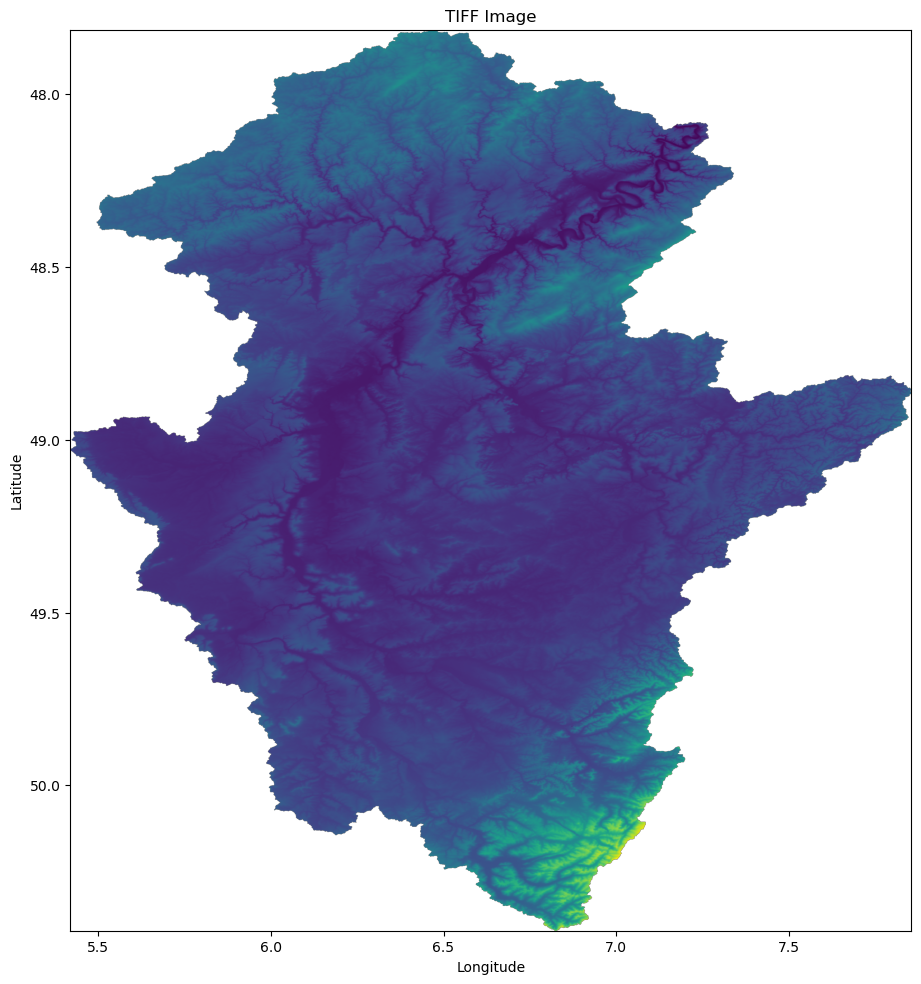

In [7]:
##################################################################################################################
# Terrain (elevation)
# Path to the TIFF file
tiff_path = path_data+"/gis/paper_moselle/raster/elevation/moselle_srtm.tif"

# Open the TIFF file
with rasterio.open(tiff_path) as src:
    # Check the current CRS
    current_crs = src.crs
    print(f'Current CRS: {current_crs}')

    # Define the target CRS (WGS84)
    dst_crs = 'EPSG:4326'  # WGS84

    # If the current CRS is not WGS84, reproject the image
    if current_crs != dst_crs:
        transform, width, height = calculate_default_transform(
            src.crs, dst_crs, src.width, src.height, *src.bounds)
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': dst_crs,
            'transform': transform,
            'width': width,
            'height': height
        })

        # Create an in-memory array to hold the reprojected data
        reprojected_image = rasterio.io.MemoryFile().open(**kwargs)

        for i in range(1, src.count + 1):
            reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(reprojected_image, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs=dst_crs,
                resampling=Resampling.nearest)

        # Read the reprojected image
        elevation_wgs = reprojected_image.read(1)

        print(f'Image reprojected to WGS84 and stored in-memory.')
    else:
        # Read the original image if it is already in WGS84
        elevation_wgs = src.read(1)
        transform = src.transform
        print('Image is already in WGS84 CRS.')

# Calculate the extent
left, bottom, right, top = transform * (0, 0), transform * (elevation_wgs.shape[1], 0), transform * (elevation_wgs.shape[1], elevation_wgs.shape[0]), transform * (0, elevation_wgs.shape[0])
extent = (left[0], right[0], bottom[1], top[1])

# Plot the image with the correct extent
fig, ax = plt.subplots(1, 1, figsize=(16.6, 11.7))
ax.imshow(elevation_wgs, cmap='viridis', extent=extent)
ax.set_title('TIFF Image')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

### Network and attributes

In [8]:
# Read the gauges network metadata (from EStreams):
network_estreams = pd.read_csv(path_estreams+'/streamflow_gauges/estreams_gauging_stations.csv', encoding='utf-8')
network_estreams.set_index("basin_id", inplace = True)

# Attributes already filtered from EStreams previously in do Nascimento et al. (2025a):
estreams_attributes = pd.read_csv('../data/estreams_attributes_filtered_quality_geology_v01.csv', encoding='utf-8')
estreams_attributes.set_index("basin_id", inplace = True)

# Geological attributes (regional scale). Same ones provided in do Nascimento et al. (2025a):
geology_regional_31_classes_moselle = pd.read_csv("../data/estreams_geology_moselle_regional_attributes.csv", encoding='utf-8')
geology_regional_31_classes_moselle.set_index("basin_id", inplace = True)


# Read the dataset network
estreams_attributes_clipped_filters = pd.read_csv(R'../data/network_estreams_moselle_108_gauges.csv', encoding='utf-8')
estreams_attributes_clipped_filters.set_index("basin_id", inplace = True)

# Read the dataset network
estreams_attributes_garonne_clipped_filters = pd.read_csv(R'../data/network_estreams_garonne_22_gauges.csv', encoding='utf-8')
estreams_attributes_garonne_clipped_filters.set_index("basin_id", inplace = True)


# Geological attributes (regional scale) for the Garonne (new):
geology_regional_18_classes_garonne = pd.read_csv("../data/estreams_geology_garonne_regional_attributes.csv", encoding='utf-8')
geology_regional_18_classes_garonne.set_index("basin_id", inplace = True)

In [9]:
network_estreams_moselle_108_gauges = pd.read_csv('../data/network_estreams_moselle_108_gauges.csv', encoding='utf-8')
network_estreams_moselle_108_gauges.drop_duplicates("basin_id", inplace = True)
network_estreams_moselle_108_gauges.set_index("basin_id", inplace = True)
network_estreams_garonne_22_gauges = pd.read_csv('../data/network_estreams_garonne_22_gauges.csv', encoding='utf-8')
network_estreams_garonne_22_gauges.drop_duplicates("basin_id", inplace = True)
network_estreams_garonne_22_gauges.set_index("basin_id", inplace = True)

## Preprocessing
### Network organization

In [10]:
# Convert 'date_column' and 'time_column' to datetime
network_estreams['start_date'] = pd.to_datetime(network_estreams['start_date'])
network_estreams['end_date'] = pd.to_datetime(network_estreams['end_date'])

# Convert to list both the nested_catchments and the duplicated_suspect columns
network_estreams['nested_catchments'] = network_estreams['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
network_estreams['duplicated_suspect'] = network_estreams['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

# Set the nested catchments as a dataframe
nested_catchments = pd.DataFrame(network_estreams['nested_catchments'])

# Now we add the outlet to the list (IF it was not before):
# Ensure that the basin_id is in the nested_catchments
for basin_id in nested_catchments.index:
    if basin_id not in nested_catchments.at[basin_id, 'nested_catchments']:
        nested_catchments.at[basin_id, 'nested_catchments'].append(basin_id)


# Convert to list both the nested_catchments and the duplicated_suspect columns
estreams_attributes['nested_catchments'] = estreams_attributes['nested_catchments'].apply(lambda x: x.strip("[]").replace("'", "").split(", "))

# Remove the brackets and handle NaN values
estreams_attributes['duplicated_suspect'] = estreams_attributes['duplicated_suspect'].apply(
    lambda x: x.strip("[]").replace("'", "").split(", ") if isinstance(x, str) else x)

estreams_attributes.sort_index(inplace = True) 

### Geological data organization

In [11]:
# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": ["lit_fra_Alluvium", 'lit_fra_Coal', 'lit_fra_Conglomerate', 'lit_fra_Gravel and sand',
             'lit_fra_Sand', 'lit_fra_Sand and gravel', 'lit_fra_Sandstone and conglomerate', 'lit_fra_Sandstone'
        ],
    
    "medium": ['lit_fra_Limestone', 'lit_fra_Sandstone and marl', 'lit_fra_Sandstone and schist',
              'lit_fra_Sandstone, conglomerate and marl',

              'lit_fra_Arkose', 'lit_fra_Dolomite rock', 'lit_fra_Limestone and marl', 'lit_fra_Marl', 
             'lit_fra_Marl and dolomite', 'lit_fra_Marl and limestone', 'lit_fra_Marl and sandstone',
               'lit_fra_Sandstone and siltstone', 'lit_fra_Sandstone, siltstone and schist', 
              'lit_fra_Schist and sandstone', 'lit_fra_Silt',  'lit_fra_Silt and schist', 'lit_fra_Siltstone, sandstone and schist'
              
             ],
    
    "low": ['lit_fra_Cristallin basement', 'lit_fra_Plutonic rock',  'lit_fra_Quarzite',
                    'lit_fra_Schist','lit_fra_Volcanic rock' 
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_31_classes_moselle[f'area_perm_{permeability_class}'] = geology_regional_31_classes_moselle[columns].sum(axis=1)

# Drop unnecessary columns
geology_regional_31_classes_moselle = geology_regional_31_classes_moselle[["area_perm_high", "area_perm_medium", "area_perm_low"]]

# Rename the columns
geology_regional_31_classes_moselle.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi"]

# Display the updated DataFrame
geology_regional_31_classes_moselle

geology_regional_31_classes_moselle["baseflow_index"] = estreams_attributes["baseflow_index"]
geology_regional_31_classes_moselle.corr(method="pearson")

# Concatenation
estreams_attributes[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]] = geology_regional_31_classes_moselle[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]]

# Adjust the three categories for also global dataset
estreams_attributes["perm_high_glob2"] = estreams_attributes["perm_high_glob"]
estreams_attributes["perm_medium_glob2"] = estreams_attributes["perm_medium_glob"] + estreams_attributes["perm_low_glob"]
estreams_attributes["perm_low_glob2"] = estreams_attributes["perm_verylow_glob"]

###########################################################################################################################
# Adjust the columns of the dataset:
for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_regi"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_regi"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_regi"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_regi"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_regi"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_regi"] = v3 * 100


for basin_id in estreams_attributes.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes.loc[basin_id, "perm_high_glob2"] / 100
    v2 = estreams_attributes.loc[basin_id, "perm_medium_glob2"] / 100
    v3 = estreams_attributes.loc[basin_id, "perm_low_glob2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes.loc[basin_id, "perm_high_glob2"] = v1 * 100
    estreams_attributes.loc[basin_id, "perm_medium_glob2"] = v2 * 100
    estreams_attributes.loc[basin_id, "perm_low_glob2"] = v3 * 100

In [12]:
# Garonne
# Create a dictionary to map permeability classes to corresponding columns
permeability_columns = {
    "high": [ "lit_fra_Alluvium",
             'lit_fra_Sand, gravel and pebbles'    
        ],
    
    "medium": ['lit_fra_Carbonate rocks', 
               'lit_fra_Limestones', 
               'lit_fra_Limestones, sandstones and gravels', 
               'lit_fra_Limestones, sandstones and marls', 
               'lit_fra_Molasses and clays',  
               'lit_fra_Sands and clays',
                'lit_fra_Sedimentary rocks',
               'lit_fra_Sediments mesosoics',
            'lit_fra_Schists, gneisses, granites', 
             ],
    
    "low": ['lit_fra_Impermeable', 
            'lit_fra_Inland water', 
            'lit_fra_Magmatic rocks', 
            'lit_fra_Massif', 
            'lit_fra_Plutonic rocks',
            'lit_fra_Shales',
            'lit_fra_Granitoids',
                   ]
}

# Iterate over the permeability columns and calculate the area for each class
for permeability_class, columns in permeability_columns.items():
    geology_regional_18_classes_garonne[f'area_perm_{permeability_class}'] = geology_regional_18_classes_garonne[columns].sum(axis=1)



# Drop unnecessary columns
geology_regional_18_classes_garonne = geology_regional_18_classes_garonne[["area_perm_high", "area_perm_medium", "area_perm_low"]]

# Rename the columns
geology_regional_18_classes_garonne.columns = ["perm_high_regi", "perm_medium_regi", "perm_low_regi"]

### Attributes organization

In [13]:
# First we define the outlet of the Moselle to be used
outlets = ["DEBU1959"]
nested_cats_df = nested_catchments.loc[outlets, :]

# Now we save our dataframes in a dictionary of dataframes. One dataframe for each watershed. 

nested_cats_filtered = find_max_unique_rows(nested_cats_df)                                  # Filter only the catchemnts using the function stated before
nested_cats_filtered_df = nested_catchments.loc[nested_cats_filtered, :]                     # Here we filter the catchemnts for the list (again, after we apply our function):

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}
for catchment in tqdm.tqdm(nested_cats_filtered):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Here we can save the length of each watershed (number of nested catchemnts)
catchment_lens = pd.DataFrame(index = estreams_attributes_dfs.keys())
for catchment, data in estreams_attributes_dfs.items():
    catchment_lens.loc[catchment, "len"] = len(data)

# Now we can filter it properly:
nested_cats_filtered_abovevalue = catchment_lens[catchment_lens.len >= 10]

# # Here we filter the catchemnts for the list (again, after we apply our function):
nested_cats_filtered_abovevalue_df = nested_catchments.loc[nested_cats_filtered_abovevalue.index, :]

# Store the variables for the selected catchments in a list of dataframes now for only the ones above 20 cats:
estreams_attributes_dfs = {}

for catchment in tqdm.tqdm(nested_cats_filtered_abovevalue_df.index):
    # Retrieve the nested list of catchments for the current catchment
    nested_clip = nested_cats_filtered_abovevalue_df.loc[catchment, 'nested_catchments']
    
    # Filter values to include only those that exist in the index of estreams_attributes
    nested_clip = [value for value in nested_clip if value in estreams_attributes.index]
    
    # Filter the estreams_attributes DataFrame based on the filtered nested_clip
    cat_clip = estreams_attributes.loc[nested_clip, :]
    
    # Store the resulting DataFrame in the dictionary
    estreams_attributes_dfs[catchment] = cat_clip

# Adjust and clip it:
estreams_attributes_clipped = estreams_attributes_dfs["DEBU1959"]

# Convert 'date_column' and 'time_column' to datetime
estreams_attributes_clipped['start_date'] = pd.to_datetime(estreams_attributes_clipped['start_date'])
estreams_attributes_clipped['end_date'] = pd.to_datetime(estreams_attributes_clipped['end_date'])

100%|██████████| 1/1 [00:00<00:00, 456.40it/s]


In [14]:
estreams_attributes_clipped["perm_high_cont2"] = estreams_attributes_clipped["perm_high_cont"]
estreams_attributes_clipped["perm_medium_cont2"] = estreams_attributes_clipped["perm_medium_cont"] + estreams_attributes_clipped["perm_low_cont"]
estreams_attributes_clipped["perm_low_cont2"] = estreams_attributes_clipped["perm_verylow_cont"]

In [15]:
# Garonne
# Concatenation
estreams_attributes_garonne = estreams_attributes.copy()

estreams_attributes_garonne[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]] = geology_regional_18_classes_garonne[["perm_high_regi", "perm_medium_regi", "perm_low_regi"]]
estreams_attributes_garonne["perm_high_glob2"] = estreams_attributes_garonne["perm_high_glob"]
estreams_attributes_garonne["perm_medium_glob2"] = estreams_attributes_garonne["perm_medium_glob"] + estreams_attributes_garonne["perm_low_glob"]
estreams_attributes_garonne["perm_low_glob2"] = estreams_attributes_garonne["perm_verylow_glob"]

estreams_attributes_garonne["perm_high_cont2"] = estreams_attributes_garonne["perm_high_cont"]
estreams_attributes_garonne["perm_medium_cont2"] = estreams_attributes_garonne["perm_medium_cont"] + estreams_attributes_garonne["perm_low_cont"]
estreams_attributes_garonne["perm_low_cont2"] = estreams_attributes_garonne["perm_verylow_cont"]

for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_regi"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_regi"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_regi"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_regi"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_regi"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_regi"] = v3 * 100


for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_glob2"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_glob2"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_glob2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_glob2"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_glob2"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_glob2"] = v3 * 100

for basin_id in estreams_attributes_garonne.index.tolist():

    # Extract and divide by 100
    v1 = estreams_attributes_garonne.loc[basin_id, "perm_high_cont2"] / 100
    v2 = estreams_attributes_garonne.loc[basin_id, "perm_medium_cont2"] / 100
    v3 = estreams_attributes_garonne.loc[basin_id, "perm_low_cont2"] / 100

    # Round all values to one decimal place
    v1 = round(v1, 2)
    v2 = round(v2, 2)
    v3 = round(v3, 2)

    # Ensure the sum is exactly 1 by adjusting the largest value
    diff = 1 - (v1 + v2 + v3)

    if diff != 0:
        # Adjust the value that was the largest before rounding
        if max(v1, v2, v3) == v1:
            v1 += diff
        elif max(v1, v2, v3) == v2:
            v2 += diff
        else:
            v3 += diff

    # Assign back
    estreams_attributes_garonne.loc[basin_id, "perm_high_cont2"] = v1 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_medium_cont2"] = v2 * 100
    estreams_attributes_garonne.loc[basin_id, "perm_low_cont2"] = v3 * 100


## Merging simulations
Here we simply do the merging of the simualtions into single netcdfs to fascilitate the work.

In [16]:
# Moselle
# Base path to your NetCDF files
base_path = Path(r"../results/sim_moselle/space-time/notconcatenated")
base_path_output= Path(r"../results/sim_moselle/space-time")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 8)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")


# Garonne
# Base path to your NetCDF files
base_path = Path(r"../results/sim_garonne/space-time/notconcatenated")
base_path_output= Path(r"../results/sim_garonne/space-time")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 3)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")

In [17]:
# Moselle
# Base path to your NetCDF files
base_path = Path(r"../results/sim_moselle/space/notconcatenated")
base_path_output= Path(r"../results/sim_moselle/space")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 8)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")

# Garonne
# Base path to your NetCDF files
base_path = Path(r"../results/sim_garonne/space/notconcatenated")
base_path_output= Path(r"../results/sim_garonne/space")
# List of group suffixes
group_suffixes = [f"Group_{i}" for i in range(1, 3)]

# Loop through each group
for group in group_suffixes:
    # Load datasets
    ds_compl = xr.load_dataset(base_path / f"simu_compl_{group}.nc")
    ds_nogeo = xr.load_dataset(base_path / f"simu_nogeo_{group}.nc")
    ds_random = xr.load_dataset(base_path / f"simu_random_{group}.nc")

    # Merge and save
    ds_merged = xr.merge([ds_compl, ds_nogeo, ds_random])
    output_path = base_path_output / f"simu_{group}.nc"
    ds_merged.to_netcdf(output_path, engine="netcdf4")
    

## Load the simulations

### Functions

In [18]:
# Function to load the simulations and merge with the observations
def load_group_with_inputs(group: str, base_path: Path) -> xr.Dataset:
    """
    Load simulation + inputs for a given group into a single merged xarray.Dataset.
    
    Assumes both files contain the same gauge_id and date dimensions.

    Parameters:
    - group (str): Group name like "Group_3"
    - base_path (Path): Directory where both simu_Group_X.nc and inputs_Group_X.nc live

    Returns:
    - xarray.Dataset with all variables merged
    """
    # Load the group simulation file
    ds_sim = xr.load_dataset(base_path / f"simu_{group}.nc")
    
    # Load and clip the group input file
    ds_inputs = xr.load_dataset(base_path / f"inputs.nc")
    ds_inputs = ds_inputs.sel(gauge_id=ds_sim.gauge_id)

    # Merge datasets (assumes same gauge_id and date alignment)
    ds_merged = xr.merge([ds_sim, ds_inputs])

    return ds_merged


# Function to load the simulations and merge with the observations
def load_group_with_inputs_cal(group: str, base_path: Path) -> xr.Dataset:
    """
    Load simulation + inputs for a given group into a single merged xarray.Dataset.
    
    Assumes both files contain the same gauge_id and date dimensions.

    Parameters:
    - group (str): Group name like "Group_3"
    - base_path (Path): Directory where both simu_Group_X.nc and inputs_Group_X.nc live

    Returns:
    - xarray.Dataset with all variables merged
    """
    # Load the group simulation file
    ds_sim = xr.load_dataset(base_path / f"simu_cal_{group}.nc")
    
    # Load and clip the group input file
    ds_inputs = xr.load_dataset(base_path / f"inputs.nc")
    ds_inputs = ds_inputs.sel(gauge_id=ds_sim.gauge_id)
    
    # Merge datasets (assumes same gauge_id and date alignment)
    ds_merged = xr.merge([ds_sim, ds_inputs])

    return ds_merged


In [19]:
# Define the NSE adjusted function
def compute_nse(observations, simulation, expo=0.5):
    """
    Calculate the Normalized Squared Error Efficiency (NSEE) while ensuring that
    NaNs in simulation are NOT masked (only NaNs in observations are masked).

    Parameters:
        observations (array-like): Observed values (with fixed NaNs).
        simulation (array-like): Simulated values (can contain NaNs).
        expo (float, optional): Exponent applied to observations and simulations. Default is 1.0.

    Returns:
        float: NSEE score (higher values indicate worse performance).
    """
    observations = np.asarray(observations)
    simulation = np.asarray(simulation)

    # Mask only NaNs in observations
    mask = ~np.isnan(observations)
    obs = observations[mask]
    sim = simulation[mask]  # Keep all simulated values, even NaNs

    # If simulation contains NaNs after masking observations, return penalty
    #if np.isnan(sim).any():
    #    return 10.0  # Large penalty if NaNs appear in the simulation

    metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
    
    return float(metric)


def compute_nse(observations, simulation, expo=0.5):
    """
    Calculate the Normalized Squared Error Efficiency (NSEE) while ensuring that
    NaNs in simulation are NOT masked (only NaNs in observations are masked).

    Parameters:
        observations (array-like): Observed values (with fixed NaNs).
        simulation (array-like): Simulated values (can contain NaNs).
        expo (float, optional): Exponent applied to observations and simulations. Default is 1.0.

    Returns:
        float: NSEE score (higher values indicate worse performance).
    """
    observations = np.asarray(observations)
    simulation = np.asarray(simulation)

    # Mask only NaNs in observations
    mask = ~np.isnan(observations)
    obs = observations[mask]
    sim = simulation[mask]  # Keep all simulated values, even NaNs

    mask_sim = ~np.isnan(sim)

    obs = obs[mask_sim]
    sim = sim[mask_sim]

    # If simulation contains NaNs after masking observations, return penalty
    if np.isnan(sim).any():
        return 10.0  # Large penalty if NaNs appear in the simulation

    metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
    
    return float(metric)

### Space-time evaluation

In [20]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim_moselle/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"
#start_date = "1992-10-01"
#end_date = "2001-09-30"
start_date = "2002-10-01"
end_date = "2015-09-30"
#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),

    }


# Convert to DataFrame
data_diff_val_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}

# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
        }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_val_complete = data_diff_val_complete_dict_plot.join(signature_df, how='left')

100%|██████████| 108/108 [00:11<00:00,  9.04it/s]


In [21]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"
start_date = "2002-10-01"
end_date = "2015-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),

    }


# Convert to DataFrame
data_diff_val_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}

# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
        }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_val_complete_garonne = data_diff_val_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 11.26it/s]


### Calibration

In [22]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim_moselle/calibration")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs_cal(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"
#end_date = "2015-09-30"

start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = [
#    gauge_id for gauge_id in estreams_attributes_clipped_filters.index.unique().tolist()
#    if not str(gauge_id).startswith('LU')
#]

selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeo"].values, expo=0.5),
        'nse_g1comp': compute_nse(obs, ts["global"].values, expo=0.5),
        'nse_c1comp': compute_nse(obs, ts["continental"].values, expo=0.5),
        'nse_r1comp': compute_nse(obs, ts["regional"].values, expo=0.5),
        'nse_rand': compute_nse(obs, ts["random"].values, expo=0.5),

    }


# Convert to DataFrame
data_diff_calibration_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')

# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeo', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_calibration_complete = data_diff_calibration_complete_dict_plot.join(signature_df, how='left')

100%|██████████| 92/92 [00:06<00:00, 13.40it/s]


In [23]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/calibration")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs_cal(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"
#end_date = "2015-09-30"

#start_date = "1993-10-01"
#end_date = "2000-09-30"

#start_date = "1992-10-01"
#end_date = "2001-09-30"

start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = [
#    gauge_id for gauge_id in estreams_attributes_clipped_filters.index.unique().tolist()
#    if not str(gauge_id).startswith('LU')
#]

selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeo"].values, expo=0.5),
        'nse_g1comp': compute_nse(obs, ts["global"].values, expo=0.5),
        'nse_c1comp': compute_nse(obs, ts["continental"].values, expo=0.5),
        'nse_r1comp': compute_nse(obs, ts["regional"].values, expo=0.5),
        'nse_rand': compute_nse(obs, ts["random"].values, expo=0.5),

    }


# Convert to DataFrame
data_diff_calibration_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')

# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeo', "random"]

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_calibration_complete_garonne = data_diff_calibration_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 12.65it/s]


In [28]:
estreams_attributes_clipped_filters_teste = estreams_attributes_clipped_filters.copy()

estreams_attributes_clipped_filters_teste["nse_nogeo"] = data_diff_calibration_complete["nse_nogeo"]
estreams_attributes_clipped_filters_teste["nse_rand"] = data_diff_calibration_complete["nse_rand"]
estreams_attributes_clipped_filters_teste["nse_g1comp"] = data_diff_calibration_complete["nse_g1comp"]
estreams_attributes_clipped_filters_teste["nse_c1comp"] = data_diff_calibration_complete["nse_c1comp"]
estreams_attributes_clipped_filters_teste["nse_r1comp"] = data_diff_calibration_complete["nse_r1comp"]

group_stats = estreams_attributes_clipped_filters_teste.groupby("group")[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()
group_stats.columns = [f"{col[0]}_{col[1]}" for col in group_stats.columns]
group_stats[["nse_nogeo_mean", "nse_rand_mean", "nse_g1comp_mean", "nse_c1comp_mean", "nse_r1comp_mean"]]

,nse_nogeo_mean,nse_rand_mean,nse_g1comp_mean,nse_c1comp_mean,nse_r1comp_mean
group,,,,,
Group_1,0.676841,0.699446,0.719677,0.702393,0.730614
Group_2,0.781757,0.794273,0.811441,0.815274,0.823105
Group_3,0.813252,0.821604,0.815864,0.830135,0.843886
Group_4,0.757397,0.757421,0.781412,0.783933,0.797229
Group_5,0.717760,0.758224,0.770755,0.799695,0.799713
Group_6,0.764952,0.785734,0.790832,0.795254,0.809113
Group_7,0.717105,0.731186,0.767245,0.760221,0.764030


In [29]:
estreams_attributes_clipped_filters_teste = estreams_attributes_garonne_clipped_filters.copy()

estreams_attributes_clipped_filters_teste["nse_nogeo"] = data_diff_calibration_complete_garonne["nse_nogeo"]
estreams_attributes_clipped_filters_teste["nse_rand"] = data_diff_calibration_complete_garonne["nse_rand"]
estreams_attributes_clipped_filters_teste["nse_g1comp"] = data_diff_calibration_complete_garonne["nse_g1comp"]
estreams_attributes_clipped_filters_teste["nse_c1comp"] = data_diff_calibration_complete_garonne["nse_c1comp"]
estreams_attributes_clipped_filters_teste["nse_r1comp"] = data_diff_calibration_complete_garonne["nse_r1comp"]

group_stats = estreams_attributes_clipped_filters_teste.groupby("group")[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()
group_stats.columns = [f"{col[0]}_{col[1]}" for col in group_stats.columns]
group_stats[["nse_nogeo_mean", "nse_rand_mean", "nse_g1comp_mean", "nse_c1comp_mean", "nse_r1comp_mean"]]

,nse_nogeo_mean,nse_rand_mean,nse_g1comp_mean,nse_c1comp_mean,nse_r1comp_mean
group,,,,,
Group_1,0.692303,0.700561,0.720842,0.735793,0.730867
Group_2,0.717981,0.726496,0.727838,0.736339,0.740273


(0.0, 2.5)

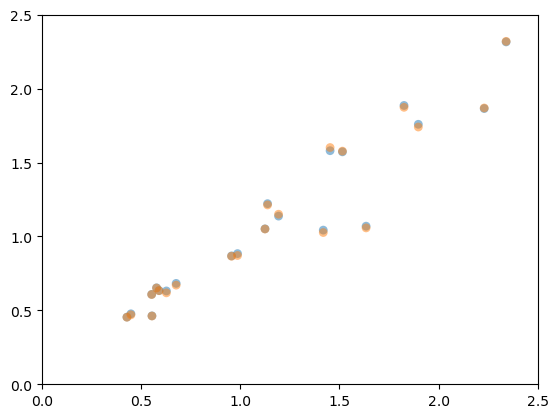

In [30]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_calibration_complete_garonne.loc[:, "qmean_obs"],
            data_diff_calibration_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)
ax.scatter(
            data_diff_calibration_complete_garonne.loc[:, "qmean_obs"],
            data_diff_calibration_complete_garonne.loc[:, "qmean_g1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)

ax.set_xlim(0, 2.5)
ax.set_ylim(0, 2.5)

### Space evaluation

In [24]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim_moselle/space")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"

#start_date = "2003-10-01"
#end_date = "2015-09-30"

start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),
    }


# Convert to DataFrame
data_diff_cal_complete_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)


signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_cal_complete = data_diff_cal_complete_dict_plot.join(signature_df, how='left')

/opt/miniconda3/envs/superf/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/miniconda3/envs/superf/lib/python3.10/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/4024488637.py:62: RuntimeWarning: invalid value encountered in scalar divide
  metric = 1 - np.sum((sim**expo - obs**expo)**2) / np.sum((obs**expo - np.mean(obs**expo))**2)
100%|██████████| 108/108 [00:07<00:00, 14.40it/s]


In [25]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/space")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"

start_date = "1991-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_nogeo': compute_nse(obs, ts["nogeology"].values),
        'nse_g1comp': compute_nse(obs, ts["global"].values),
        'nse_c1comp': compute_nse(obs, ts["continental"].values),
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
        'nse_rand': compute_nse(obs, ts["random"].values),
    }


# Convert to DataFrame
data_diff_cal_complete_dict_plot_garonne = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional', 'continental', 'global', 'nogeology', "random"]

MIN_VALID_POINTS = 365

#def safe_bfi(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]
#
#def safe_hfd(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return hfd_mean(masked_sim, datetime_coord="date")

#def safe_slope(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return slope_fdc(masked_sim)

#def safe_qmean(sim, obs):
#    masked_sim = sim[~np.isnan(obs)]
#    masked_sim = masked_sim[~np.isnan(masked_sim)]
#    if len(masked_sim) < MIN_VALID_POINTS:
#        return np.nan
#    return q_mean(masked_sim)

def safe_bfi(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(sim, datetime_coord="date")

def safe_slope(sim, obs):
    sim = sim.where(~np.isnan(obs))
    #if sim.count() < MIN_VALID_POINTS:
    #    return np.nan
    return slope_fdc(sim)

def safe_qmean(sim, obs):
    sim = sim.where(~np.isnan(obs))
    if sim.count() < MIN_VALID_POINTS:
        return np.nan
    return q_mean(sim)


signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}


# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            # Define correct column name
            source_map = {
            "observation": "obs",
            "regional": "r1comp",
            "continental": "c1comp",
            "global": "g1comp",
            "random": "rand",
            "nogeo": "nogeo"
            }

            col_name = f"{sig_short}_{source_map.get(source, 'nogeo')}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_cal_complete_garonne = data_diff_cal_complete_dict_plot_garonne.join(signature_df, how='left')

100%|██████████| 22/22 [00:01<00:00, 13.47it/s]


In [28]:
import numpy as np

def manual_fdc_slope(
    q,
    p_low=0.33,
    p_high=0.66,
):
    """
    Compute the slope of the flow duration curve (FDC)
    between two exceedance probabilities in log-space.

    Parameters
    ----------
    q : array-like
        Discharge time series (1D).
    p_low : float
        Lower exceedance probability (e.g. 0.33).
    p_high : float
        Upper exceedance probability (e.g. 0.66).

    Returns
    -------
    slope : float
        FDC slope in log(Q) space.
    """

    # Convert to numpy array and clean
    q = np.asarray(q)
    q = q[np.isfinite(q)]
    q = q[q > 0]

    if len(q) < 10:
        return np.nan

    # Sort descending (for exceedance probabilities)
    q_sorted = np.sort(q)[::-1]

    # Exceedance probabilities
    n = len(q_sorted)
    p = np.arange(1, n + 1) / (n + 1)

    # Interpolate discharges at target probabilities
    q_low = np.interp(p_low, p, q_sorted)
    q_high = np.interp(p_high, p, q_sorted)

    if q_low <= 0 or q_high <= 0:
        return np.nan

    # Slope in log space
    slope = (np.log(q_low) - np.log(q_high)) / (p_high - p_low)

    return slope


In [29]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/space")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.median(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
#start_date = "1989-10-01"

start_date = "1992-10-01"
end_date = "2001-09-30"

#selected_gauge_ids = estreams_attributes_clipped_filters.index.unique().tolist()
selected_gauge_ids = combined.gauge_id.values.tolist()

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)


manual_slope_results = []

for gauge in ds_mean_clipped.gauge_id.values:
    obs = ds_mean_clipped.sel(gauge_id=gauge)["observation"].values

    row = {
        "gauge_id": gauge,
        "slope_obs": manual_fdc_slope(obs),
        "slope_g1comp": manual_fdc_slope(
            ds_mean_clipped.sel(gauge_id=gauge)["global"].values
        ),
        "slope_c1comp": manual_fdc_slope(
            ds_mean_clipped.sel(gauge_id=gauge)["continental"].values
        ),
        "slope_r1comp": manual_fdc_slope(
            ds_mean_clipped.sel(gauge_id=gauge)["regional"].values
        ),
    }

    manual_slope_results.append(row)

data_diff_cal_complete_garonne_slopes_manual = (
    pd.DataFrame(manual_slope_results)
    .set_index("gauge_id")
)

data_diff_cal_complete_garonne_slopes_manual

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp
gauge_id,,,,
FR001526,2.693325,3.577978,4.520674,3.401859
FR001544,2.693370,3.386485,3.700182,3.337806
FR001545,2.202884,1.974650,2.241625,1.625939
FR001547,3.312104,3.000159,2.939033,2.448454
FR001551,3.389072,2.815661,2.636421,2.793504
FR001577,4.636208,3.063934,2.690551,3.327019
FR001584,1.875876,2.139816,2.197328,1.783107
FR001592,3.534403,3.097223,2.897435,3.742797
FR001593,3.052129,2.998681,2.471910,3.742565


In [279]:
data_diff_cal_complete_garonne_slopes_manual["group"] = network_estreams_garonne_22_gauges["group"]
data_diff_cal_complete_garonne_slopes_manual

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp,group
gauge_id,,,,,
FR001526,2.693325,3.506652,4.787631,3.226900,Group_2
FR001544,2.693370,3.255995,3.999006,3.298999,Group_2
FR001545,2.202884,2.003047,2.112224,1.737755,Group_1
FR001547,3.312104,2.677322,3.032021,2.506029,Group_1
FR001551,3.389072,2.781885,2.574263,2.749749,Group_2
FR001577,4.636208,2.537899,2.783703,3.362056,Group_1
FR001584,1.875876,2.228581,2.075936,1.835035,Group_1
FR001592,3.534403,2.752577,2.988620,3.610896,Group_1
FR001593,3.052129,2.747053,2.483075,3.585874,Group_1


In [280]:
data_diff_cal_complete_garonne_slopes_manual_1 = data_diff_cal_complete_garonne_slopes_manual[data_diff_cal_complete_garonne_slopes_manual.group == "Group_1"]
data_diff_cal_complete_garonne_slopes_manual_1.iloc[:, :-1].corr(method="spearman")

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp
slope_obs,1.000000,0.536364,0.618182,0.690909
slope_g1comp,0.536364,1.000000,0.672727,0.909091
slope_c1comp,0.618182,0.672727,1.000000,0.681818
slope_r1comp,0.690909,0.909091,0.681818,1.000000


In [281]:
data_diff_cal_complete_garonne_slopes_manual_2 = data_diff_cal_complete_garonne_slopes_manual[data_diff_cal_complete_garonne_slopes_manual.group == "Group_2"]
data_diff_cal_complete_garonne_slopes_manual_2.iloc[:, :-1].corr(method="spearman")

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp
slope_obs,1.000000,0.300000,0.263636,0.563636
slope_g1comp,0.300000,1.000000,0.909091,0.854545
slope_c1comp,0.263636,0.909091,1.000000,0.872727
slope_r1comp,0.563636,0.854545,0.872727,1.000000


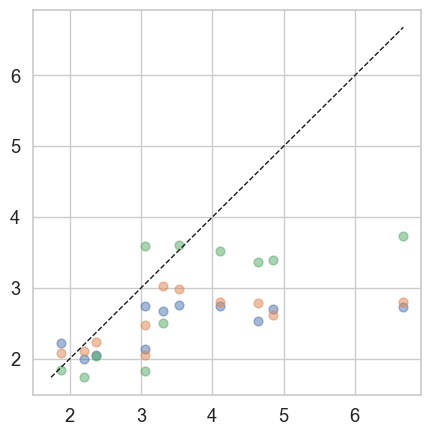

In [306]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(5, 5))

# Scatter plots
ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_1["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_1["slope_g1comp"],
    alpha=0.5,
    s=40,
    label="Global",
)

ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_1["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_1["slope_c1comp"],
    alpha=0.5,
    s=40,
    label="Continental",
)

ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_1["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_1["slope_r1comp"],
    alpha=0.5,
    s=40,
    label="Regional",
)

# 1:1 line
lims = [
    np.nanmin(data_diff_cal_complete_garonne_slopes_manual_1[[
        "slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"
    ]].values),
    np.nanmax(data_diff_cal_complete_garonne_slopes_manual_1[[
        "slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"
    ]].values),
]

ax.plot(lims, lims, "--k", linewidth=1)


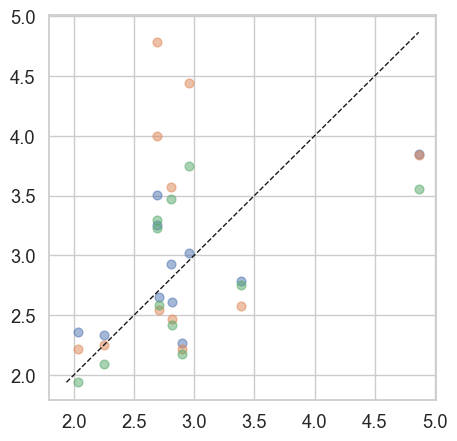

In [307]:
import matplotlib.pyplot as plt
import numpy as np

fig, ax = plt.subplots(figsize=(5, 5))

# Scatter plots
ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_2["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_2["slope_g1comp"],
    alpha=0.5,
    s=40,
    label="Global",
)

ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_2["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_2["slope_c1comp"],
    alpha=0.5,
    s=40,
    label="Continental",
)

ax.scatter(
    data_diff_cal_complete_garonne_slopes_manual_2["slope_obs"],
    data_diff_cal_complete_garonne_slopes_manual_2["slope_r1comp"],
    alpha=0.5,
    s=40,
    label="Regional",
)

# 1:1 line
lims = [
    np.nanmin(data_diff_cal_complete_garonne_slopes_manual_2[[
        "slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"
    ]].values),
    np.nanmax(data_diff_cal_complete_garonne_slopes_manual_2[[
        "slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"
    ]].values),
]

ax.plot(lims, lims, "--k", linewidth=1)


In [70]:
data_diff_val_complete_all.columns

Index(['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp', 'nse_rand',
       'bfi_obs', 'bfi_r1comp', 'bfi_c1comp', 'bfi_g1comp', 'bfi_nogeo',
       'bfi_rand', 'hfd_obs', 'hfd_r1comp', 'hfd_c1comp', 'hfd_g1comp',
       'hfd_nogeo', 'hfd_rand', 'slope_obs', 'slope_r1comp', 'slope_c1comp',
       'slope_g1comp', 'slope_nogeo', 'slope_rand', 'qmean_obs',
       'qmean_r1comp', 'qmean_c1comp', 'qmean_g1comp', 'qmean_nogeo',
       'qmean_rand'],
      dtype='object')

In [ ]:
data_diff_val_complete_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand,group
FR001526,0.759811,0.768505,0.717198,0.771415,0.763624,0.536568,0.615452,0.500372,0.612854,0.606179,...,3.505714,3.514874,3.540969,0.695679,0.688994,0.693618,0.681165,0.695562,0.684929,Group_2
FR001544,0.620939,0.634269,0.561189,0.608054,0.579920,0.546071,0.531409,0.492822,0.592328,0.607934,...,3.254607,2.948356,3.032874,1.642309,1.116343,1.122482,1.110449,1.114802,1.101214,Group_2
FR001545,0.643119,0.668497,0.668760,0.656754,0.554554,0.660797,0.751743,0.707366,0.658984,0.633996,...,2.001332,2.212784,2.769905,2.217747,1.705018,1.731143,1.706613,1.685353,1.701869,Group_1
FR001547,0.710883,0.728062,0.762845,0.694016,0.740414,0.448487,0.658318,0.569546,0.617381,0.634537,...,2.674546,2.549485,2.732328,0.938894,0.856120,0.867142,0.857667,0.850632,0.851642,Group_1
FR001551,0.804303,0.798806,0.777610,0.808594,0.766212,0.513833,0.620030,0.640836,0.633065,0.608125,...,2.781406,2.936558,2.781721,0.982021,0.910885,0.916561,0.902216,0.914853,0.901759,Group_2
FR001577,0.753249,0.775660,0.799752,0.824889,0.788971,0.448483,0.530184,0.575277,0.596091,0.629196,...,2.556416,2.525991,2.757690,1.120138,1.006572,1.021656,1.010054,0.998143,1.013099,Group_1
FR001584,0.669885,0.693745,0.748329,0.782880,0.564219,0.721995,0.727968,0.697485,0.654074,0.639189,...,2.228083,2.268927,2.578307,1.544711,1.449634,1.440342,1.460909,1.441806,1.454605,Group_1
FR001592,0.672982,0.685132,0.697847,0.691998,0.675141,0.530365,0.548160,0.600490,0.636623,0.653919,...,2.746716,2.642606,3.648758,0.422938,0.476625,0.478382,0.478668,0.482837,0.473732,Group_1
FR001593,0.770262,0.777416,0.759210,0.752543,0.782441,0.561810,0.548726,0.637976,0.640895,0.651617,...,2.746695,2.635582,2.853609,0.551299,0.482836,0.467449,0.485000,0.488815,0.476885,Group_1
FR001604,0.696127,0.768093,0.744333,0.768211,0.732439,0.687982,0.679500,0.661450,0.666756,0.622363,...,2.332853,2.674629,2.646732,1.208547,1.212998,1.221534,1.208699,1.212609,1.199644,Group_2


In [45]:
q = ds_mean_clipped.sel(gauge_id="FR004119")["regional"].values
slope_manual = manual_fdc_slope(q)
#slope_existing = safe_slope(q)

print("Manual slope:", slope_manual)
#print("Existing slope:", slope_existing)

NameError: name 'manual_fdc_slope' is not defined

In [28]:
data_diff_cal_complete_garonne[["slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"]].corr()

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp
slope_obs,1.000000,0.575171,0.101074,0.665022
slope_g1comp,0.575171,1.000000,0.694601,0.841517
slope_c1comp,0.101074,0.694601,1.000000,0.616528
slope_r1comp,0.665022,0.841517,0.616528,1.000000


In [207]:
data_diff_cal_complete_garonne[["slope_obs", "slope_g1comp", "slope_c1comp", "slope_r1comp"]].corr(method="spearman")

,slope_obs,slope_g1comp,slope_c1comp,slope_r1comp
slope_obs,1.000000,0.681818,0.172727,0.331169
slope_g1comp,0.681818,1.000000,0.428571,0.505195
slope_c1comp,0.172727,0.428571,1.000000,0.836364
slope_r1comp,0.331169,0.505195,0.836364,1.000000


In [226]:
path_inputs = '../data/models/inputgaronne/subset_2001_2015'

inputs = np.load(path_inputs+'//inputs.npy', allow_pickle=True).item()
observations = np.load(path_inputs+'//observations.npy', allow_pickle=True).item()
areas = np.load(path_inputs+'//areas.npy', allow_pickle=True).item()
perm_areas = np.load(path_inputs+'//perm_areas.npy', allow_pickle=True).item()
perm_areasglobal = np.load(path_inputs+'//perm_areasglobal.npy', allow_pickle=True).item()
perm_areascontinental = np.load(path_inputs+'//perm_areascontinental.npy', allow_pickle=True).item()


In [228]:
perm_areas["FR004119"]

[0.01, 0.84, 0.15]

In [231]:
perm_areascontinental["FR004119"]

[0.05, 0.95, 0.0]

In [229]:
perm_areasglobal["FR004119"]

[0.29, 0.71, 0.0]

In [223]:
estreams_attributes_garonne_clipped_filters.loc["FR004119", ['perm_high_glob2',
       'perm_medium_glob2', 'perm_low_glob2']]

perm_high_glob2      29.0
perm_medium_glob2    71.0
perm_low_glob2        0.0
Name: FR004119, dtype: object

In [224]:
estreams_attributes_garonne_clipped_filters.loc["FR004119", ['perm_high_cont2',
       'perm_medium_cont2', 'perm_low_cont2']]

perm_high_cont2       5.462
perm_medium_cont2    94.538
perm_low_cont2          0.0
Name: FR004119, dtype: object

In [209]:
data_diff_cal_complete_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
FR001526,0.823155,0.818761,0.695640,0.741941,0.825804,0.530351,0.570035,0.460036,0.579859,0.563238,...,5.331818,3.459657,2.692069,3.193849,0.606009,0.617393,0.627393,0.605173,0.596763,0.613089
FR001544,0.615188,0.627821,0.535586,0.587546,0.626022,0.566691,0.500709,0.462851,0.563668,0.573442,...,4.118061,3.329136,2.615098,1.553332,1.567874,1.090514,1.112081,1.075824,1.056376,1.055643
FR001545,0.600581,0.680479,0.698337,0.695118,0.553796,0.677677,0.702224,0.701876,0.668892,0.626392,...,2.041034,1.931296,2.076268,2.476118,2.247862,1.656175,1.662618,1.667155,1.580947,1.637605
FR001547,0.718699,0.741092,0.761473,0.715470,0.740807,0.423456,0.624494,0.570000,0.582984,0.608519,...,2.127623,3.270935,2.474995,2.961427,0.826319,0.873916,0.852359,0.887565,0.877291,0.874580
FR001551,0.777847,0.784541,0.746690,0.733093,0.763302,0.561369,0.590962,0.621936,0.618599,0.586707,...,3.093634,2.973148,2.752771,2.672035,0.769947,0.816167,0.826758,0.803777,0.793136,0.807933
FR001577,0.786095,0.832056,0.784837,0.807182,0.815954,0.460694,0.547490,0.579808,0.545859,0.603946,...,2.483886,3.940374,2.682992,3.382618,0.949110,0.894350,0.896754,0.936835,0.917044,0.926401
FR001584,0.707494,0.757769,0.789041,0.803233,0.680637,0.710721,0.698911,0.684272,0.666688,0.632126,...,2.252400,2.087326,2.266344,2.477461,1.427834,1.334923,1.340900,1.343194,1.282618,1.328159
FR001592,0.511762,0.578521,0.566696,0.576440,0.562174,0.469850,0.581076,0.613474,0.581029,0.632206,...,2.173798,4.224933,2.919878,5.073496,0.237250,0.304186,0.296921,0.298579,0.326845,0.309043
FR001593,0.647666,0.654460,0.717727,0.701203,0.683931,0.600819,0.584903,0.618985,0.603133,0.633297,...,2.695683,3.740347,2.888222,3.211882,0.273265,0.309251,0.302839,0.303262,0.333029,0.310252
FR001604,0.665757,0.738726,0.753917,0.727692,0.720712,0.694285,0.638883,0.649593,0.651742,0.596024,...,2.566298,2.479758,2.594820,2.830480,1.101972,0.953616,0.959899,0.939686,0.928162,0.946139


In [204]:
data_diff_cal_complete_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
FR001526,0.832174,0.826937,0.712341,0.754251,0.834513,0.527837,0.569208,0.459122,0.576937,0.557776,...,5.406510,3.543334,2.736111,3.259481,0.617528,0.646237,0.657641,0.628934,0.619419,0.637131
FR001544,0.623393,0.634372,0.550544,0.598578,0.631276,0.563461,0.499378,0.461590,0.561584,0.571672,...,4.153462,3.352676,2.628571,1.584593,1.584627,1.115033,1.137698,1.095961,1.074602,1.070311
FR001545,0.617154,0.695631,0.711531,0.707534,0.577620,0.676485,0.706602,0.706252,0.672851,0.630345,...,2.046168,1.938787,2.087585,2.448093,2.254198,1.668454,1.676011,1.677322,1.584376,1.646544
FR001547,0.720693,0.741878,0.762751,0.715249,0.741208,0.418647,0.625148,0.569698,0.583463,0.606675,...,2.125815,3.325183,2.519606,3.009982,0.832632,0.883546,0.863331,0.898591,0.879064,0.883079
FR001551,0.776703,0.782631,0.745416,0.731132,0.761385,0.555873,0.590155,0.620846,0.616632,0.585468,...,3.090581,2.963850,2.750007,2.647816,0.772781,0.824147,0.835119,0.807503,0.797746,0.812657
FR001577,0.791557,0.833134,0.787897,0.810768,0.817375,0.449906,0.546959,0.578741,0.543756,0.600561,...,2.481278,3.930644,2.692359,3.367072,0.953381,0.900652,0.904045,0.943209,0.913943,0.930425
FR001584,0.728671,0.771293,0.803346,0.814680,0.701206,0.709179,0.701360,0.687439,0.668838,0.634500,...,2.281319,2.090659,2.297826,2.499504,1.432658,1.352643,1.361015,1.361181,1.292256,1.345090
FR001592,0.565252,0.608119,0.600577,0.612631,0.600684,0.464191,0.577782,0.609061,0.579330,0.627402,...,2.161509,4.295140,2.969404,5.221061,0.253046,0.310765,0.303163,0.306032,0.330973,0.316508
FR001593,0.672216,0.668325,0.729751,0.716812,0.700212,0.591418,0.581031,0.614914,0.600751,0.628252,...,2.678067,3.800186,2.950513,3.245568,0.282965,0.316407,0.310113,0.311122,0.338055,0.317215
FR001604,0.683328,0.747731,0.765513,0.741050,0.733228,0.691011,0.639568,0.649490,0.650195,0.595839,...,2.570454,2.491163,2.597789,2.818353,1.113113,0.972240,0.977596,0.951072,0.941689,0.961121


(0.0, 2.5)

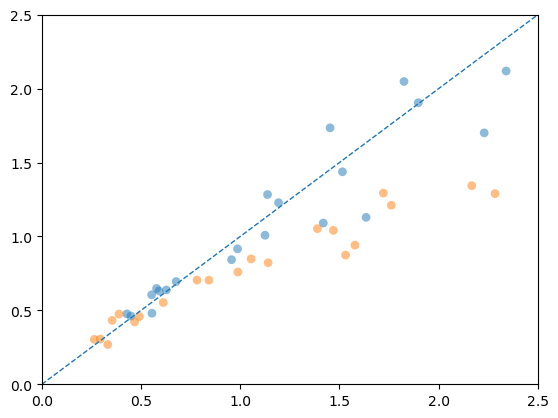

In [33]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_cal_complete_garonne.loc[:, "qmean_obs"],
            data_diff_cal_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)
ax.scatter(
            data_diff_val_complete_garonne.loc[:, "qmean_obs"],
            data_diff_val_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)
# 1:1 line
lims = [
    min(0, 2.5),
    max(0, 2.5),
]

ax.plot(lims, lims, linestyle='--', linewidth=1, zorder=2)

# Ensure limits stay fixed
ax.set_xlim(lims)
ax.set_ylim(lims)



### Copy the data

<Axes: >

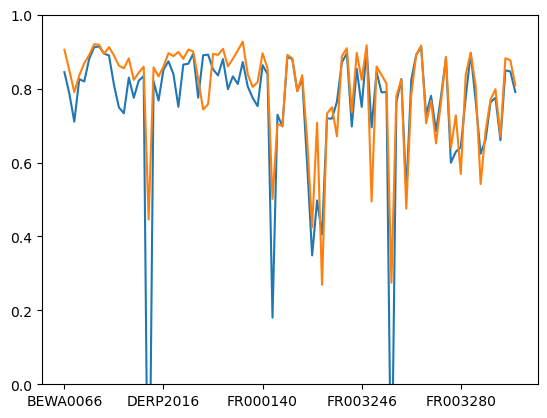

In [34]:
data_diff_cal_complete.nse_rand.plot()
data_diff_cal_complete.nse_r1comp.plot(ylim=(0,1))

<Axes: >

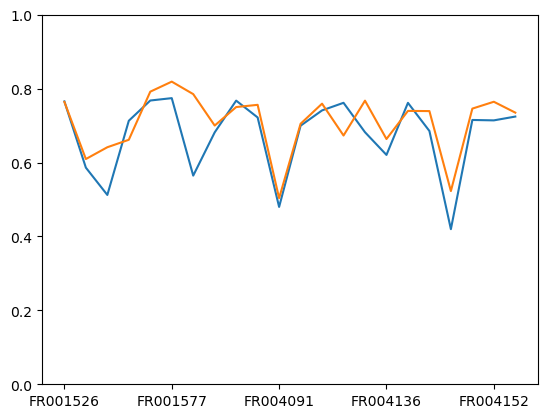

In [35]:
data_diff_cal_complete_garonne.nse_rand.plot()
data_diff_cal_complete_garonne.nse_r1comp.plot(ylim=(0,1))

<Axes: >

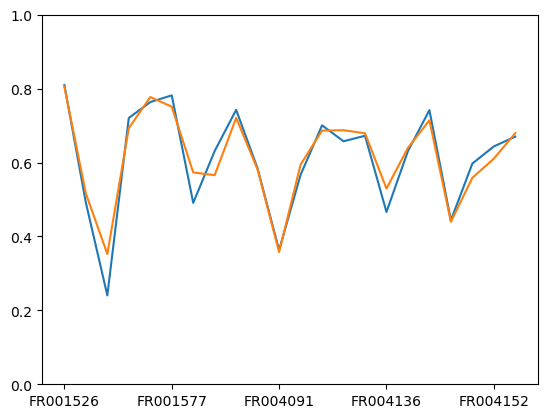

In [40]:
data_diff_val_complete_garonne.nse_rand.plot()
data_diff_val_complete_garonne.nse_nogeo.plot(ylim=(0,1))

<Axes: >

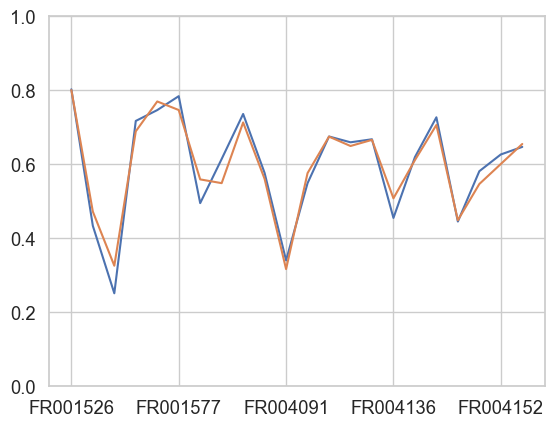

In [558]:
data_diff_val_complete_garonne.nse_rand.plot()
data_diff_val_complete_garonne.nse_nogeo.plot(ylim=(0,1))

<Axes: >

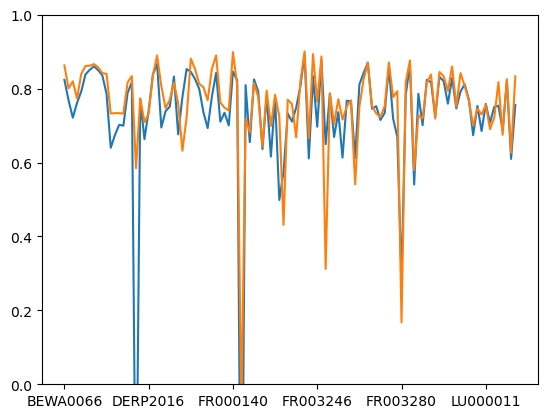

In [19]:
data_diff_val_complete.nse_rand.plot()
data_diff_val_complete.nse_r1comp.plot(ylim=(0,1))

<Axes: >

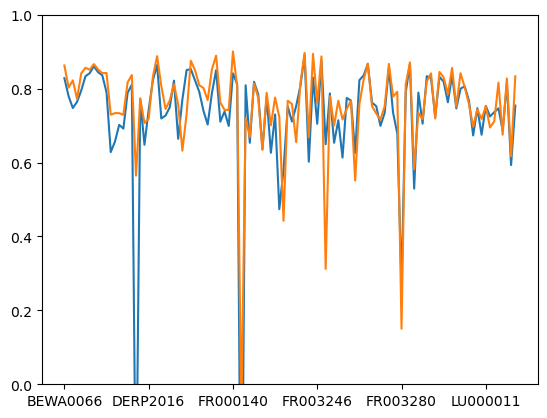

In [17]:
data_diff_val_complete.nse_rand.plot()
data_diff_val_complete.nse_r1comp.plot(ylim=(0,1))

<Axes: >

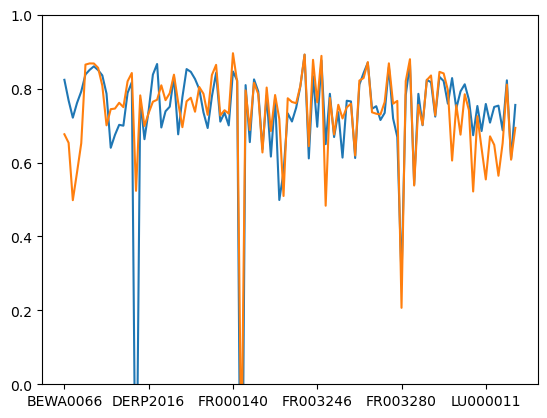

In [20]:
data_diff_val_complete.nse_rand.plot()
data_diff_val_complete.nse_g1comp.plot(ylim=(0,1))

<Axes: >

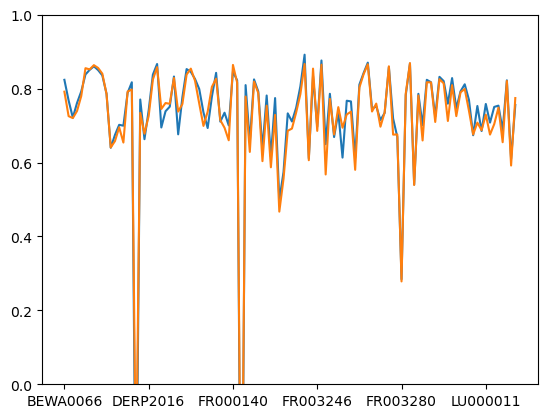

In [22]:
data_diff_val_complete.nse_rand.plot()
data_diff_val_complete.nse_nogeo.plot(ylim=(0,1))

## Comparison to Fenicia

In [49]:
catchments_ids_fenicia = ['FR000184',
 'DERP2017',
 'DERP2011',
 'DERP2013',
 'DERP2007',
 'DERP2024',
 'FR003253',
 'FR003283',
 'FR003301',
 'DERP2003',
 'FR003265',
 'FR003272',
 'DEBU1958',
 'FR000144',
 'DERP2033',
 'FR003275',
 'DERP2004',
 'FR003271',
 'LU000007',
 'FR003237',
 'FR000171',
 'FR000159',
 'FR003249',
 'DEBU1957',
 'DEBU1956',
 'DEBU1959']

data_diff_val_complete.loc[catchments_ids_fenicia].describe()

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,...,25.000000,25.000000,25.000000,25.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,0.682681,0.753543,0.761077,0.772340,0.682317,0.602607,0.642273,0.649917,0.652374,0.668806,...,2.219869,2.126352,1.945625,2.121996,1.023416,0.858909,0.862150,0.858475,0.857596,0.864432
std,0.362498,0.223115,0.222804,0.191463,0.394411,0.081625,0.076886,0.062712,0.067512,0.013826,...,0.499252,0.442908,0.190711,0.225221,0.383990,0.352601,0.353141,0.345514,0.352392,0.352748
min,-0.594236,-0.245429,-0.283115,-0.082643,-0.647306,0.428614,0.549321,0.576642,0.556496,0.623118,...,0.966132,1.340463,1.697914,1.867535,0.599839,0.459563,0.459805,0.464646,0.458604,0.462698
25%,0.739599,0.754584,0.755753,0.771774,0.749483,0.554495,0.589153,0.614505,0.607523,0.663861,...,2.085674,1.870310,1.847772,1.968688,0.753784,0.658156,0.665188,0.660992,0.657673,0.665714
50%,0.784414,0.804171,0.807479,0.818434,0.798846,0.609677,0.629454,0.642772,0.642635,0.669960,...,2.237199,2.194340,1.906008,2.087400,0.936287,0.760669,0.765911,0.762230,0.760704,0.764915
75%,0.849251,0.859519,0.859448,0.859299,0.849402,0.627822,0.648360,0.655646,0.690661,0.676506,...,2.499334,2.363347,1.968160,2.149235,1.235020,1.011183,1.007041,0.997393,1.000854,1.009173
max,0.863509,0.892251,0.896352,0.904300,0.887157,0.819056,0.835113,0.828199,0.790562,0.699517,...,3.103452,2.882855,2.703321,2.863976,2.411200,2.218345,2.220091,2.194696,2.215743,2.226709


In [50]:
data_diff_val_complete_ff = data_diff_val_complete.loc[catchments_ids_fenicia]

In [53]:
data_diff_val_complete_ff.describe()

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
count,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000,...,25.000000,25.000000,25.000000,25.000000,26.000000,26.000000,26.000000,26.000000,26.000000,26.000000
mean,0.682681,0.753543,0.761077,0.772340,0.682317,0.602607,0.642273,0.649917,0.652374,0.668806,...,2.219869,2.126352,1.945625,2.121996,1.023416,0.858909,0.862150,0.858475,0.857596,0.864432
std,0.362498,0.223115,0.222804,0.191463,0.394411,0.081625,0.076886,0.062712,0.067512,0.013826,...,0.499252,0.442908,0.190711,0.225221,0.383990,0.352601,0.353141,0.345514,0.352392,0.352748
min,-0.594236,-0.245429,-0.283115,-0.082643,-0.647306,0.428614,0.549321,0.576642,0.556496,0.623118,...,0.966132,1.340463,1.697914,1.867535,0.599839,0.459563,0.459805,0.464646,0.458604,0.462698
25%,0.739599,0.754584,0.755753,0.771774,0.749483,0.554495,0.589153,0.614505,0.607523,0.663861,...,2.085674,1.870310,1.847772,1.968688,0.753784,0.658156,0.665188,0.660992,0.657673,0.665714
50%,0.784414,0.804171,0.807479,0.818434,0.798846,0.609677,0.629454,0.642772,0.642635,0.669960,...,2.237199,2.194340,1.906008,2.087400,0.936287,0.760669,0.765911,0.762230,0.760704,0.764915
75%,0.849251,0.859519,0.859448,0.859299,0.849402,0.627822,0.648360,0.655646,0.690661,0.676506,...,2.499334,2.363347,1.968160,2.149235,1.235020,1.011183,1.007041,0.997393,1.000854,1.009173
max,0.863509,0.892251,0.896352,0.904300,0.887157,0.819056,0.835113,0.828199,0.790562,0.699517,...,3.103452,2.882855,2.703321,2.863976,2.411200,2.218345,2.220091,2.194696,2.215743,2.226709


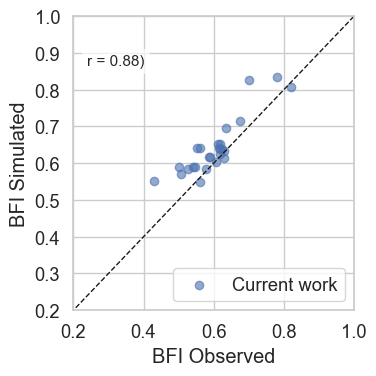

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

df = data_diff_val_complete_ff


x1 = df["bfi_obs"]
y1 = df["bfi_r1comp"]

# Pearson correlations
r1, p1 = pearsonr(x1, y1)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.figure(figsize=(4, 4))

plt.scatter(x1, y1, alpha=0.6)

# 1:1 line
lims = [0, 1]
plt.plot(lims, lims, "k--", linewidth=1)

plt.xlabel("BFI Observed")
plt.ylabel("BFI Simulated")
plt.xlim(0.2, 1)
plt.ylim(0.2, 1)
plt.grid(True)

# ------------------------------------------------------------
# Add Pearson r annotations
# ------------------------------------------------------------


plt.text(
    0.05, 0.87,
    rf"r = {r1:.2f})",
    transform=plt.gca().transAxes,
    ha="left", va="top",
    fontsize=11,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.7)
)

plt.legend(["Current work"])
plt.tight_layout()
plt.savefig("../results/figs/figures/SX_comparisonFF.png", dpi=300)
plt.show()


## Merge the results

In [26]:
# Merge the results
data_diff_cal_complete_all = pd.concat(
    [data_diff_cal_complete, data_diff_cal_complete_garonne],
    axis=0
)

data_diff_val_complete_all = pd.concat(
    [data_diff_val_complete, data_diff_val_complete_garonne],
    axis=0
)

data_diff_calibration_complete_all = pd.concat(
    [data_diff_calibration_complete, data_diff_calibration_complete_garonne],
    axis=0
)

## Plots and analysis

### CDF curves

#### Plot of the curves

In [27]:
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.sans-serif'] = ['DejaVu Sans']  # or another consistent font

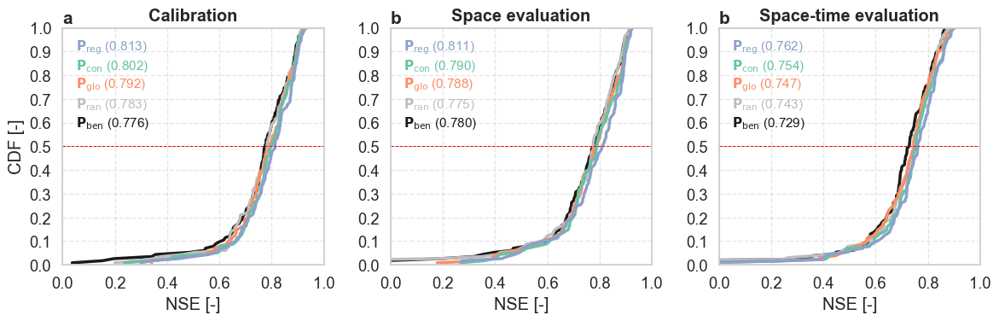

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# -------------------------
# Color and label maps
# -------------------------
colors = {
    'nse_rand': '#bdbdbd',
    'nse_nogeo': 'k',
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}

labels_pretty = {
    'nse_rand': r"$\mathbf{P_{\mathrm{ran}}}$",
    'nse_nogeo': r"$\mathbf{P_{\mathrm{ben}}}$",
    'nse_g1comp': r"$\mathbf{P_{\mathrm{glo}}}$",
    'nse_c1comp': r"$\mathbf{P_{\mathrm{con}}}$",
    'nse_r1comp': r"$\mathbf{P_{\mathrm{reg}}}$",
}

model_order = [
    'nse_nogeo',
    'nse_rand',
    'nse_g1comp',
    'nse_c1comp',
    'nse_r1comp'
]

# -------------------------
# Plotting function
# -------------------------
def plot_cdf_mean(ax, data_input, title, label_letter):

    # Handle dict or DataFrame input
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")

    # Mean over repetitions
    data_combined = all_data.groupby(all_data.index).mean()

    medians = {}

    # ---- Plot CDFs ----
    for model_type in model_order:
        if model_type not in data_combined.columns:
            continue

        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue

        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)

        ax.plot(
            nse_values,
            cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

        medians[model_type] = np.median(nse_values)

    # ---- Median text inside plot ----
    y0 = 0.6        # starting vertical position (axes coords)
    dy = 0.08        # vertical spacing

    for i, model_type in enumerate(model_order):
        if model_type not in medians:
            continue

        ax.text(
            0.05,
            y0 + i * dy,
            f"{labels_pretty[model_type]} ({medians[model_type]:.3f})",
            transform=ax.transAxes,
            fontsize=11,
            color=colors[model_type],
            ha='left',
            va='center'
        )

    # ---- Axis formatting ----
    ax.set_title(title, fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label
    ax.text(
        0,
        1.075,
        label_letter,
        transform=ax.transAxes,
        fontsize=15,
        fontweight='bold',
        va='top',
        ha='left'
    )

# -------------------------
# Figure layout
# -------------------------
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=False)

# ---- Legend-only panel ----
#axs[0].axis("off")

#for model_type in model_order:
#    axs[0].plot(
#        [],
#        [],
#        color=colors[model_type],
#        linewidth=2.5,
#        label=labels_pretty[model_type]
#    )
#
#axs[0].legend(
#    title="Model experiment",
#    loc="center",
#    frameon=False,
#    fontsize=12,
#    title_fontsize=14
#)

# ---- Space evaluation ----
plot_cdf_mean(
    axs[0],
    data_diff_calibration_complete_all,
    "Calibration",
    "a"
)

# ---- Space-time evaluation ----
plot_cdf_mean(
    axs[1],
    data_diff_cal_complete_all,
    "Space evaluation",
    "b"
)

# ---- Space-time evaluation ----
plot_cdf_mean(
    axs[2],
    data_diff_val_complete_all,
    "Space-time evaluation",
    "b"
)

axs[0].set_ylabel("CDF [-]")
#axs[0].hlines(xmin=0, xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)
#axs[1].hlines(xmin=0, xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)
#axs[2].hlines(xmin=0,xmax=1, y=0.5, color='red', linestyle='--', linewidth=0.7)

# ---- Save & show ----
plt.tight_layout()
plt.savefig(
    "../results/figs/figures/three_cdfs_new.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

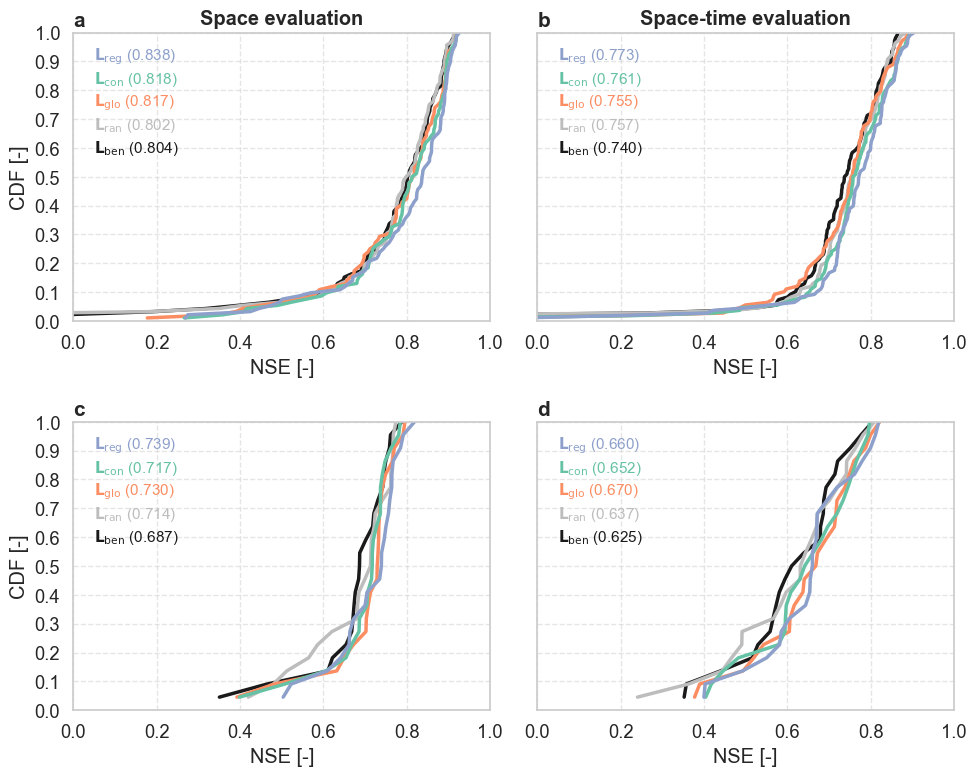

In [47]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns

# -------------------------
# Color and label maps
# -------------------------
colors = {
    'nse_rand': '#bdbdbd',
    'nse_nogeo': 'k',
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}

labels_pretty = {
    'nse_rand': r"$\mathbf{L_{\mathrm{ran}}}$",
    'nse_nogeo': r"$\mathbf{L_{\mathrm{ben}}}$",
    'nse_g1comp': r"$\mathbf{L_{\mathrm{glo}}}$",
    'nse_c1comp': r"$\mathbf{L_{\mathrm{con}}}$",
    'nse_r1comp': r"$\mathbf{L_{\mathrm{reg}}}$",
}

model_order = [
    'nse_nogeo',
    'nse_rand',
    'nse_g1comp',
    'nse_c1comp',
    'nse_r1comp'
]

# -------------------------
# Plotting function (UNCHANGED)
# -------------------------
def plot_cdf_mean(ax, data_input, title, label_letter):

    if isinstance(data_input, dict):
        all_data = pd.concat(list(data_input.values()), axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict or DataFrame")

    data_combined = all_data.groupby(all_data.index).mean()
    medians = {}

    for model_type in model_order:
        if model_type not in data_combined.columns:
            continue

        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue

        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)

        ax.plot(
            nse_values,
            cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

        medians[model_type] = np.median(nse_values)

    y0, dy = 0.6, 0.08
    for i, model_type in enumerate(model_order):
        if model_type in medians:
            ax.text(
                0.05, y0 + i * dy,
                f"{labels_pretty[model_type]} ({medians[model_type]:.3f})",
                transform=ax.transAxes,
                fontsize=11,
                color=colors[model_type],
                ha="left", va="center"
            )

    ax.set_title(title, fontweight="bold")
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle="--", alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    ax.text(
        0, 1.075, label_letter,
        transform=ax.transAxes,
        fontsize=15, fontweight="bold",
        va="top", ha="left"
    )

# -------------------------
# Figure layout (2x2)
# -------------------------
sns.set(style="whitegrid", font_scale=1.2)
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharey=True)

basins = {
    "Moselle": network_estreams_moselle_108_gauges.index.tolist(),
    "Garonne": network_estreams_garonne_22_gauges.index.tolist(),
}

labels = ["a", "b", "c", "d"]
panel = 0

for i, (basin_name, basin_ids) in enumerate(basins.items()):

    # ---- Filter data ----
    df_space = data_diff_cal_complete_all.copy()
    df_space["basin_id"] = df_space.index
    df_space = df_space[df_space["basin_id"].isin(basin_ids)]

    df_space_time = data_diff_val_complete_all.copy()
    df_space_time["basin_id"] = df_space_time.index
    df_space_time = df_space_time[df_space_time["basin_id"].isin(basin_ids)]

    # ---- Space ----
    plot_cdf_mean(
        axs[i, 0],
        df_space.iloc[:, 0:5],
        f" ",
        labels[panel]
    )
    panel += 1

    # ---- Space-time ----
    plot_cdf_mean(
        axs[i, 1],
        df_space_time.iloc[:, 0:5],
        f" ",
        labels[panel]
    )
    panel += 1
axs[0, 0].set_title("Space evaluation", fontweight="bold")
axs[0, 1].set_title("Space-time evaluation", fontweight="bold")

# Shared y-label
axs[0, 0].set_ylabel("CDF [-]")
axs[1, 0].set_ylabel("CDF [-]")

# Legend (only once)
#axs[0, 1].legend(frameon=False, loc="lower right")

plt.tight_layout()
plt.savefig(
    "../results/figs/figures/SX_four_cdfs_PB_moselle_garonne.png",
    dpi=300,
    bbox_inches="tight"
)
plt.show()


In [37]:
estreams_attributes.slope_sawicz.max()

25.577

In [41]:
data_diff_val_complete_all.slope_obs.describe()

count    124.000000
mean       2.787201
std        0.878719
min        0.911200
25%        2.246515
50%        2.582173
75%        3.171750
max        7.140418
Name: slope_obs, dtype: float64

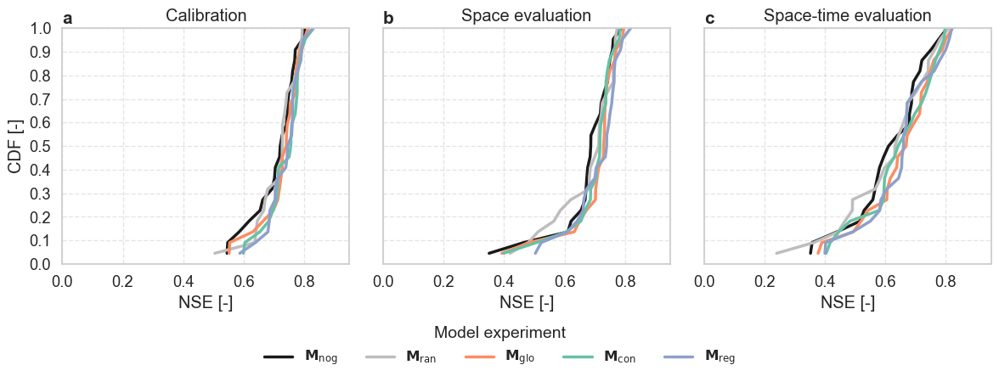

In [41]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as ticker

# Plotting function
def plot_cdf_mean(ax, data_input, title, label_letter):
    # Check if input is a dict or DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")
    
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_nogeo', "nse_rand", 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.95)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')


# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_rand': '#bdbdbd',
    'nse_nogeo': 'k',
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',

}
labels_pretty = {
    'nse_rand': r"$\mathbf{M_{\mathrm{ran}}}$",
    'nse_nogeo': r"$\mathbf{M_{\mathrm{nog}}}$",
    'nse_g1comp': r"$\mathbf{M_{\mathrm{glo}}}$",
    'nse_c1comp': r"$\mathbf{M_{\mathrm{con}}}$",
    'nse_r1comp': r"$\mathbf{M_{\mathrm{reg}}}$",
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

# Calibration and space validation use dictionaries
plot_cdf_mean(axs[0], data_diff_calibration_complete_dict_plot_garonne.iloc[:], "Calibration", "a")
axs[0].set_ylabel("CDF [-]")

plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot_garonne, "Space evaluation", "b")

# Space-time validation uses the DataFrame directly
plot_cdf_mean(axs[2], data_diff_val_complete_dict_plot_garonne, "Space-time evaluation", "c")

# Legend shared
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           title="Model experiment",
           loc='lower center',
           bbox_to_anchor=(0.5, -0.15),
           ncol=5,
           fontsize=12,
           title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
#plt.savefig(
#    "../results/figs/three_cdfs.png",
#    dpi=300,
#    bbox_inches='tight'
#)

plt.show()

In [42]:
data_diff_calibration_complete_all[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,114.000000,114.000000,114.000000,114.000000,114.000000
mean,0.754339,0.764934,0.775604,0.781861,0.790059
std,0.149325,0.127747,0.115202,0.117052,0.114346
min,0.036516,0.199455,0.341079,0.236784,0.299223
25%,0.717071,0.715015,0.727479,0.733686,0.739675
50%,0.775723,0.782643,0.792452,0.801573,0.813469
75%,0.852708,0.853653,0.859026,0.862079,0.875733
max,0.917777,0.922713,0.932337,0.929192,0.934571


In [43]:
data_diff_cal_complete_all[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,114.000000,114.000000,114.000000,114.000000,114.000000
mean,0.740094,0.736482,0.760818,0.767053,0.776234
std,0.184288,0.205685,0.135663,0.129006,0.134181
min,-0.423286,-0.580053,0.177420,0.266240,0.269013
25%,0.691759,0.711136,0.707258,0.712576,0.728948
50%,0.779860,0.775183,0.787883,0.789741,0.811245
75%,0.848990,0.844764,0.860448,0.868349,0.881681
max,0.921678,0.914332,0.920582,0.924144,0.926971


In [65]:
data_diff_val_complete_all[["nse_nogeo", "nse_rand", "nse_g1comp", "nse_c1comp", "nse_r1comp"]].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,130.000000,130.000000,130.000000,130.000000,130.000000
mean,0.697066,0.704544,0.715108,0.729495,0.738358
std,0.186477,0.201863,0.143039,0.143786,0.135687
min,-0.594236,-0.647306,-0.245429,-0.283115,-0.082643
25%,0.667809,0.677308,0.669270,0.692391,0.697325
50%,0.728928,0.743227,0.746592,0.754457,0.761609
75%,0.791427,0.807255,0.799694,0.811397,0.823901
max,0.866010,0.887157,0.892251,0.896352,0.904300


In [66]:
data_diff_cal_complete_dict_plot_garonne[['nse_nogeo', 'nse_rand', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,22.000000,22.000000,22.000000,22.000000,22.000000
mean,0.675700,0.675393,0.699792,0.692804,0.708924
std,0.099326,0.101724,0.094717,0.089147,0.082111
min,0.350443,0.419649,0.392414,0.398559,0.503551
25%,0.668735,0.635813,0.702373,0.685743,0.665955
50%,0.686928,0.713514,0.730162,0.717310,0.739397
75%,0.739366,0.756342,0.740546,0.737070,0.762766
max,0.788052,0.774164,0.795722,0.784596,0.818838


In [67]:
data_diff_cal_complete_dict_plot[['nse_nogeo', 'nse_rand', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,92.000000,92.000000,92.000000,92.000000,92.000000
mean,0.755493,0.751090,0.775411,0.784808,0.792330
std,0.196606,0.221424,0.140243,0.131074,0.139443
min,-0.423286,-0.580053,0.177420,0.266240,0.269013
25%,0.729352,0.732223,0.719412,0.724183,0.748023
50%,0.803670,0.802071,0.816564,0.817855,0.837525
75%,0.859575,0.856256,0.876852,0.881237,0.889860
max,0.921678,0.914332,0.920582,0.924144,0.926971


In [44]:
data_diff_val_complete_dict_plot[['nse_nogeo', 'nse_rand', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,108.000000,108.000000,108.000000,108.000000,108.000000
mean,0.713954,0.723910,0.728675,0.747276,0.756464
std,0.192978,0.206898,0.143565,0.142029,0.132613
min,-0.594236,-0.647306,-0.245429,-0.283115,-0.082643
25%,0.689683,0.703037,0.691391,0.718377,0.722530
50%,0.740082,0.756576,0.755310,0.761076,0.772550
75%,0.808132,0.815170,0.805298,0.823722,0.828006
max,0.866010,0.887157,0.892251,0.896352,0.904300


In [45]:
data_diff_val_complete_dict_plot_garonne[['nse_nogeo', 'nse_rand', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']].describe()

,nse_nogeo,nse_rand,nse_g1comp,nse_c1comp,nse_r1comp
count,22.000000,22.000000,22.000000,22.000000,22.000000
mean,0.614163,0.609478,0.648506,0.642204,0.649474
std,0.123260,0.144243,0.122770,0.120868,0.116312
min,0.352444,0.240419,0.377502,0.404129,0.399956
25%,0.560447,0.510201,0.605251,0.594646,0.590298
50%,0.625003,0.637412,0.670323,0.651654,0.660205
75%,0.691597,0.715585,0.733619,0.742440,0.713236
max,0.804701,0.809375,0.821898,0.797361,0.819709


<Axes: >

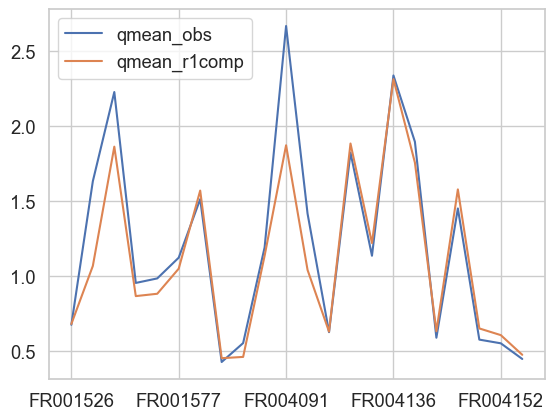

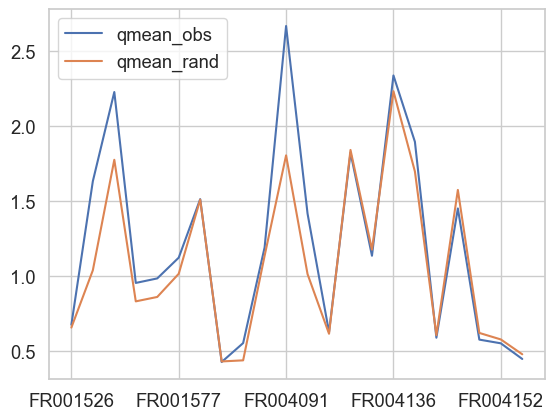

In [35]:
data_diff_calibration_complete_garonne[["qmean_obs", "qmean_r1comp"]].plot()
data_diff_calibration_complete_garonne[["qmean_obs", "qmean_rand"]].plot()

(0.0, 2.0)

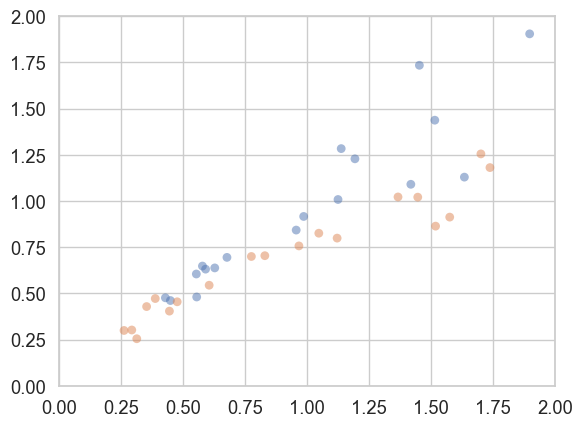

In [72]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_cal_complete_garonne.loc[:, "qmean_obs"],
            data_diff_cal_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)

ax.scatter(
            data_diff_val_complete_garonne.loc[:, "qmean_obs"],
            data_diff_val_complete_garonne.loc[:, "qmean_r1comp"],

            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)

ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

(0.0, 2.0)

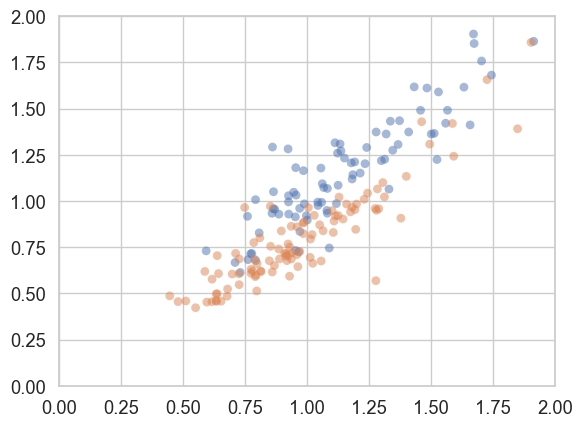

In [73]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_cal_complete.loc[:, "qmean_obs"],
            data_diff_cal_complete.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)

ax.scatter(
            data_diff_val_complete.loc[:, "qmean_obs"],
            data_diff_val_complete.loc[:, "qmean_r1comp"],

            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)

ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

In [694]:
network_estreams_garonne_22_gauges["ele_mt_mean"]

basin_id
FR004136    1097.040
FR001547     475.752
FR004091    1035.152
FR001592     210.916
FR001577     559.939
FR004140     326.545
FR004149     347.817
FR004152     313.515
FR001593     221.214
FR001545     981.246
FR001584     896.438
FR004133     676.001
FR001544     671.291
FR004137     940.039
FR001526     411.430
FR004132    1063.854
FR004114     579.685
FR004119     358.935
FR001551     454.496
FR004162     254.384
FR004143     915.593
FR001604     708.503
Name: ele_mt_mean, dtype: float64

In [696]:
network_estreams_garonne_22_gauges["ele_mt_max"]

basin_id
FR004136    2327.901
FR001547     741.238
FR004091    2105.650
FR001592     294.699
FR001577    1555.522
FR004140     467.940
FR004149     791.756
FR004152     791.756
FR001593     402.482
FR001545    2840.424
FR001584    3191.122
FR004133    1144.136
FR001544    1566.539
FR004137    2327.901
FR001526     544.414
FR004132    2326.972
FR004114    1606.318
FR004119     589.567
FR001551    1606.318
FR004162     635.938
FR004143    3099.778
FR001604    3191.122
Name: ele_mt_max, dtype: float64

In [692]:
data_diff_cal_complete_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand,group
FR001526,0.743227,0.772225,0.725751,0.765710,0.763624,0.536568,0.603156,0.497903,0.601943,0.599961,...,3.572026,3.646068,3.540969,0.695679,0.713561,0.739933,0.710532,0.711636,0.684929,Group_2
FR001544,0.625902,0.647424,0.615299,0.621901,0.579920,0.546071,0.525272,0.491781,0.582831,0.601163,...,3.383719,2.954957,3.032874,1.642309,1.156930,1.194035,1.156421,1.143565,1.101214,Group_2
FR001545,0.650128,0.668497,0.668760,0.656754,0.554554,0.660797,0.751743,0.707366,0.658984,0.631159,...,2.001332,2.207201,2.769905,2.217747,1.705018,1.731143,1.706613,1.704937,1.701869,Group_1
FR001547,0.713686,0.728062,0.762845,0.694016,0.740414,0.448487,0.658318,0.569546,0.617381,0.630976,...,2.674546,2.602689,2.732328,0.938894,0.856120,0.867142,0.857667,0.860792,0.851642,Group_1
FR001551,0.797842,0.800032,0.790659,0.801180,0.766212,0.513833,0.608670,0.625489,0.622365,0.600419,...,2.812374,2.926080,2.781721,0.982021,0.940355,0.937003,0.937755,0.935234,0.901759,Group_2
FR001577,0.757007,0.775660,0.799752,0.824889,0.788971,0.448483,0.530184,0.575277,0.596091,0.626038,...,2.556416,2.533538,2.757690,1.120138,1.006572,1.021656,1.010054,1.010173,1.013099,Group_1
FR001584,0.666386,0.693745,0.748329,0.782880,0.564219,0.721995,0.727968,0.697485,0.654074,0.636433,...,2.228083,2.276479,2.578307,1.544711,1.449634,1.440342,1.460909,1.458644,1.454605,Group_1
FR001592,0.671537,0.685132,0.697847,0.691998,0.675141,0.530365,0.548160,0.600490,0.636623,0.650922,...,2.746716,2.705634,3.648758,0.422938,0.476625,0.478382,0.478668,0.487183,0.473732,Group_1
FR001593,0.772303,0.777416,0.759210,0.752543,0.782441,0.561810,0.548726,0.637976,0.640895,0.648631,...,2.746695,2.686128,2.853609,0.551299,0.482836,0.467449,0.485000,0.493268,0.476885,Group_1
FR001604,0.679328,0.731713,0.719335,0.754914,0.732439,0.687982,0.677066,0.632061,0.658753,0.615339,...,2.384772,2.710341,2.646732,1.208547,1.253372,1.179805,1.255120,1.242083,1.199644,Group_2


In [695]:
data_diff_val_complete_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
FR001526,0.803149,0.820421,0.791319,0.811508,0.802179,0.526412,0.595210,0.487696,0.592060,0.588884,...,4.323120,3.479873,3.484322,3.445412,0.605175,0.544254,0.570536,0.544342,0.551319,0.524205
FR001544,0.490987,0.493564,0.461901,0.468254,0.432867,0.563418,0.520657,0.489325,0.575648,0.597235,...,3.839238,3.500904,3.233748,3.171673,1.575202,0.912823,0.948032,0.912273,0.908803,0.869627
FR001545,0.344226,0.361528,0.385292,0.363618,0.250279,0.675572,0.746266,0.700974,0.656925,0.627206,...,2.301224,2.212711,2.437542,2.810542,2.281073,1.231859,1.252169,1.236388,1.235760,1.230096
FR001547,0.692489,0.704680,0.741002,0.672429,0.716647,0.418343,0.652092,0.563961,0.611291,0.625089,...,2.984654,2.704035,2.694886,2.736166,0.829718,0.690401,0.698771,0.692577,0.699174,0.687759
FR001551,0.771639,0.782282,0.774256,0.773291,0.745992,0.551612,0.610201,0.628416,0.619851,0.598672,...,3.003670,3.192861,3.368270,3.018485,0.775435,0.699755,0.706447,0.699120,0.702099,0.669902
FR001577,0.751815,0.768452,0.794069,0.812347,0.783645,0.448378,0.524953,0.568730,0.590316,0.618510,...,3.094070,2.841831,2.832389,3.035705,0.967140,0.741880,0.750054,0.742396,0.746810,0.744944
FR001584,0.573116,0.590819,0.622042,0.628732,0.494287,0.708660,0.726720,0.698391,0.656325,0.637701,...,2.253171,2.456209,2.553068,2.710728,1.446327,1.002286,1.002762,1.008523,1.009764,1.002535
FR001592,0.552716,0.581002,0.612152,0.616993,0.613686,0.449636,0.542143,0.594566,0.628675,0.642365,...,2.857083,2.624651,2.607401,3.755401,0.262016,0.300490,0.298007,0.300162,0.310310,0.298608
FR001593,0.712746,0.724941,0.748974,0.662921,0.735476,0.580614,0.544175,0.637908,0.634165,0.641628,...,2.254247,2.611284,2.576729,2.740762,0.293164,0.303204,0.293089,0.303175,0.313280,0.298570
FR001604,0.574783,0.633170,0.594184,0.652657,0.575822,0.691276,0.676178,0.636254,0.653556,0.612614,...,2.737135,2.715722,3.174647,2.943200,1.121178,0.799195,0.769584,0.799075,0.795744,0.759487


(0.0, 2.0)

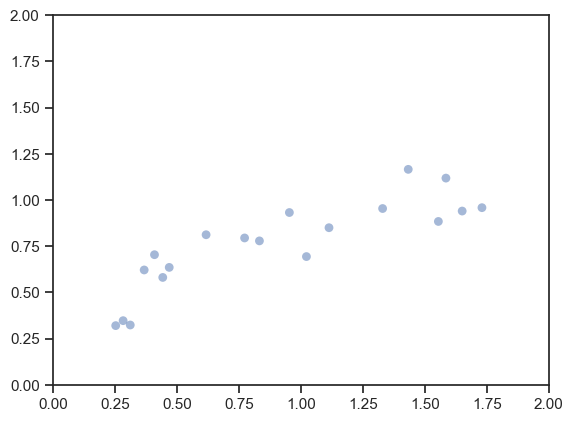

In [179]:
fig, ax = plt.subplots()


ax.scatter(
            data_diff_cal_complete_garonne.loc[:, "qmean_obs"],
            data_diff_cal_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)


ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

(0.0, 2.0)

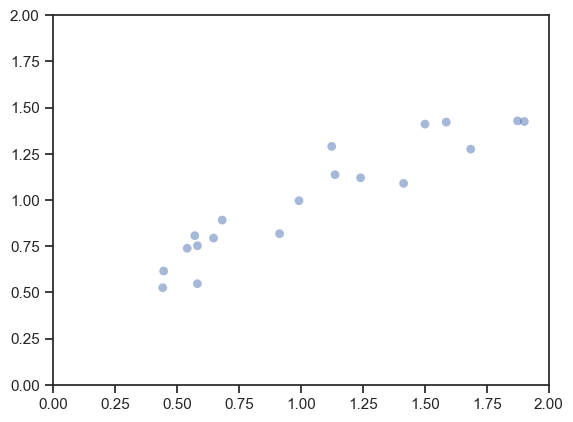

In [ ]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_calibration_complete_garonne.loc[:, "qmean_obs"],
            data_diff_calibration_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)


ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

(0.0, 2.0)

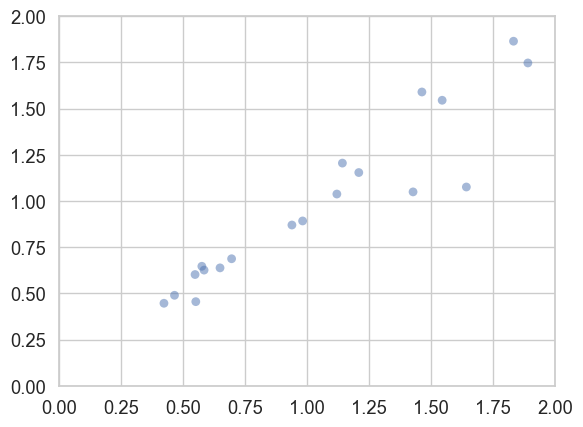

In [91]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_calibration_complete_garonne.loc[:, "qmean_obs"],
            data_diff_calibration_complete_garonne.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)


ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

(0.0, 2.0)

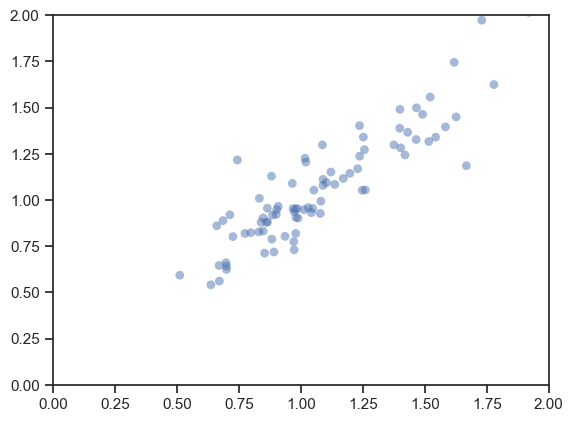

In [182]:
fig, ax = plt.subplots()

ax.scatter(
            data_diff_calibration_complete.loc[:, "qmean_obs"],
            data_diff_calibration_complete.loc[:, "qmean_r1comp"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1)


ax.set_xlim(0, 2)
ax.set_ylim(0, 2)

In [ ]:
#data_diff_calibration_complete_garonne.to_csv("../results/precipitation_correction/garonne_clim.csv")
#data_diff_calibration_complete.to_csv("../results/precipitation_correction/moselle_clim.csv")

In [93]:
data_diff_val_complete_all

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
BEWA0066,0.781428,0.635016,0.860141,0.869633,0.793241,0.542831,0.591896,0.617577,0.761387,0.657451,...,3.010119,1.398398,1.903794,2.033738,1.673626,2.037261,2.023155,1.907711,1.961146,1.984143
BEWA0067,0.700620,0.631536,0.800192,0.826738,0.732626,0.496322,0.612812,0.639791,0.734580,0.679907,...,2.762023,1.570598,1.773512,2.062438,1.856752,2.237019,2.209115,2.178995,2.226759,2.218068
BEWA0106,0.721946,0.467094,0.818313,0.823184,0.715683,0.514587,0.563382,0.593591,0.826010,0.654809,...,3.387917,1.063333,2.001056,2.072671,1.313571,1.578839,1.561289,1.479640,1.547774,1.536753
BEWA0107,0.757973,0.588079,0.805514,0.792151,0.775956,0.592451,0.563433,0.585192,0.804477,0.636640,...,3.207582,1.191070,2.164720,2.238973,1.488243,1.824967,1.819683,1.668742,1.757427,1.755684
BEWA0119,0.779121,0.635529,0.828437,0.840645,0.770814,0.536289,0.562523,0.589495,0.756830,0.647566,...,3.295695,1.391690,2.006038,2.174559,1.439535,1.799502,1.803257,1.718550,1.764377,1.760654
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
FR004140,0.549481,0.636337,0.585681,0.592091,0.575962,0.463281,0.533427,0.575782,0.574585,0.618204,...,2.604187,3.851808,2.585972,2.770872,0.584718,0.748741,0.753718,0.799640,0.816506,0.769202
FR004143,-0.116567,0.034732,0.037124,0.102799,0.047510,0.735733,0.640120,0.622577,0.623619,0.572282,...,2.221753,2.334301,2.399872,2.290208,1.463060,2.101732,2.076598,2.057705,2.005305,2.030821
FR004149,0.574463,0.595109,0.620838,0.639949,0.588102,0.459942,0.554123,0.582776,0.569605,0.621943,...,2.416009,3.646559,2.486469,3.300443,0.575722,0.797986,0.798354,0.855264,0.845545,0.840908
FR004152,0.591891,0.630864,0.638545,0.645685,0.609445,0.468855,0.566465,0.592255,0.584558,0.624123,...,2.570333,3.547505,2.548872,2.923120,0.548381,0.746945,0.749527,0.789757,0.795322,0.770533


#### Get some values from CDF

In [68]:
def get_mean_cdf_dataframe(data_input, phase_name):
    # Accept dict of DataFrames or a single DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")

    data_combined = all_data.groupby(all_data.index).median()

    cdf_dict = {}
    for model_type in ['nse_rand', 'nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        df_model = pd.DataFrame({
            'NSE': nse_values,
            'CDF': cumulative
        })
        cdf_dict[model_type] = df_model

    return pd.concat(cdf_dict, names=["Model"])


In [69]:
cdf_cal = get_mean_cdf_dataframe(data_diff_calibration_complete_all, "Calibration")
cdf_val = get_mean_cdf_dataframe(data_diff_cal_complete_all.iloc[:, 0:5], "Space validation")
cdf_valst = get_mean_cdf_dataframe(data_diff_val_complete_all, "Space-time validation")

In [70]:
# Space validation results
print(cdf_val.loc["nse_rand"][cdf_val.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_val.loc["nse_nogeo"][cdf_val.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_val.loc["nse_g1comp"][cdf_val.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_val.loc["nse_c1comp"][cdf_val.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_val.loc["nse_r1comp"][cdf_val.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
56  0.775133  0.5
         NSE  CDF
56  0.775591  0.5
         NSE  CDF
56  0.786545  0.5
         NSE  CDF
56  0.789382  0.5
         NSE  CDF
56  0.808835  0.5


In [71]:
# Space validation results
print(cdf_valst.loc["nse_rand"][cdf_valst.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_valst.loc["nse_nogeo"][cdf_valst.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_valst.loc["nse_g1comp"][cdf_valst.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_valst.loc["nse_c1comp"][cdf_valst.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_valst.loc["nse_r1comp"][cdf_valst.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
64  0.742849  0.5
         NSE  CDF
64  0.728621  0.5
         NSE  CDF
64  0.746518  0.5
         NSE  CDF
64  0.754384  0.5
         NSE  CDF
64  0.761564  0.5


In [72]:
# Space validation results
print(cdf_cal.loc["nse_rand"][cdf_cal.loc["nse_rand"].CDF > 0.499499].head(1))
print(cdf_cal.loc["nse_nogeo"][cdf_cal.loc["nse_nogeo"].CDF > 0.499].head(1))
print(cdf_cal.loc["nse_g1comp"][cdf_cal.loc["nse_g1comp"].CDF > 0.499].head(1))
print(cdf_cal.loc["nse_c1comp"][cdf_cal.loc["nse_c1comp"].CDF > 0.499499].head(1))
print(cdf_cal.loc["nse_r1comp"][cdf_cal.loc["nse_r1comp"].CDF > 0.499].head(1))

         NSE  CDF
56  0.782346  0.5
         NSE  CDF
56  0.774007  0.5
        NSE  CDF
56  0.79235  0.5
        NSE  CDF
56  0.79956  0.5
         NSE  CDF
56  0.813356  0.5


In [73]:
data_diff_val_complete_dict_plot_garonne

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand
FR001526,0.804701,0.821898,0.797361,0.811536,0.809375
FR001544,0.516026,0.519626,0.482893,0.492634,0.491365
FR001545,0.352444,0.389775,0.417651,0.402717,0.240419
FR001547,0.692996,0.719124,0.745318,0.670803,0.720568
FR001551,0.777125,0.787853,0.779882,0.779473,0.763497
FR001577,0.751031,0.799613,0.793909,0.819709,0.781710
FR001584,0.573092,0.606403,0.630331,0.653832,0.490715
FR001592,0.565788,0.637424,0.608338,0.643691,0.631256
FR001593,0.720779,0.748793,0.755912,0.660147,0.742506
FR001604,0.580741,0.640624,0.595482,0.660263,0.583538


### Scatter plots signatures

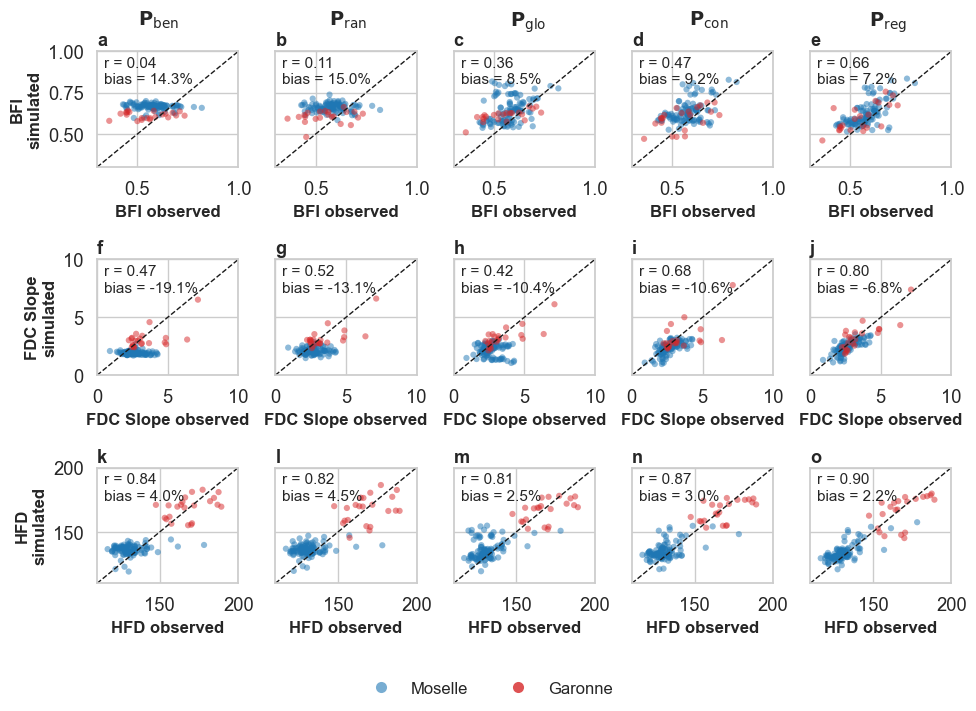

In [144]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{P_{\mathrm{ben}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_val_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_val_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[moselle_mask, var_obs],
            data_diff_val_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_val_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[garonne_mask, var_obs],
            data_diff_val_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_val_complete_all[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_val_complete_all[var_pred].median()
               - data_diff_val_complete_all[var_obs].median())
            / data_diff_val_complete_all[var_obs].median()
        )
        #x = data_diff_val_complete_all[var_obs].values
        #y = data_diff_val_complete_all[var_pred].values

        #R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        #bias_rel = 100 * (np.nanmedian(y) - np.nanmedian(x)) / np.nanmedian(x)
        x = data_diff_val_complete_all[var_obs]
        y = data_diff_val_complete_all[var_pred]

        bias_rel = 100 * np.nanmedian((y - x) / x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 5 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 10)
            ax.set_ylim(0, 10)
            ax.plot([0, 10], [0, 10], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

# Save
plt.savefig("../results/figs/figures/fig06.png", dpi=300)
plt.show()

In [57]:
data_diff_val_complete_all.to_csv("../results/precipitation_correction/moselle_garonne_sx_val_complete.csv")

In [ ]:
estreams_attributes_clipped_filters.columns[]

Index(['Unnamed: 0', 'gauge_id', 'gauge_name', 'gauge_country',
       'gauge_provider', 'river', 'lon_snap', 'lat_snap', 'lon', 'lat',
       ...
       'irri_1990', 'irri_2005', 'stations_num_p_mean', 'perm_high_regi',
       'perm_medium_regi', 'perm_low_regi', 'perm_high_glob2',
       'perm_medium_glob2', 'perm_low_glob2', 'group'],
      dtype='object', length=127)

In [54]:
import pandas as pd
import numpy as np

# Containers
rows = []

for metric in metrics:
    var_obs = f"{metric}_obs"

    for suffix in suffixes:
        var_pred = f"{metric}_{suffix}"

        # Extract vectors
        x = data_diff_val_complete_all[var_obs].values
        y = data_diff_val_complete_all[var_pred].values

        # Spearman correlation
        r_spearman = (
            data_diff_val_complete_all[[var_obs, var_pred]]
            .corr(method="pearson")
            .iloc[0, 1]
        )

        # Relative bias (%)
        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        rows.append({
            "metric": metric,
            "experiment": suffix,
            "r_spearman": r_spearman,
            "bias_%": bias_rel
        })

# Create dataframe
df_stats = pd.DataFrame(rows)

# Pivot for nice table layout (optional)
table_r = df_stats.pivot(index="metric", columns="experiment", values="r_spearman")
table_bias = df_stats.pivot(index="metric", columns="experiment", values="bias_%")


In [57]:
data_diff_val_complete_all[data_diff_val_complete_all["slope_obs"] > 5][["slope_obs", "slope_nogeo", "slope_c1comp", "slope_r1comp", "slope_g1comp"]]

,slope_obs,slope_nogeo,slope_c1comp,slope_r1comp,slope_g1comp
FR004119,7.140418,6.524469,7.787843,7.395105,6.131029
FR004140,6.378143,3.083424,3.039359,4.329033,3.558575


In [59]:
cols = ["slope_c1comp", "slope_r1comp", "slope_g1comp"]

data_diff_val_complete_all[
    (data_diff_val_complete_all[cols] > 7).any(axis=1)
][["slope_obs"] + cols]


,slope_obs,slope_c1comp,slope_r1comp,slope_g1comp
FR004119,7.140418,7.787843,7.395105,6.131029


In [55]:
table_bias

experiment,c1comp,g1comp,nogeo,r1comp,rand
metric,,,,,
bfi,9.601076,11.619524,14.453321,7.870945,13.598076
hfd,2.181125,2.842867,3.172496,1.414321,3.055265
slope,-10.540558,-15.962255,-23.138434,-6.933191,-17.603518


In [56]:
table_r

experiment,c1comp,g1comp,nogeo,r1comp,rand
metric,,,,,
bfi,0.472288,0.357259,0.042927,0.664434,0.112528
hfd,0.870292,0.811789,0.836874,0.897069,0.818810
slope,0.680083,0.420593,0.474263,0.802927,0.519238


In [46]:
is_moselle = network_estreams_moselle_108_gauges.index.tolist()
is_garonne = network_estreams_garonne_22_gauges.index.tolist()

In [50]:
import pandas as pd
import numpy as np

rows = []

basins = {
    "Garonne": is_garonne,
    "Moselle": is_moselle,
}

for basin_name, basin_idx in basins.items():

    # Subset once per basin
    df_basin = data_diff_val_complete_all.loc[basin_idx]

    for metric in metrics:
        var_obs = f"{metric}_obs"

        for suffix in suffixes:
            var_pred = f"{metric}_{suffix}"

            # Extract vectors
            x = df_basin[var_obs].values
            y = df_basin[var_pred].values

            # Spearman correlation
            r_spearman = (
                df_basin[[var_obs, var_pred]]
                .corr(method="pearson")
                .iloc[0, 1]
            )

            # Relative bias (%)
            bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

            rows.append({
                "basin": basin_name,
                "metric": metric,
                "experiment": suffix,
                "r_spearman": r_spearman,
                "bias_%": bias_rel
            })

# Single tidy dataframe
df_stats = pd.DataFrame(rows)
df_stats

,basin,metric,experiment,r_spearman,bias_%
0,Garonne,bfi,nogeo,0.104925,10.979045
1,Garonne,bfi,rand,0.241984,9.517252
2,Garonne,bfi,g1comp,0.700134,10.781133
3,Garonne,bfi,c1comp,0.538078,7.496332
4,Garonne,bfi,r1comp,0.702441,8.481970
5,Garonne,slope,nogeo,0.584529,-9.350589
6,Garonne,slope,rand,0.699704,-7.256697
7,Garonne,slope,g1comp,0.758904,-5.724237
8,Garonne,slope,c1comp,0.612648,-6.686573
9,Garonne,slope,r1comp,0.815047,-3.703394


In [51]:
table_r = df_stats.pivot_table(
    index=["basin", "metric"],
    columns="experiment",
    values="r_spearman"
)
table_r

experiment        c1comp    g1comp     nogeo    r1comp      rand
basin   metric                                                  
Garonne bfi     0.538078  0.700134  0.104925  0.702441  0.241984
        hfd     0.575983  0.499966  0.433250  0.548683  0.368925
        slope   0.612648  0.758904  0.584529  0.815047  0.699704
Moselle bfi     0.441636  0.325663 -0.132237  0.650648 -0.044630
        hfd     0.508309  0.340013  0.205763  0.699368  0.244239
        slope   0.633508 -0.065202 -0.155475  0.728768  0.004521

In [54]:
table_r[["nogeo", "rand", "g1comp", "c1comp", "r1comp"]]

experiment         nogeo      rand    g1comp    c1comp    r1comp
basin   metric                                                  
Garonne bfi     0.104925  0.241984  0.700134  0.538078  0.702441
        hfd     0.433250  0.368925  0.499966  0.575983  0.548683
        slope   0.584529  0.699704  0.758904  0.612648  0.815047
Moselle bfi    -0.132237 -0.044630  0.325663  0.441636  0.650648
        hfd     0.205763  0.244239  0.340013  0.508309  0.699368
        slope  -0.155475  0.004521 -0.065202  0.633508  0.728768

In [55]:
table_bias = df_stats.pivot_table(
    index=["basin", "metric"],
    columns="experiment",
    values="bias_%"
)
table_bias[["nogeo", "rand", "g1comp", "c1comp", "r1comp"]]

experiment          nogeo       rand     g1comp     c1comp    r1comp
basin   metric                                                      
Garonne bfi     10.979045   9.517252  10.781133   7.496332  8.481970
        hfd      0.292954  -0.659427  -1.129804  -1.249836 -1.280594
        slope   -9.350589  -7.256697  -5.724237  -6.686573 -3.703394
Moselle bfi     15.128807  14.391490  11.782528  10.010291  7.752147
        hfd      3.926948   4.028530   3.883724   3.080052  2.120401
        slope  -27.045098 -20.535199 -18.863107 -11.632550 -7.848326

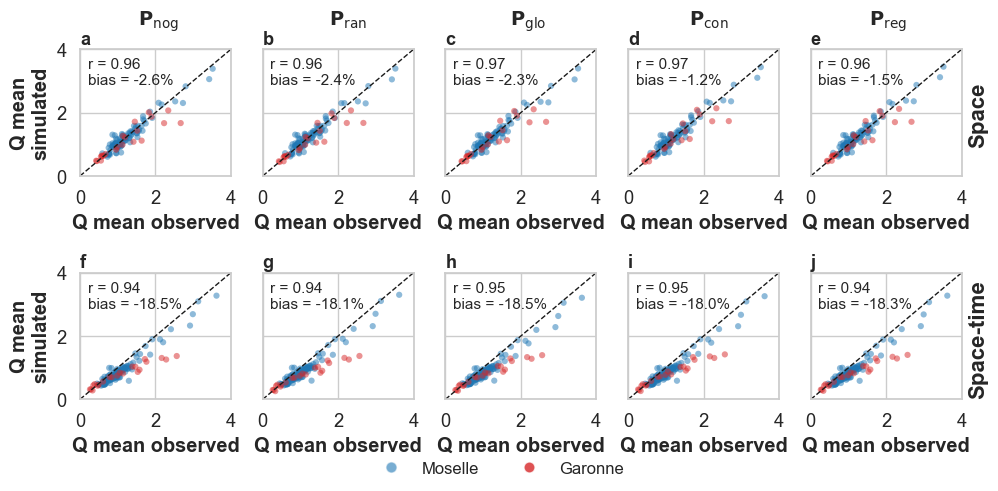

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.lines import Line2D

sns.set(style="whitegrid", font_scale=1.2)

# =========================
# CONFIG
# =========================
metrics = ["qmean"]
metric_titles = ["Q mean"]

suffixes = ["nogeo", "rand", "g1comp", "c1comp", "r1comp"]
scale_titles = [
    r"$\mathbf{P_{\mathrm{nog}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$",
]

basin_colors = {
    "moselle": "#1f77b4",
    "garonne": "#d62728",
}

letters = list(string.ascii_lowercase)

# =========================
# FIGURE SETUP
# =========================
fig, axs = plt.subplots(
    2, 5,
    figsize=(10, 5),
    sharex=False,
    sharey=False
)

# =========================
# LOOP OVER ROWS
# =========================
for row_idx, (df, row_title) in enumerate([
    (data_diff_cal_complete_all, "Space evaluation"),
    (data_diff_val_complete_all, "Space–time evaluation"),
]):

    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row_idx, col]

        var_obs  = "qmean_obs"
        var_pred = f"qmean_{suffix}"

        # Moselle
        moselle_mask = df.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            df.loc[moselle_mask, var_obs],
            df.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            alpha=0.5,
            edgecolor="none",
            zorder=1,
        )

        # Garonne
        garonne_mask = df.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            df.loc[garonne_mask, var_obs],
            df.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            alpha=0.5,
            edgecolor="none",
            zorder=2,
        )

        # Labels
        if col == 0:
            ax.set_ylabel("Q mean\nsimulated", fontweight="bold")
        else:
            ax.set_yticklabels([])

        ax.set_xlabel("Q mean observed", fontweight="bold")

        # Stats
        p = df[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias = 100 * (np.nanmean(df[var_pred]) - np.nanmean(df[var_obs])) / np.nanmean(df[var_obs])

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias:.1f}%",
            transform=ax.transAxes,
            fontsize=11,
        )

        # 1:1 line
        ax.set_xlim(0, 4)
        ax.set_ylim(0, 4)
        ax.plot([0, 4], [0, 4], "k--", lw=1)

        # Subplot letter
        ax.text(
            0.00, 1.15,
            letters[row_idx * 5 + col],
            transform=ax.transAxes,
            fontweight="bold",
            fontsize=13,
            va="top",
            ha="left",
        )

# =========================
# COLUMN TITLES
# =========================
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.96, title, ha="center", va="top",
             fontsize=14, fontweight="bold")

# =========================
# ROW TITLES
# =========================
# =========================
# ROW TITLES (VERTICAL, RIGHT SIDE)
# =========================
fig.text(
    1, 0.75, "Space",
    rotation=90,
    va="center",
    ha="right",
    fontsize=16,
    fontweight="bold"
)

fig.text(
    1, 0.3, "Space-time",
    rotation=90,
    va="center",
    ha="right",
    fontsize=16,
    fontweight="bold"
)

# =========================
# LEGEND
# =========================
legend_elements = [
    Line2D([0], [0], marker="o", color="w", label="Moselle",
           markerfacecolor=basin_colors["moselle"], markersize=8, alpha=0.6),
    Line2D([0], [0], marker="o", color="w", label="Garonne",
           markerfacecolor=basin_colors["garonne"], markersize=8, alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12,
)

# =========================
# FINALIZE
# =========================
plt.tight_layout()
plt.subplots_adjust(top=0.88, bottom=0.18)

plt.savefig(
    "../results/figs/figures/SI_qmean_space_vs_spacetime_PB.png",
    dpi=300,
    bbox_inches="tight",
)

plt.show()


In [89]:
estreams_attributes_clipped.loc["DEBU1959", ["perm_low_regi","perm_medium_regi", 
                                                     "perm_high_regi", 
                                                     "perm_low_cont2", "perm_medium_cont2",
                                                     "perm_high_cont2",
                                                     
                                                     "perm_low_glob2", 
                                                     "perm_medium_glob2", "perm_high_glob2"]]

perm_low_regi             19.0
perm_medium_regi          56.0
perm_high_regi            25.0
perm_low_cont2       22.741459
perm_medium_cont2       54.772
perm_high_cont2         22.487
perm_low_glob2             4.0
perm_medium_glob2         65.0
perm_high_glob2           31.0
Name: DEBU1959, dtype: object

In [93]:
network_estreams_garonne_22_gauges

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,perm_medium_cont2,perm_low_cont2,lakes_depth_mean,lakes_depth_mean_norm,q_mean_yr,p_mean_yr,norm_ups_cap,NSE,NSElstm,group
basin_id,,,,,,,,,,,,,,,,,,,,,
FR004136,0,O149431003,Le Touyre Ã Lavelanet et Ã Saint-Quentin-la-...,FR,FR_EAUFRANCE,Le Touyre à Lavelanet et à Saint-Quentin-la-Tour,1.850824,42.940862,1.850824,42.940862,...,52.863,47.137,NaN,0.000000,846.800,888.775,0.000000,0.700021,0.815218,Group_1
FR001547,1,O062401001,O0624010,FR,FR_EAUFRANCE,Le Volp à Montberaud et à Sainte-Croix-Volvestre,1.141456,43.144783,1.141456,43.144783,...,100.000,0.000,NaN,0.000000,337.990,819.790,0.000000,0.823456,0.876788,Group_1
FR004091,2,O023402001,Le Ger Ã Aspet [2],FR,FR_EAUFRANCE,Le Ger à Aspet [2],0.795350,43.021419,0.795350,43.021419,...,49.849,50.151,NaN,0.000000,919.800,1040.250,0.000000,0.723698,0.848994,Group_1
FR001592,3,O221501001,O2215010,FR,FR_EAUFRANCE,La Saune à Quint-Fonsegrives,1.548308,43.574698,1.548308,43.574698,...,97.803,0.000,3.648649,12.385889,117.165,657.730,0.018831,0.809932,0.811849,Group_1
FR001577,4,O158461001,O1584610,FR,FR_EAUFRANCE,Le Douctouyre à Dun et à Vira [Engraviès],1.772643,43.043560,1.772643,43.043560,...,94.518,5.483,NaN,0.000000,380.330,832.930,0.000000,0.852887,0.849163,Group_1
FR004140,5,O163401001,La VixiÃ¨ge Ã Belpech,FR,FR_EAUFRANCE,La Vixiège à Belpech,1.749951,43.201718,1.749951,43.201718,...,92.188,0.000,NaN,0.000000,195.640,718.685,0.000000,0.822625,0.817920,Group_1
FR004149,6,O184402001,La LÃ¨ze Ã LÃ©zat-sur-LÃ¨ze,FR,FR_EAUFRANCE,La Lèze à Lézat-sur-Lèze,1.352878,43.280809,1.352878,43.280809,...,92.809,0.664,7.571429,12.564601,178.485,775.260,0.016207,0.853714,0.893136,Group_1
FR004152,7,O187401001,La LÃ¨ze Ã Labarthe-sur-LÃ¨ze,FR,FR_EAUFRANCE,La Lèze à Labarthe-sur-Lèze,1.406594,43.451190,1.406594,43.451190,...,81.174,0.456,7.571429,8.638464,161.330,740.220,0.011670,0.866051,0.889248,Group_1
FR001593,8,O222251001,O2222510,FR,FR_EAUFRANCE,L'Hers à Toulouse [Pont de Périole],1.480100,43.627770,1.480100,43.627770,...,81.003,0.000,4.817610,9.651561,138.335,665.030,0.014513,0.820100,0.826636,Group_1


In [ ]:
estreams_attributes_garonne.loc["FR001604", ["perm_low_regi","perm_medium_regi", 
                                                     "perm_high_regi", 
                                                     "perm_low_cont2", "perm_medium_cont2",
                                                     "perm_high_cont2",
                                                     "perm_low_glob2", 
                                                     "perm_medium_glob2", "perm_high_glob2"]]

perm_low_regi        39.0
perm_medium_regi     47.0
perm_high_regi       14.0
perm_low_cont2       26.0
perm_medium_cont2    57.0
perm_high_cont2      17.0
perm_low_glob2        3.0
perm_medium_glob2    68.0
perm_high_glob2      29.0
Name: FR001604, dtype: object

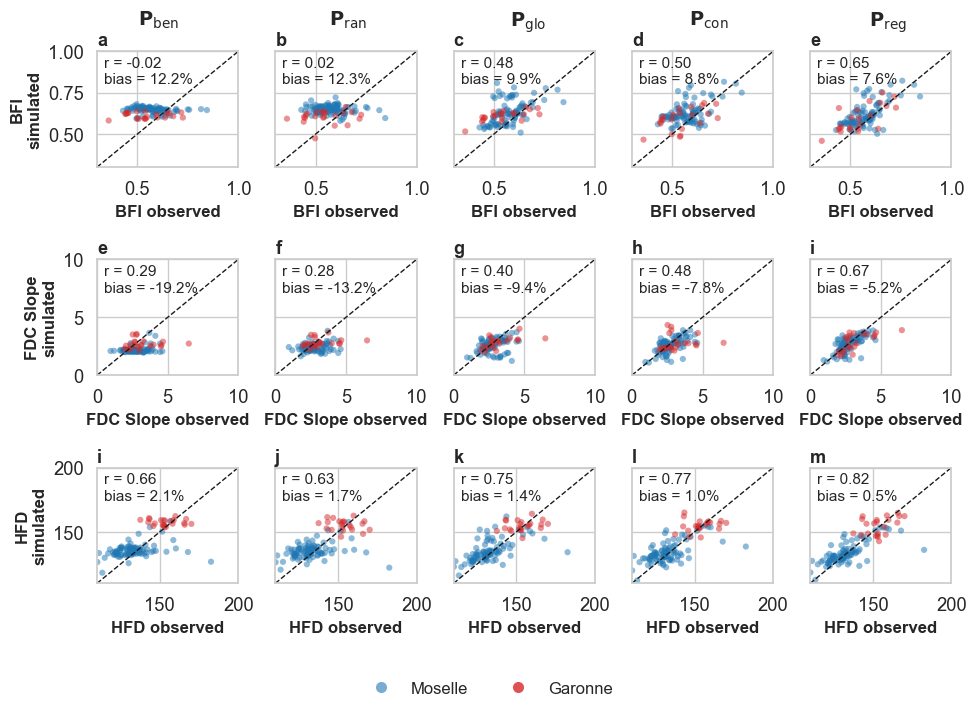

In [33]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{P_{\mathrm{ben}}}$",
    r"$\mathbf{P_{\mathrm{ran}}}$",
    r"$\mathbf{P_{\mathrm{glo}}}$",
    r"$\mathbf{P_{\mathrm{con}}}$",
    r"$\mathbf{P_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_cal_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[moselle_mask, var_obs],
            data_diff_cal_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[garonne_mask, var_obs],
            data_diff_cal_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_cal_complete_all[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_cal_complete_all[var_pred].mean()
               - data_diff_cal_complete_all[var_obs].mean())
            / data_diff_cal_complete_all[var_obs].mean()
        )
        x = data_diff_cal_complete_all[var_obs].values
        y = data_diff_cal_complete_all[var_pred].values

        R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 10)
            ax.set_ylim(0, 10)
            ax.plot([0, 10], [0, 10], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

# Save
plt.savefig("../results/figs/figures/SX_signatures_bucket_space.png", dpi=300)
plt.show()

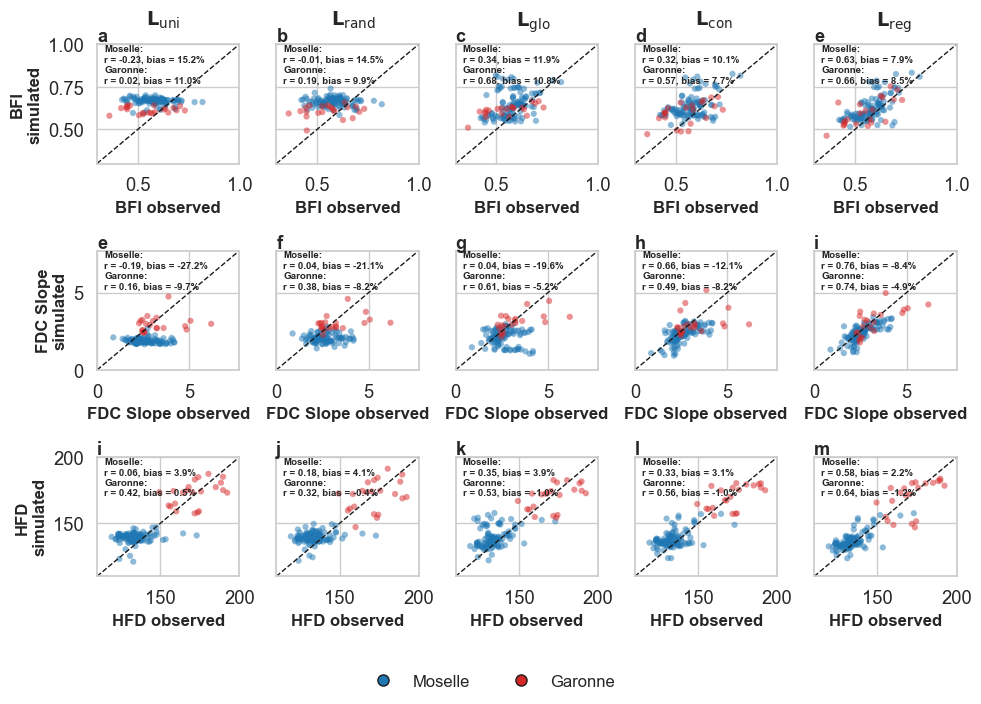

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.lines import Line2D

# =========================================================
# SEABORN STYLE
# =========================================================
sns.set(style="whitegrid", font_scale=1.2)

# =========================================================
# METRICS AND TITLES
# =========================================================
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{L_{\mathrm{ben}}}$",
    r"$\mathbf{L_{\mathrm{ran}}}$",
    r"$\mathbf{L_{\mathrm{glo}}}$",
    r"$\mathbf{L_{\mathrm{con}}}$",
    r"$\mathbf{L_{\mathrm{reg}}}$"
]

# =========================================================
# BASIN COLORS
# =========================================================
basin_colors = {
    "moselle": "#1f77b4",
    "garonne": "#d62728",
}

moselle_ids = network_estreams_moselle_108_gauges.index.tolist()
garonne_ids = network_estreams_garonne_22_gauges.index.tolist()

def get_basin_color(gauge_id):
    if gauge_id in moselle_ids:
        return basin_colors["moselle"]
    elif gauge_id in garonne_ids:
        return basin_colors["garonne"]
    else:
        return "grey"

point_colors = data_diff_val_complete_all.index.map(get_basin_color)

# Boolean masks (USED FOR STATS)
is_moselle = data_diff_val_complete_all.index.isin(moselle_ids)
is_garonne = data_diff_val_complete_all.index.isin(garonne_ids)

# CREATE FIGURE
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# LOOP OVER METRICS AND MODELS
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, suffix in enumerate(suffixes):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_val_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[moselle_mask, var_obs],
            data_diff_val_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_val_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[garonne_mask, var_obs],
            data_diff_val_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )

        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # -------------------------------
        # PER-BASIN STATS
        # -------------------------------
        # Moselle
        x_m = data_diff_val_complete_all.loc[is_moselle, var_obs].values
        y_m = data_diff_val_complete_all.loc[is_moselle, var_pred].values
        mask_m = ~np.isnan(x_m) & ~np.isnan(y_m)
        x_m, y_m = x_m[mask_m], y_m[mask_m]

        from scipy.stats import spearmanr
        from scipy.stats import pearsonr

        r_m = spearmanr(x_m, y_m)[0] if len(x_m) > 1 else np.nan
        bias_m = 100 * (np.mean(y_m) - np.mean(x_m)) / np.mean(x_m)


        # Garonne
        x_g = data_diff_val_complete_all.loc[is_garonne, var_obs].values
        y_g = data_diff_val_complete_all.loc[is_garonne, var_pred].values
        mask_g = ~np.isnan(x_g) & ~np.isnan(y_g)
        x_g, y_g = x_g[mask_g], y_g[mask_g]

        r_g = spearmanr(x_g, y_g)[0] if len(x_g) > 1 else np.nan
        bias_g = 100 * (np.mean(y_g) - np.mean(x_g)) / np.mean(x_g)



        # Annotation
        ax.text(
            0.05, 0.68,
            f"Moselle:\n"
            f"r = {r_m:.2f}, bias = {bias_m:.1f}%\n"

            #f"r = {r_m:.2f}, CCC = {CCC_m:.2f}, bias = {bias_m:.1f}%\n"
            f"Garonne:\n"

            f"r = {r_g:.2f}, bias = {bias_g:.1f}%",

            #f"r = {r_g:.2f}, CCC = {CCC_g:.2f}, bias = {bias_g:.1f}%",
            transform=ax.transAxes,
            fontsize=7,
            fontweight="bold",

            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.14, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 7.7)
            ax.set_ylim(0, 7.7)
            ax.plot([0, 7.7], [0, 7.7], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# =========================================================
# LEGEND
# =========================================================
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='k'),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='k'),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.99, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# =========================================================
# FINAL LAYOUT
# =========================================================
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

plt.savefig("../results/figs/figures/SX_signaturesByBasin_bucket.png", dpi=300)
plt.show()


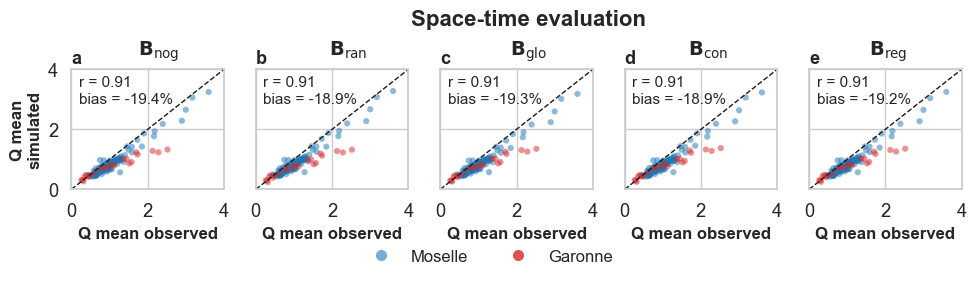

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ["qmean"]
metric_titles = ['Q mean']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{B_{\mathrm{nog}}}$",
    r"$\mathbf{B_{\mathrm{ran}}}$",
    r"$\mathbf{B_{\mathrm{glo}}}$",
    r"$\mathbf{B_{\mathrm{con}}}$",
    r"$\mathbf{B_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_val_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(1, 5, figsize=(10, 2), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)
axs = axs.flatten()
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_val_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[moselle_mask, var_obs],
            data_diff_val_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_val_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_val_complete_all.loc[garonne_mask, var_obs],
            data_diff_val_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_val_complete_all[[var_obs, var_pred]].corr(method="spearman").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_val_complete_all[var_pred].mean()
               - data_diff_val_complete_all[var_obs].mean())
            / data_diff_val_complete_all[var_obs].mean()
        )
        x = data_diff_val_complete_all[var_obs].values
        y = data_diff_val_complete_all[var_pred].values

        R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'qmean':
            ax.set_xlim(0, 4)
            ax.set_ylim(0, 4)
            ax.plot([0, 4], [0, 4], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 8)
            ax.set_ylim(0, 8)
            ax.plot([0, 8], [0, 8], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    bbox_to_anchor=(0.5, -0.2),
    ncol=2,
    frameon=False,
    fontsize=12
)


# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
fig.text(0.54, 1.15, "Space-time evaluation", ha='center', va='top',
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.subplots_adjust(top=0.85, bottom=0.25)

# Save
plt.savefig("../results/figs/figures/SI_qmean_spacetime.png", dpi=300, bbox_inches='tight')
plt.show()

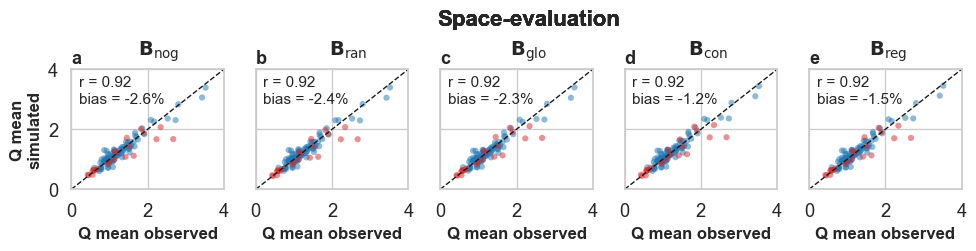

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ["qmean"]
metric_titles = ['Q mean']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{B_{\mathrm{nog}}}$",
    r"$\mathbf{B_{\mathrm{ran}}}$",
    r"$\mathbf{B_{\mathrm{glo}}}$",
    r"$\mathbf{B_{\mathrm{con}}}$",
    r"$\mathbf{B_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_cal_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(1, 5, figsize=(10, 2), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)
axs = axs.flatten()
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[moselle_mask, var_obs],
            data_diff_cal_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[garonne_mask, var_obs],
            data_diff_cal_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_cal_complete_all[[var_obs, var_pred]].corr(method="spearman").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_cal_complete_all[var_pred].mean()
               - data_diff_cal_complete_all[var_obs].mean())
            / data_diff_cal_complete_all[var_obs].mean()
        )
        x = data_diff_cal_complete_all[var_obs].values
        y = data_diff_cal_complete_all[var_pred].values

        R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'qmean':
            ax.set_xlim(0, 4)
            ax.set_ylim(0, 4)
            ax.plot([0, 4], [0, 4], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 8)
            ax.set_ylim(0, 8)
            ax.plot([0, 8], [0, 8], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

#fig.legend(
#    handles=legend_elements,
#    loc="lower center",
#    bbox_to_anchor=(0.5, -0.2),
#    ncol=2,
#    frameon=False,
#    fontsize=12
#)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout

    fig.text(0.54, 1.15, "Space-evaluation", ha='center', va='top',
             fontsize=16, fontweight='bold')

plt.tight_layout()
plt.subplots_adjust(top=0.85, bottom=0.25)

# Save
plt.savefig("../results/figs/figures/SI_qmean_space.png", dpi=300, bbox_inches='tight')
plt.show()

In [85]:
data_diff_val_complete_all[["bfi_obs", "bfi_c1comp"]].corr(method="spearman")

,bfi_obs,bfi_c1comp
bfi_obs,1.000000,0.387581
bfi_c1comp,0.387581,1.000000


In [87]:
data_diff_val_complete_all[["bfi_obs", "bfi_c1comp"]]

,bfi_obs,bfi_c1comp
BEWA0066,0.519551,0.591967
BEWA0067,0.451670,0.581914
BEWA0106,0.497543,0.594830
BEWA0107,0.585267,0.590446
BEWA0119,0.512113,0.587923
...,...,...
FR004140,0.443952,0.594675
FR004143,0.732221,0.615939
FR004149,0.447956,0.600093
FR004152,0.463007,0.625625


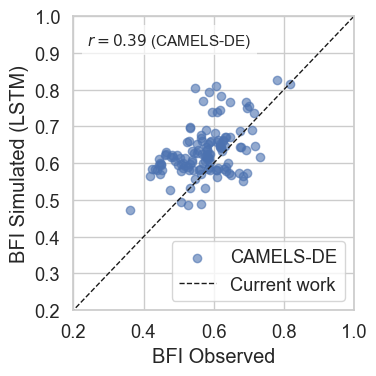

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

df = data_diff_val_complete_all


# ------------------------------------------------------------
# Extract data and drop NaNs (CRITICAL)
# ------------------------------------------------------------

x1 = df["bfi_obs"]
y1 = df["bfi_c1comp"]
mask1 = (~x1.isna()) & (~y1.isna())
x1, y1 = x1[mask1], y1[mask1]

#x2 = df2["bfi_obs"]
#y2 = df2["bfi_r1comp"]
#mask2 = (~x2.isna()) & (~y2.isna())
#x2, y2 = x2[mask2], y2[mask2]

# Pearson correlations
r1, p1 = spearmanr(x1, y1)
#r2, p2 = pearsonr(x2, y2)

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

plt.figure(figsize=(4, 4))

plt.scatter(x1, y1, alpha=0.6)
#plt.scatter(x2, y2, alpha=0.6)

# 1:1 line
lims = [0, 1]
plt.plot(lims, lims, "k--", linewidth=1)

plt.xlabel("BFI Observed")
plt.ylabel("BFI Simulated (LSTM)")
plt.xlim(0.2, 1)
plt.ylim(0.2, 1)
plt.grid(True)

# ------------------------------------------------------------
# Add Pearson r annotations
# ------------------------------------------------------------

plt.text(
    0.05, 0.95,
    rf"$r = {r1:.2f}$ (CAMELS-DE)",
    transform=plt.gca().transAxes,
    ha="left", va="top",
    fontsize=11,
    bbox=dict(facecolor="white", edgecolor="none", alpha=0.7)
)


plt.legend(["CAMELS-DE", "Current work"])
plt.tight_layout()
#plt.savefig("../results/figs/figures/SX_comparisonCAMELS.png", dpi=300)
# plt.show()


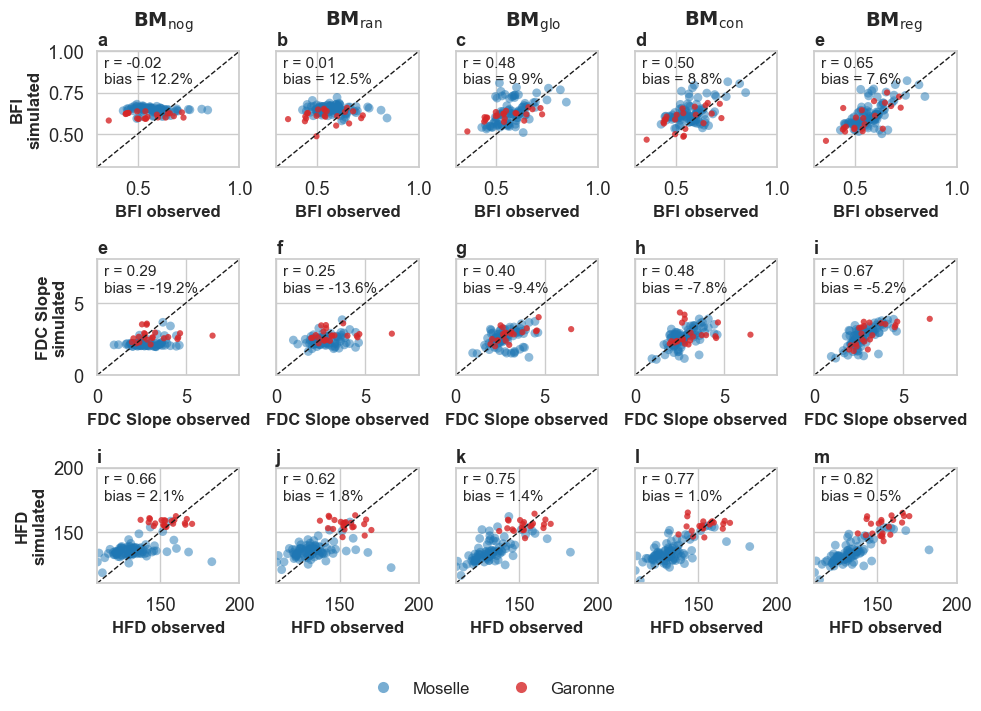

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{BM_{\mathrm{nog}}}$",
    r"$\mathbf{BM_{\mathrm{ran}}}$",
    r"$\mathbf{BM_{\mathrm{glo}}}$",
    r"$\mathbf{BM_{\mathrm{con}}}$",
    r"$\mathbf{BM_{\mathrm{reg}}}$"
]

# DEFINE BASIN COLORS
basin_colors = {
    "moselle": "#1f77b4",   # blue
    "garonne": "#d62728",  # red
}

def get_basin_color(gauge_id):
    if gauge_id in network_estreams_moselle_108_gauges.index.tolist():
        return basin_colors["moselle"]
    elif gauge_id in network_estreams_garonne_22_gauges.index.tolist():
        return basin_colors["garonne"]
    else:
        return "grey"  # fallback (should not happen)

# Precompute colors in dataframe order
point_colors = data_diff_cal_complete_all.index.map(get_basin_color)

# CREATE SUBPLOTS
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Moselle
        moselle_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_moselle_108_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[moselle_mask, var_obs],
            data_diff_cal_complete_all.loc[moselle_mask, var_pred],
            c=basin_colors["moselle"],
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5,
            zorder=1
        )

        # Garonne
        garonne_mask = data_diff_cal_complete_all.index.isin(
            network_estreams_garonne_22_gauges.index
        )

        ax.scatter(
            data_diff_cal_complete_all.loc[garonne_mask, var_obs],
            data_diff_cal_complete_all.loc[garonne_mask, var_pred],
            c=basin_colors["garonne"],
            s=20,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.8,
            zorder=2
        )


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation & bias
        p = data_diff_cal_complete_all[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        bias_rel = (
            100
            * (data_diff_cal_complete_all[var_pred].mean()
               - data_diff_cal_complete_all[var_obs].mean())
            / data_diff_cal_complete_all[var_obs].mean()
        )
        x = data_diff_cal_complete_all[var_obs].values
        y = data_diff_cal_complete_all[var_pred].values

        R = np.corrcoef(x, y)[0, 1]
        #CCC = compute_ccc(x, y)

        bias_rel = 100 * (np.nanmean(y) - np.nanmean(x)) / np.nanmean(x)

        ax.text(
            0.05, 0.72,
            f"r = {p:.2f}\nbias = {bias_rel:.1f}%",
            #f"rs = {p:.2f}\nCCC = {CCC:.2f}\nbias = {bias_rel:.1f}%",

            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )


        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.17, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 8)
            ax.set_ylim(0, 8)
            ax.plot([0, 8], [0, 8], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# LEGEND (INSTEAD OF COLORBAR)
from matplotlib.lines import Line2D

legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='none', alpha=0.6),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='none', alpha=0.8),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 1, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# Layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

# Save
#plt.savefig("../results/figs/signatures_by_basin.png", dpi=300)
plt.show()

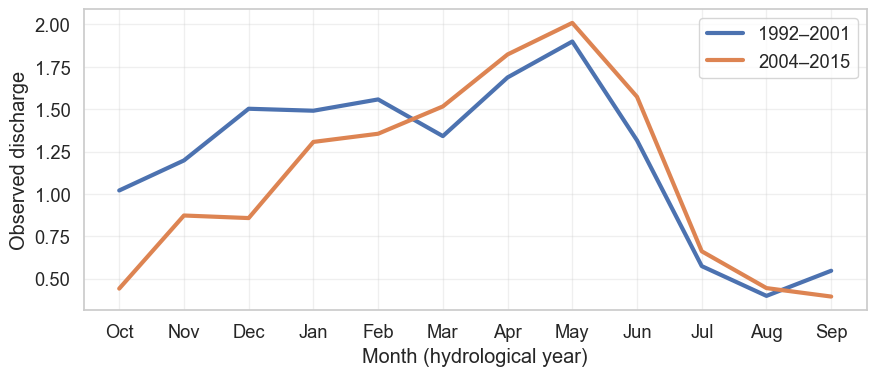

In [456]:
import pandas as pd
import xarray as xr
from pathlib import Path

# --- Load & combine groups ---
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

combined = xr.concat(datasets, dim="group")

## --- Collapse everything except time ---
#obs = (
#    combined["observation"]
#    .median(dim=[d for d in combined["observation"].dims if d != "date"])
#)

gauge_id = "FR001604"
# --- Collapse everything except time ---
obs = (
    combined["observation"]
    .sel(gauge_id=gauge_id)
    .median(dim="group")
)


# obs dims now MUST be ('date',)

# --- Add year & month ---
obs = obs.assign_coords(
    year=obs["date"].dt.year,
    month=obs["date"].dt.month,
)

# --- Monthly means per year ---
monthly = obs.groupby(["year", "month"]).mean()

# --- Period climatologies ---
# --- Period climatologies (MONTH ONLY) ---
clim_1992_2001 = (
    obs
    .sel(date=slice("1992-10-01", "2001-09-30"))
    .groupby("date.month")
    .mean()
    .to_series()
)

clim_2004_2015 = (
    obs
    .sel(date=slice("2004-10-01", "2015-09-30"))
    .groupby("date.month")
    .mean()
    .to_series()
)

# --- Single DataFrame ---
df_climatology = pd.DataFrame({
    "1992–2001": clim_1992_2001,
    "2004–2015": clim_2004_2015,
})

df_climatology.index.name = "month"


# --- Single DataFrame ---
df_climatology = pd.DataFrame({
    "1992–2001": clim_1992_2001,
    "2004–2015": clim_2004_2015,
})

df_climatology.index.name = "month"

new_order = list(range(10, 13)) + list(range(1, 10))
df_reordered = df_climatology.loc[new_order]


import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(9, 4))

x = range(1, 13)  # artificial, ordered axis

ax.plot(x, df_reordered["1992–2001"], linewidth=3, label="1992–2001")
ax.plot(x, df_reordered["2004–2015"], linewidth=3, label="2004–2015")

ax.set_xticks(x)
ax.set_xticklabels(["Oct", "Nov", "Dec", "Jan", "Feb", "Mar",
                     "Apr", "May", "Jun", "Jul", "Aug", "Sep"])

ax.set_xlabel("Month (hydrological year)")
ax.set_ylabel("Observed discharge")
ax.grid(alpha=0.3)
ax.legend()

plt.tight_layout()
plt.show()


In [395]:
data_diff_cal_complete_garonne["hfd_obs"]

FR001526    144.625
FR001544    139.625
FR001545    158.875
FR001547    137.375
FR001551    134.125
FR001577    136.250
FR001584    163.750
FR001592    138.250
FR001593    145.500
FR001604    158.250
FR004091    143.875
FR004114    135.375
FR004119    142.375
FR004132    147.375
FR004133    131.250
FR004136    151.750
FR004137    150.250
FR004140    145.625
FR004143    159.875
FR004149    141.500
FR004152    141.000
FR004162    148.250
Name: hfd_obs, dtype: float64

In [396]:
data_diff_val_complete_garonne["hfd_obs"]

FR001526    167.000000
FR001544    169.400000
FR001545    191.500000
FR001547    161.100000
FR001551    165.000000
FR001577    158.800000
FR001584    193.500000
FR001592    164.300000
FR001593    178.500000
FR001604    190.100000
FR004091    177.500000
FR004114    161.900000
FR004119    175.333333
FR004132    182.100000
FR004133    152.200000
FR004136    187.200000
FR004137    179.000000
FR004140    160.100000
FR004143    190.400000
FR004149    174.500000
FR004152    170.700000
FR004162    172.428571
Name: hfd_obs, dtype: float64

In [460]:
estreams_attributes_garonne_clipped_filters.p_mean*365

basin_id
FR004136     888.775
FR001547     819.790
FR004091    1040.250
FR001592     657.730
FR001577     832.930
FR004140     718.685
FR004149     775.260
FR004152     740.220
FR001593     665.030
FR001545     981.485
FR001584     923.450
FR004133     817.965
FR001544     948.635
FR004137     887.315
FR001526     863.225
FR004132     883.665
FR004114     859.210
FR004119     823.075
FR001551     830.740
FR004162     739.490
FR004143     894.615
FR001604     857.385
Name: p_mean, dtype: float64

In [468]:
(estreams_attributes_garonne_clipped_filters.p_mean*365).describe()

count      22.000000
mean      838.587500
std        96.035057
min       657.730000
25%       785.936250
50%       845.157500
75%       888.410000
max      1040.250000
Name: p_mean, dtype: float64

In [462]:
(estreams_attributes_garonne_clipped_filters.pet_mean*365).describe()

count     22.000000
mean     887.397955
std       55.412715
min      794.240000
25%      832.108750
50%      881.475000
75%      940.240000
max      963.235000
Name: pet_mean, dtype: float64

In [473]:
estreams_attributes_garonne_clipped_filters.lakes_num

basin_id
FR004136     0.0
FR001547     0.0
FR004091     0.0
FR001592     3.0
FR001577     0.0
FR004140     0.0
FR004149     1.0
FR004152     1.0
FR001593     6.0
FR001545     2.0
FR001584    46.0
FR004133     0.0
FR001544     0.0
FR004137     0.0
FR001526     0.0
FR004132     0.0
FR004114     1.0
FR004119     1.0
FR001551     2.0
FR004162     4.0
FR004143    12.0
FR001604    89.0
Name: lakes_num, dtype: float64

In [471]:
estreams_attributes_garonne_clipped_filters.iloc[:,100:120]

,soil_fra_grav_mean,soil_bd_mean,soil_oc_mean,lai_mean,ndvi_mean,lulc_2006_urban,lulc_2006_NonIrriAgri,lulc_2006_Agric,lulc_2006_forest,lulc_2006_grass,lulc_2006_agriculture,dam_num,res_num,lakes_num,lakes_tot_area,lakes_tot_vol,sno_cov_mean,irri_1990,irri_2005,stations_num_p_mean
basin_id,,,,,,,,,,,,,,,,,,,,
FR004136,10.886,1.465,1.199,0.198,0.635,0.060,0.000,0.160,0.612,0.169,0.160,0.0,0.0,0.0,0.00,0.00,8.588,0.000,0.000,1.0
FR001547,9.626,1.381,1.381,0.260,0.742,0.000,0.027,0.410,0.559,0.005,0.437,0.0,0.0,0.0,0.00,0.00,0.539,1.189,0.517,2.0
FR004091,13.430,1.432,1.449,0.220,0.679,0.004,0.000,0.088,0.780,0.128,0.088,0.0,0.0,0.0,0.00,0.00,5.654,0.000,0.000,0.0
FR001592,8.271,1.292,1.110,0.080,0.464,0.031,0.836,0.110,0.023,0.000,0.946,0.0,0.0,3.0,0.37,1.35,0.327,10.823,14.816,1.0
FR001577,9.156,1.472,1.001,0.209,0.685,0.000,0.031,0.275,0.550,0.143,0.306,0.0,0.0,0.0,0.00,0.00,0.873,2.870,2.040,1.0
FR004140,9.005,1.328,1.015,0.098,0.520,0.002,0.276,0.565,0.110,0.046,0.841,0.0,0.0,0.0,0.00,0.00,0.466,36.387,34.400,4.0
FR004149,11.806,1.325,1.354,0.156,0.619,0.004,0.270,0.493,0.211,0.017,0.763,1.0,1.0,1.0,0.42,3.18,0.439,20.228,16.084,2.0
FR004152,11.338,1.325,1.278,0.134,0.580,0.014,0.424,0.396,0.153,0.012,0.820,1.0,1.0,1.0,0.42,3.18,0.407,29.664,24.070,3.0
FR001593,8.095,1.315,1.013,0.078,0.459,0.094,0.693,0.174,0.029,0.003,0.867,1.0,1.0,6.0,1.59,7.66,0.360,75.993,88.781,5.0


In [353]:
data_diff_val_complete_garonne["hfd_obs"]

FR001526    167.000000
FR001544    169.400000
FR001545    191.500000
FR001547    161.100000
FR001551    165.000000
FR001577    158.800000
FR001584    193.500000
FR001592    164.300000
FR001593    178.500000
FR001604    190.100000
FR004091    177.500000
FR004114    161.900000
FR004119    175.333333
FR004132    182.100000
FR004133    152.200000
FR004136    187.200000
FR004137    179.000000
FR004140    160.100000
FR004143    190.400000
FR004149    174.500000
FR004152    170.700000
FR004162    172.428571
Name: hfd_obs, dtype: float64

In [347]:
data_diff_cal_complete_garonne.loc["FR004119"]

nse_nogeo         0.741502
nse_g1comp        0.729981
nse_c1comp        0.753000
nse_r1comp        0.777770
nse_rand          0.739659
bfi_obs           0.494522
bfi_r1comp        0.556441
bfi_c1comp        0.519804
bfi_g1comp        0.651290
bfi_nogeo         0.609235
bfi_rand          0.617781
hfd_obs         142.375000
hfd_r1comp      145.375000
hfd_c1comp      143.375000
hfd_g1comp      151.625000
hfd_nogeo       149.000000
hfd_rand        149.125000
slope_obs         2.957096
slope_r1comp      3.740516
slope_c1comp      4.440179
slope_g1comp      3.014877
slope_nogeo       3.541711
slope_rand        3.583675
qmean_obs         0.649025
qmean_r1comp      0.634799
qmean_c1comp      0.639537
qmean_g1comp      0.627656
qmean_nogeo       0.642714
qmean_rand        0.625215
Name: FR004119, dtype: float64

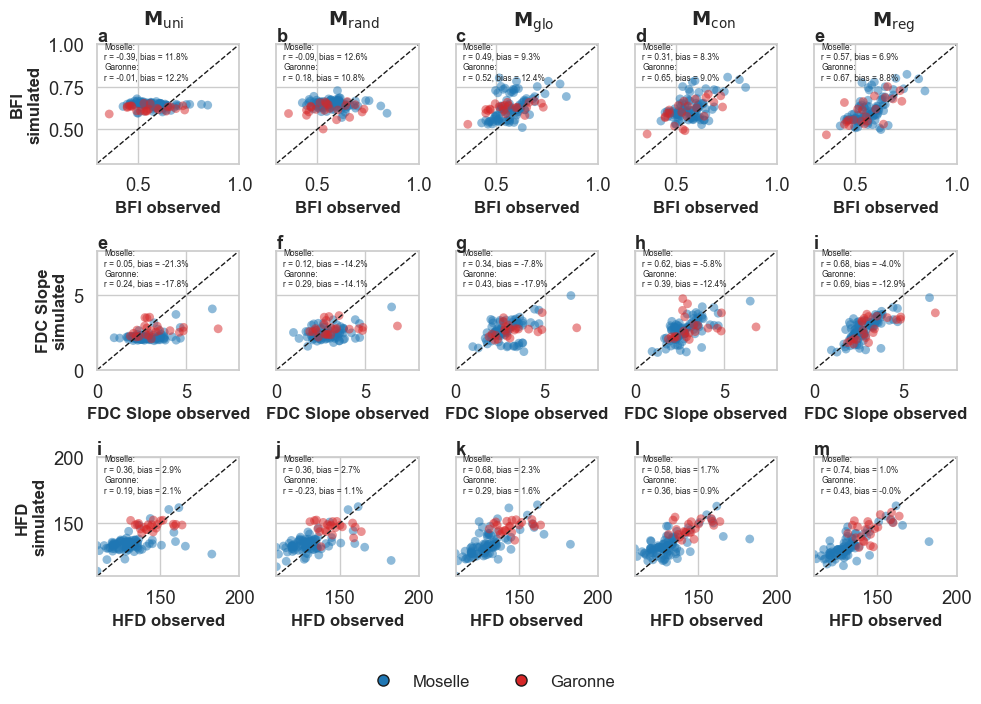

In [457]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.lines import Line2D

# =========================================================
# SEABORN STYLE
# =========================================================
sns.set(style="whitegrid", font_scale=1.2)

# =========================================================
# METRICS AND TITLES
# =========================================================
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

suffixes = ['nogeo', 'rand', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [
    r"$\mathbf{M_{\mathrm{uni}}}$",
    r"$\mathbf{M_{\mathrm{rand}}}$",
    r"$\mathbf{M_{\mathrm{glo}}}$",
    r"$\mathbf{M_{\mathrm{con}}}$",
    r"$\mathbf{M_{\mathrm{reg}}}$"
]

# =========================================================
# BASIN COLORS
# =========================================================
basin_colors = {
    "moselle": "#1f77b4",
    "garonne": "#d62728",
}

moselle_ids = network_estreams_moselle_108_gauges.index.tolist()
garonne_ids = network_estreams_garonne_22_gauges.index.tolist()

def get_basin_color(gauge_id):
    if gauge_id in moselle_ids:
        return basin_colors["moselle"]
    elif gauge_id in garonne_ids:
        return basin_colors["garonne"]
    else:
        return "grey"

point_colors = data_diff_cal_complete_all.index.map(get_basin_color)

# Boolean masks (USED FOR STATS)
is_moselle = data_diff_cal_complete_all.index.isin(moselle_ids)
is_garonne = data_diff_cal_complete_all.index.isin(garonne_ids)

# CREATE FIGURE
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# LOOP OVER METRICS AND MODELS
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, suffix in enumerate(suffixes):
        ax = axs[row, col]

        var_obs  = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"

        # Scatter
        ax.scatter(
            data_diff_cal_complete_all[var_obs],
            data_diff_cal_complete_all[var_pred],
            c=point_colors,
            s=40,
            edgecolor='none',
            linewidth=0.1,
            alpha=0.5
        )

        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels([])

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # -------------------------------
        # PER-BASIN STATS
        # -------------------------------
        # Moselle
        x_m = data_diff_cal_complete_all.loc[is_moselle, var_obs].values
        y_m = data_diff_cal_complete_all.loc[is_moselle, var_pred].values
        mask_m = ~np.isnan(x_m) & ~np.isnan(y_m)
        x_m, y_m = x_m[mask_m], y_m[mask_m]

        from scipy.stats import spearmanr
        from scipy.stats import pearsonr

        r_m = spearmanr(x_m, y_m)[0] if len(x_m) > 1 else np.nan
        bias_m = 100 * (np.mean(y_m) - np.mean(x_m)) / np.mean(x_m)

        # Garonne
        x_g = data_diff_cal_complete_all.loc[is_garonne, var_obs].values
        y_g = data_diff_cal_complete_all.loc[is_garonne, var_pred].values
        mask_g = ~np.isnan(x_g) & ~np.isnan(y_g)
        x_g, y_g = x_g[mask_g], y_g[mask_g]

        r_g = spearmanr(x_g, y_g)[0] if len(x_g) > 1 else np.nan
        bias_g = 100 * (np.mean(y_g) - np.mean(x_g)) / np.mean(x_g)

        # Annotation
        ax.text(
            0.05, 0.70,
            f"Moselle:\n"
            f"r = {r_m:.2f}, bias = {bias_m:.1f}%\n"
            f"Garonne:\n"
            f"r = {r_g:.2f}, bias = {bias_g:.1f}%",
            transform=ax.transAxes,
            fontsize=6,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot letter
        subplot_idx = row * 4 + col
        ax.text(
            0.00, 1.14, letters[subplot_idx],
            transform=ax.transAxes,
            fontsize=13,
            fontweight='bold',
            va='top',
            ha='left'
        )

        # Axis limits
        if metric == 'bfi':
            ax.set_xlim(0.3, 1)
            ax.set_ylim(0.3, 1)
            ax.plot([0.3, 1], [0.3, 1], 'k--', lw=1)
        elif metric == 'slope':
            ax.set_xlim(0, 8)
            ax.set_ylim(0, 8)
            ax.plot([0, 8], [0, 8], 'k--', lw=1)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)
            ax.plot([110, 200], [110, 200], 'k--', lw=1)

# =========================================================
# LEGEND
# =========================================================
legend_elements = [
    Line2D([0], [0], marker='o', color='w', label='Moselle',
           markerfacecolor=basin_colors["moselle"], markersize=8, markeredgecolor='k'),
    Line2D([0], [0], marker='o', color='w', label='Garonne',
           markerfacecolor=basin_colors["garonne"], markersize=8, markeredgecolor='k'),
]

fig.legend(
    handles=legend_elements,
    loc="lower center",
    ncol=2,
    frameon=False,
    fontsize=12
)

# Column titles
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.99, title, ha='center', va='top',
             fontsize=14, fontweight='bold')

# =========================================================
# FINAL LAYOUT
# =========================================================
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.18)

# plt.savefig("../results/figs/signatures_by_basin.png", dpi=300)
plt.show()


In [405]:
data_diff_val_complete_garonne.slope_obs

FR001526    2.652935
FR001544    2.356680
FR001545    2.479728
FR001547    3.233426
FR001551    3.138959
FR001577    4.691970
FR001584    2.412078
FR001592    4.642741
FR001593    2.343526
FR001604    2.339394
FR004091    2.465701
FR004114    2.998522
FR004119         NaN
FR004132    2.801786
FR004133    4.919075
FR004136    2.501371
FR004137    2.619935
FR004140    5.977023
FR004143    2.236113
FR004149    3.130998
FR004152    3.481765
FR004162    4.124940
Name: slope_obs, dtype: float64

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_78778/2308636000.py:141: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


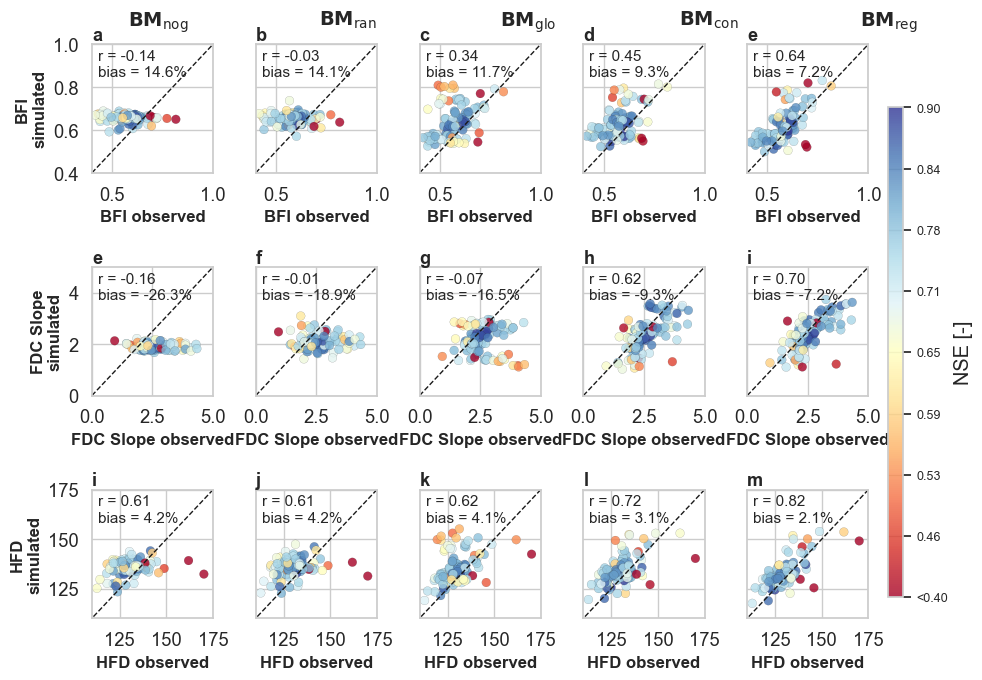

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', "rand", 'g1comp', 'c1comp', 'r1comp']
scale_titles = [r"$\mathbf{BM_{\mathrm{nog}}}$", r"$\mathbf{BM_{\mathrm{ran}}}$", r"$\mathbf{BM_{\mathrm{glo}}}$", r"$\mathbf{BM_{\mathrm{con}}}$", 
                r"$\mathbf{BM_{\mathrm{reg}}}$"]

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.4, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(3, 5, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels("")

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        # Relative bias (percent)
        bias_rel = 100 * (data_diff_val_complete[var_pred].mean() - data_diff_val_complete[var_obs].mean()) / data_diff_val_complete[var_obs].mean()

        # Annotate both r and relative bias
        ax.text(
            0.05, 0.75, f"r = {R:.2f}\nbias = {bias_rel:.1f}%", 
            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 4 + col
        ax.text(
            -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left'
        )

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.4, 1)
            ax.set_ylim(0.4, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 5)
            ax.set_ylim(0, 5)
        elif metric == 'hfd':
            ax.set_xlim(110, 175)
            ax.set_ylim(110, 175)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 4].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 1].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 2].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 3].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 4].plot([0, 5], [0, 5], 'k--', lw=1)

axs[2, 0].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 1].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 2].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 3].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 4].plot([100, 180], [100, 180], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.4, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

# Column titles (below x-axis)
col_positions = [0.17, 0.36, 0.54, 0.72, 0.9]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.99, title, ha='center', va='top', fontsize=14, fontweight='bold')

# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.88)

# Optional save
#plt.savefig("../results/figs/signatures_colorbar.png", dpi=300)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_81638/569170381.py:138: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


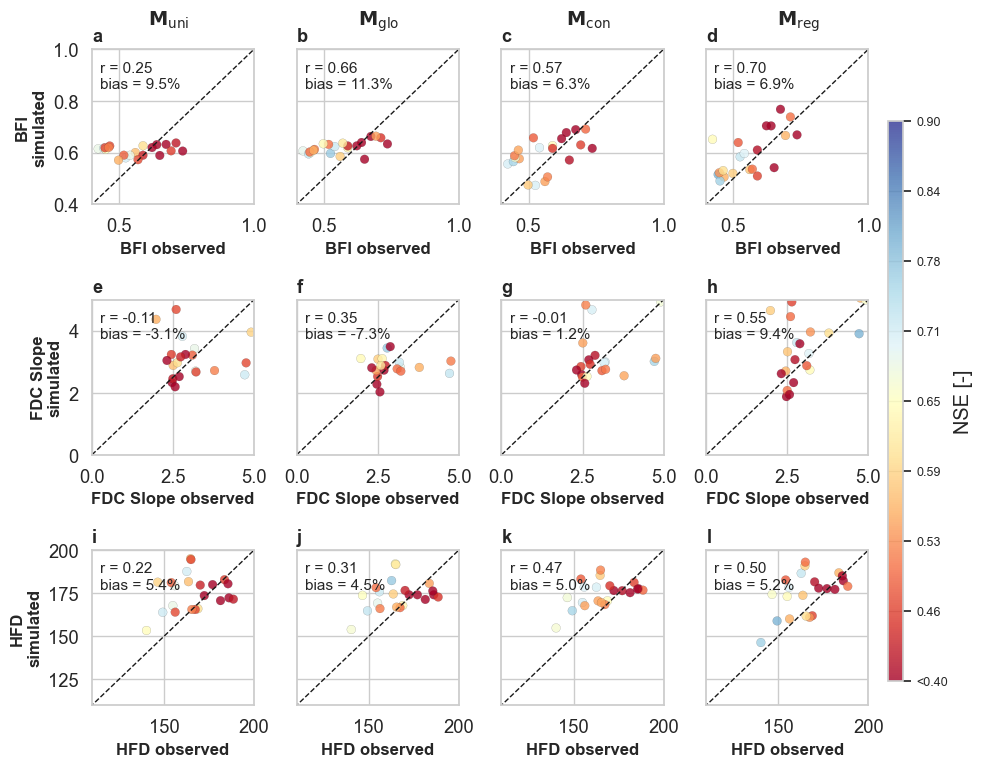

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.4, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(3, 4, figsize=(10, 8), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete_garonne[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete_garonne[var_obs],
            data_diff_val_complete_garonne[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels("")

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation
        R = data_diff_val_complete_garonne[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        # Relative bias (percent)
        bias_rel = 100 * (data_diff_val_complete_garonne[var_pred].mean() - data_diff_val_complete_garonne[var_obs].mean()) / data_diff_val_complete_garonne[var_obs].mean()

        # Annotate both r and relative bias
        ax.text(
            0.05, 0.75, f"r = {R:.2f}\nbias = {bias_rel:.1f}%", 
            transform=ax.transAxes,
            fontsize=11,
            bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 4 + col
        ax.text(
            -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
            fontsize=13, fontweight='bold', va='top', ha='left'
        )

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.4, 1)
            ax.set_ylim(0.4, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 5)
            ax.set_ylim(0, 5)
        elif metric == 'hfd':
            ax.set_xlim(110, 200)
            ax.set_ylim(110, 200)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 1].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 2].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 3].plot([0, 5], [0, 5], 'k--', lw=1)

axs[2, 0].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 1].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 2].plot([100, 200], [100, 200], 'k--', lw=1)
axs[2, 3].plot([100, 200], [100, 200], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.4, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

# Column titles (below x-axis)
col_positions = [0.18, 0.39, 0.6, 0.81]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.99, title, ha='center', va='top', fontsize=14, fontweight='bold')

# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.88)

# Optional save
#plt.savefig("../results/figs/signatures_colorbar.png", dpi=300)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_46669/1883391081.py:138: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


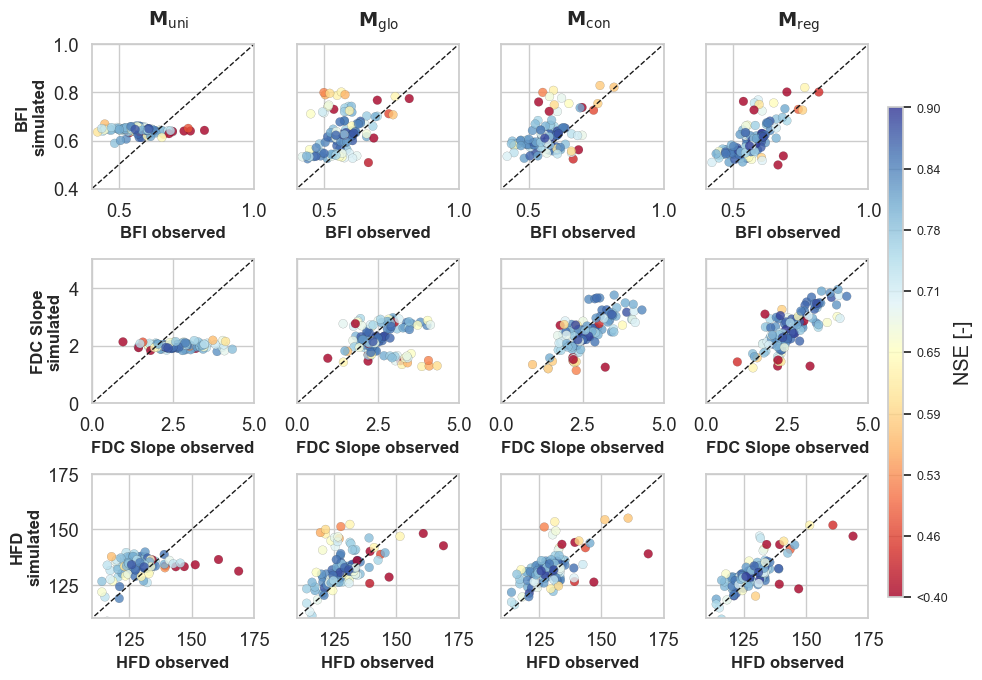

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope', 'hfd']
metric_titles = ['BFI', 'FDC Slope', 'HFD']

# Define suffixes and scales
suffixes = ['nogeo', 'g1comp', 'c1comp', 'r1comp']
scale_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.4, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(3, 4, figsize=(10, 7), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12, fontweight='bold')
        else:
            ax.set_ylabel("")
            ax.set_yticklabels("")

        ax.set_xlabel(f"{row_title} observed", fontsize=12, fontweight='bold')

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        # Relative bias (percent)
        bias_rel = 100 * (data_diff_val_complete[var_pred].mean() - data_diff_val_complete[var_obs].mean()) / data_diff_val_complete[var_obs].mean()

        # Annotate both r and relative bias
        #ax.text(
        #    0.05, 0.75, f"r = {R:.2f}\nbias = {bias_rel:.1f}%", 
        #    transform=ax.transAxes,
        #    fontsize=11,
        #    bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        #)

        # Subplot label
        subplot_idx = row * 4 + col
        #ax.text(
        #    -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
        #    fontsize=13, fontweight='bold', va='top', ha='left'
        #)

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.4, 1)
            ax.set_ylim(0.4, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 5)
            ax.set_ylim(0, 5)
        elif metric == 'hfd':
            ax.set_xlim(110, 175)
            ax.set_ylim(110, 175)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 1].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 2].plot([0, 5], [0, 5], 'k--', lw=1)
axs[1, 3].plot([0, 5], [0, 5], 'k--', lw=1)

axs[2, 0].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 1].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 2].plot([100, 180], [100, 180], 'k--', lw=1)
axs[2, 3].plot([100, 180], [100, 180], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.4, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

# Column titles (below x-axis)
col_positions = [0.18, 0.39, 0.6, 0.81]
for x, title in zip(col_positions, scale_titles):
    fig.text(x, 0.99, title, ha='center', va='top', fontsize=14, fontweight='bold')

# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.88)

# Optional save
plt.savefig("../results/figs/signatures_colorbar_novalues.png", dpi=300)

plt.show()

<Axes: >

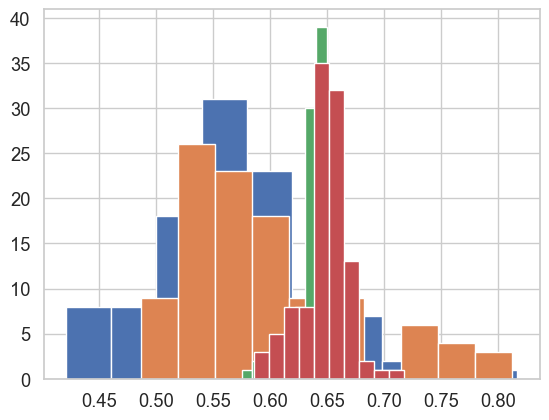

In [65]:
data_diff_val_complete.bfi_obs.hist()
data_diff_val_complete.bfi_r1comp.hist()
data_diff_val_complete.bfi_nogeo.hist()
data_diff_val_complete.bfi_rand.hist()

In [ ]:
# Check the location of such gauges
data_diff_val_complete[data_diff_val_complete.slope_g1comp < 2.5][data_diff_val_complete.slope_obs > 3]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/1791010137.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  data_diff_val_complete[data_diff_val_complete.slope_g1comp < 2.5][data_diff_val_complete.slope_obs > 3]


,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,hfd_obs,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo
LU000001,0.818454,0.649280,0.881554,0.884523,0.549832,0.543200,0.574273,0.782482,0.638770,121.500000,...,3.860265,3.581864,3.109574,1.340480,1.877873,1.192096,1.268308,1.264427,1.230602,1.236307
FR000185,0.360620,0.304650,0.253292,0.261731,0.537419,0.771846,0.765778,0.733329,0.644075,139.428571,...,3.200160,1.338674,1.316292,1.588988,1.954331,0.799352,1.127797,1.124773,1.129408,1.130152
DERP2004,0.780371,0.697834,0.847188,0.854621,0.500677,0.561742,0.587207,0.713699,0.649224,125.480000,...,3.098546,3.368437,3.074827,1.651324,1.960362,1.212305,1.298889,1.295819,1.267811,1.268332
FR000124,0.772476,0.753625,0.811396,0.807491,0.484187,0.522532,0.525490,0.621379,0.596098,114.000000,...,3.097078,2.873278,2.531944,2.297750,1.840529,3.916104,3.298457,3.251881,3.253214,3.233390
BEWA0067,0.729356,0.660304,0.793928,0.817378,0.451975,0.551294,0.578556,0.695457,0.639020,123.733333,...,3.529336,3.314105,2.987025,1.636624,1.937895,1.521927,1.491366,1.484467,1.449717,1.455211
LU000008,0.687396,0.559989,0.719317,0.716055,0.506018,0.543964,0.575109,0.783551,0.640208,119.500000,...,4.085803,3.629050,3.139504,1.359124,1.887828,1.140708,1.217588,1.214195,1.182175,1.186649
LU000005,0.802608,0.704688,0.852507,0.865122,0.516618,0.561979,0.586650,0.733425,0.648080,125.166667,...,3.044633,3.320812,3.043438,1.575259,1.951596,1.216879,1.344578,1.340812,1.310614,1.312852
BEWA0106,0.712345,0.527460,0.794958,0.805361,0.500697,0.553869,0.587887,0.793989,0.653594,127.695652,...,4.063630,3.758909,3.275390,1.486719,2.017512,1.157128,1.080879,1.078079,1.055378,1.052847
DERP2031,0.815352,0.761942,0.844691,0.845447,0.589874,0.568903,0.565357,0.720148,0.632464,133.640000,...,3.030520,3.077905,3.399647,1.629237,2.033145,1.110597,1.162769,1.170101,1.141663,1.142480
LU000011,0.813974,0.651633,0.865808,0.864817,0.565311,0.565904,0.591474,0.794881,0.656690,131.333333,...,3.247142,3.604373,3.242003,1.428776,1.958154,0.986891,1.057148,1.054891,1.029757,1.029376


### Threee geological maps

In [51]:
from matplotlib.lines import Line2D

def add_scalebar(ax, length_km=50, location=(0.05, 0.05), linewidth=2):
    """
    Adds a scale bar to a GeoAxes.
    
    Parameters
    ----------
    ax : matplotlib axis
    length_km : int
        Length of the scale bar in kilometers
    location : tuple
        (x, y) position in axis fraction coordinates
    linewidth : int
        Thickness of the scale bar
    """

    # Convert km to degrees (approximation valid for mid-latitudes)
    # 1 degree longitude ≈ 111 km * cos(latitude)
    mean_lat = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2
    km_per_degree = 111 * np.cos(np.deg2rad(mean_lat))
    length_deg = length_km / km_per_degree

    # Get axis limits
    x_min, x_max = ax.get_xlim()
    y_min, y_max = ax.get_ylim()

    # Scale bar start point
    x_start = x_min + location[0] * (x_max - x_min)
    y_start = y_min + location[1] * (y_max - y_min) - 0.025

    # Draw scale bar
    ax.add_line(Line2D(
        [x_start, x_start + length_deg],
        [y_start, y_start],
        linewidth=linewidth,
        color='black'
    ))

    # Add label
    ax.text(
        x_start + length_deg / 2,
        y_start + 0.01 * (y_max - y_min) + 0.01,
        f"{length_km} km",
        ha='center',
        va='bottom',
        fontsize=8
    )


/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3514903786.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3514903786.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3514903786.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3514903786.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


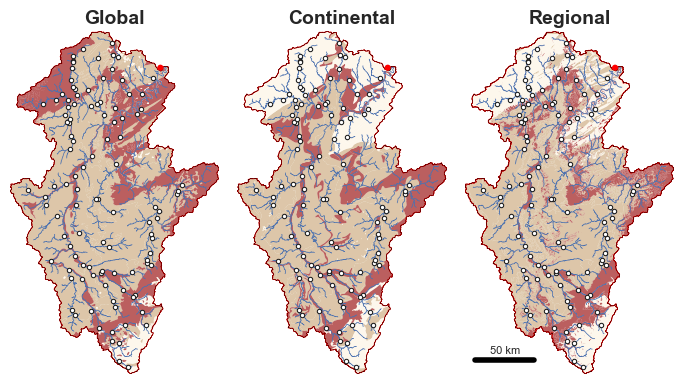

In [64]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 4))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)


# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=14, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
#legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
#                   bbox_to_anchor=(0.5, -0.01), ncol=5)
## Make the legend title bold
#legend.get_title().set_fontweight('bold')
for ax in [ax3]:
    add_scalebar(ax, length_km=50, linewidth=4)

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig("../results/figs/figures/fig01a.png", dpi=300, bbox_inches='tight')

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/1130675053.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/1130675053.py:95: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/1130675053.py:180: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


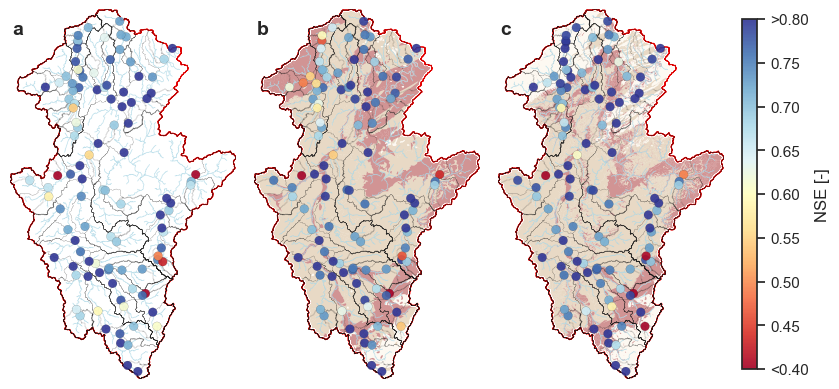

In [65]:
catchment_boundaries_moselle = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

selected_ids = ["FR000144", "FR000185", "FR003250","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 3, figsize=(7.5, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_r1comp']
titles = ['a', 'b', 'c']
main_titles = [r"$\mathbf{B_{\mathrm{ben}}}$", r"$\mathbf{B_{\mathrm{glo}}}$", 
                r"$\mathbf{B_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = moselle.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
#plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Color setup
vmin, vmax = 0.4, 0.8
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    moselle.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    #ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.8, num=9)
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.80"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

## Add the legend outside the plot area with minimal space
#legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
#                   bbox_to_anchor=(0.5, -0.01), ncol=5)
## Make the legend title bold
#legend.get_title().set_fontweight('bold')


#axes[0].text(7.38,48.7, "FR000185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR000144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR003250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.7,49.28, "FR003280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/figures/fig_3geomapsa.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3471329463.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3471329463.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3471329463.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/3471329463.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_garonne_dissolved.plot(column='permeability', ax=ax3, legend=True,


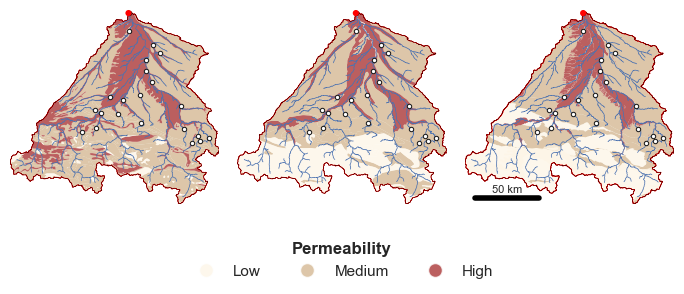

In [61]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(7, 3))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = garonne.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3] + 0.02

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1.0)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_garonne_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["FR001604"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_garonne_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["FR001604"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_garonne_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["FR001604"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)


# Plot the river
rivers_garonne.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_garonne.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_garonne.plot(ax=ax3, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

#text_to_subplots = ["Global", "Continental", "Regional"]
i = 0 
for ax in [ax1, ax2, ax3]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    #ax.set_title(text_to_subplots[i], loc="center", fontsize=14, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')
for ax in [ax3]:
    add_scalebar(ax, length_km=50, linewidth=4)

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig("../results/figs/figures/fig02b.png", dpi=300, bbox_inches='tight')

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/22233194.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/22233194.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/22233194.py:103: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/22233194.py:192: UserWarning: This figure includes Axes that are not compatible with tight_layout, so result

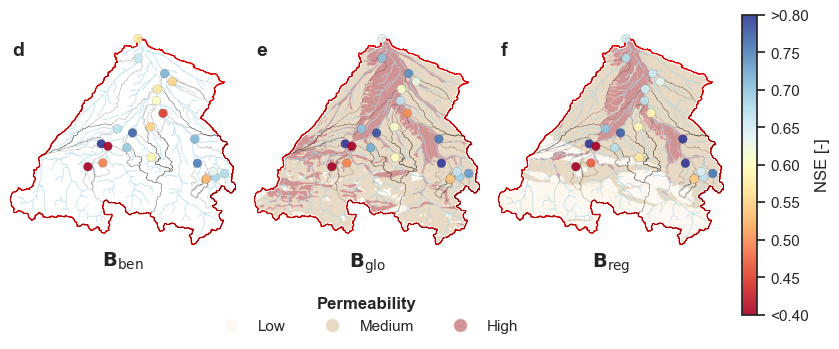

In [63]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 3, figsize=(7.5, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_r1comp']
titles = ['d', 'e', 'f']
main_titles = [r"$\mathbf{B_{\mathrm{ben}}}$", r"$\mathbf{B_{\mathrm{glo}}}$", 
                r"$\mathbf{B_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM','high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]+0.02

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.8
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.6])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.8, num=9
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.80"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, 0.15), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/figures/fig_3geomapsb.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_46669/1922932048.py:58: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_46669/1922932048.py:64: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_46669/1922932048.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True,
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_46669/1922932048.py:114: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True,


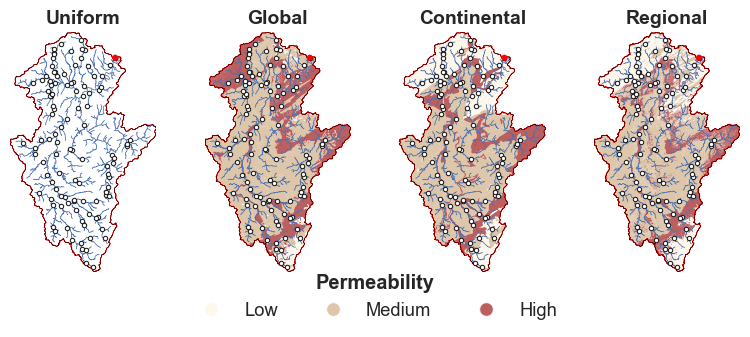

In [43]:
network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index
# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, (ax4, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(8, 3))  # Two subplots side by side

# Select multiple geometries
FR_selected_gdf = moselle.copy()

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set plot limits to the bounding box of the selected study areas
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

# Plot the first geology shapefile with different colors for each class
GLiM_moselle_dissolved.plot(column='permeability', ax=ax1, legend=True, 
                    categorical=True, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax1, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax1, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax1, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax1, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax1.set_xlim(x_min, x_max)
ax1.set_ylim(y_min, y_max)

# Set plot title and labels
ax1.set_xlabel('')
ax1.set_ylabel('')



# Plot the second geology shapefile with different colors for each class
geology_median_moselle_dissolved.plot(column='permeability', ax=ax2, legend=True, 
                    categorical=True, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax2, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax2, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax2, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)
# Set plot limits to the bounding box of the study area
ax2.set_xlim(x_min, x_max)
ax2.set_ylim(y_min, y_max)

# Set plot title and labels
#ax2.set_title('(c)', loc="left")
ax2.set_xlabel('')
ax2.set_ylabel('')
custom_label = ["Low", "Medium-low", "Medium-high", "High"]

# Plot the third geology shapefile with different colors for each class
geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax3, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax3, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax3, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the third geology shapefile with different colors for each class
#geology_high_moselle_dissolved.plot(column='permeability', ax=ax3, legend=True, 
#                    categorical=True, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax4, facecolor='none', edgecolor='red', linewidth=0.5, label='')

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax4, color='white', markersize=10, edgecolor='k', linewidth=0.75, 
                          label='Measurement Points', zorder=100)

network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax4, color='red', markersize=20, edgecolor='none', linewidth=0.5, 
                          label='Measurement Points', zorder=100)

# Plot the river
rivers_moselle.plot(ax=ax1, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax2, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax3, linewidth=0.5, label='River network')
rivers_moselle.plot(ax=ax4, linewidth=0.5, label='River network')

# Plot the mask to cover everything outside the study area
mask.plot(ax=ax3, facecolor='white', edgecolor='red', linewidth=0.5, label='Basins')

# Set plot limits to the bounding box of the study area
ax3.set_xlim(x_min, x_max)
ax3.set_ylim(y_min, y_max)

# Set plot limits to the bounding box of the study area
ax4.set_xlim(x_min, x_max)
ax4.set_ylim(y_min, y_max)

# Set plot title and labels
#ax3.set_title('(d)', loc="left")

text_to_subplots = ["Global", "Continental", "Regional", "Uniform"]
i = 0 
for ax in [ax1, ax2, ax3, ax4]:

    # Overlay the study area boundaries
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25, label='Sub-catchments')

    # Hide spines for main plot
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.spines['left'].set_visible(False)
    # Add text below the plot
    #ax.text(0.45, 1.075, text_to_subplots[i], transform=ax.transAxes, 
    #        fontsize=10, ha='center', va='top', color='black', fontweight='bold')
    ax.set_title(text_to_subplots[i], loc="center", fontsize=14, fontweight="bold")
    i = i + 1

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')

# Adjust the layout to remove extra space
plt.tight_layout()

fig.savefig("../results/figs/fig_geologies_and_muni.png", dpi=300, bbox_inches='tight')

In [54]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<=0.55].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
DERP2013,0.492395,0.636372,0.432591,-0.450964
FR000144,-0.031490,-0.217742,-0.172549,-0.519469
FR000185,0.407533,0.402529,0.462979,0.491879
FR003250,0.387080,0.466600,0.538871,0.607682
FR003280,0.150619,0.193092,0.165887,0.230102


### NSEs with the three geological maps in background

#### Space-time evaluation

In [56]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<=0.49].loc[:, ["nse_r1comp", "nse_c1comp", "nse_g1comp", "nse_nogeo"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo
FR000144,-0.031490,-0.217742,-0.172549,-0.519469
FR000185,0.407533,0.402529,0.462979,0.491879
FR003250,0.387080,0.466600,0.538871,0.607682
FR003280,0.150619,0.193092,0.165887,0.230102


/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/2342076225.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/2342076225.py:95: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_9837/2342076225.py:180: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


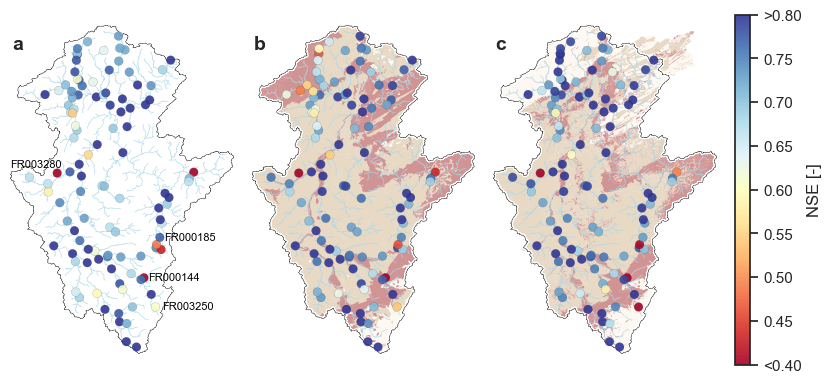

In [203]:
network_estreams_gdf

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,lakes_depth_mean,lakes_depth_mean_norm,q_mean_yr,p_mean_yr,norm_ups_cap,NSE,NSElstm,group,geometry,basin_id
basin_id,,,,,,,,,,,,,,,,,,,,,
FR004136,0,O149431003,Le Touyre Ã Lavelanet et Ã Saint-Quentin-la-...,FR,FR_EAUFRANCE,Le Touyre à Lavelanet et à Saint-Quentin-la-Tour,1.850824,42.940862,1.850824,42.940862,...,NaN,0.000000,846.800,888.775,0.000000,0.700021,0.815218,Group_1,POINT (1.85082 42.94086),FR004136
FR001547,1,O062401001,O0624010,FR,FR_EAUFRANCE,Le Volp à Montberaud et à Sainte-Croix-Volvestre,1.141456,43.144783,1.141456,43.144783,...,NaN,0.000000,337.990,819.790,0.000000,0.823456,0.876788,Group_1,POINT (1.14146 43.14478),FR001547
FR004091,2,O023402001,Le Ger Ã Aspet [2],FR,FR_EAUFRANCE,Le Ger à Aspet [2],0.795350,43.021419,0.795350,43.021419,...,NaN,0.000000,919.800,1040.250,0.000000,0.723698,0.848994,Group_1,POINT (0.79535 43.02142),FR004091
FR001592,3,O221501001,O2215010,FR,FR_EAUFRANCE,La Saune à Quint-Fonsegrives,1.548308,43.574698,1.548308,43.574698,...,3.648649,12.385889,117.165,657.730,0.018831,0.809932,0.811849,Group_1,POINT (1.54831 43.5747),FR001592
FR001577,4,O158461001,O1584610,FR,FR_EAUFRANCE,Le Douctouyre à Dun et à Vira [Engraviès],1.772643,43.043560,1.772643,43.043560,...,NaN,0.000000,380.330,832.930,0.000000,0.852887,0.849163,Group_1,POINT (1.77264 43.04356),FR001577
FR004140,5,O163401001,La VixiÃ¨ge Ã Belpech,FR,FR_EAUFRANCE,La Vixiège à Belpech,1.749951,43.201718,1.749951,43.201718,...,NaN,0.000000,195.640,718.685,0.000000,0.822625,0.817920,Group_1,POINT (1.74995 43.20172),FR004140
FR004149,6,O184402001,La LÃ¨ze Ã LÃ©zat-sur-LÃ¨ze,FR,FR_EAUFRANCE,La Lèze à Lézat-sur-Lèze,1.352878,43.280809,1.352878,43.280809,...,7.571429,12.564601,178.485,775.260,0.016207,0.853714,0.893136,Group_1,POINT (1.35288 43.28081),FR004149
FR004152,7,O187401001,La LÃ¨ze Ã Labarthe-sur-LÃ¨ze,FR,FR_EAUFRANCE,La Lèze à Labarthe-sur-Lèze,1.406594,43.451190,1.406594,43.451190,...,7.571429,8.638464,161.330,740.220,0.011670,0.866051,0.889248,Group_1,POINT (1.40659 43.45119),FR004152
FR001593,8,O222251001,O2222510,FR,FR_EAUFRANCE,L'Hers à Toulouse [Pont de Périole],1.480100,43.627770,1.480100,43.627770,...,4.817610,9.651561,138.335,665.030,0.014513,0.820100,0.826636,Group_1,POINT (1.4801 43.62777),FR001593


In [68]:
data_diff_val_complete_all.describe()

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
count,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000,...,123.000000,123.000000,123.000000,123.000000,130.000000,130.000000,130.000000,130.000000,130.000000,130.000000
mean,0.689365,0.708429,0.721838,0.730645,0.697141,0.574581,0.620445,0.630230,0.641950,0.658098,...,2.403901,2.260883,2.071495,2.211735,1.089849,0.880224,0.883634,0.879122,0.878452,0.883837
std,0.184868,0.140273,0.141809,0.135165,0.199001,0.078825,0.073809,0.067267,0.071230,0.027285,...,0.631753,0.635333,0.478530,0.473331,0.567416,0.476537,0.476979,0.466412,0.477020,0.479587
min,-0.519469,-0.172549,-0.217742,-0.031490,-0.626634,0.360721,0.463173,0.472602,0.510943,0.580789,...,0.921207,1.041087,1.655259,1.391640,0.262016,0.254708,0.250709,0.260345,0.267358,0.245116
25%,0.664210,0.668389,0.679284,0.695765,0.668988,0.527461,0.562906,0.585789,0.581267,0.651802,...,2.124354,1.899406,1.789773,1.934694,0.774578,0.616537,0.616590,0.619967,0.611779,0.618621
50%,0.717852,0.733759,0.743795,0.753722,0.734004,0.579872,0.603584,0.620697,0.630302,0.666758,...,2.420230,2.268494,1.912951,2.059362,0.959616,0.762178,0.768606,0.763002,0.758903,0.765319
75%,0.783458,0.789967,0.801531,0.814838,0.801704,0.620018,0.657964,0.658348,0.686960,0.675929,...,2.759961,2.612049,2.068901,2.419445,1.240555,0.964802,0.966612,0.963541,0.966154,0.978443
max,0.864204,0.892751,0.894613,0.903710,0.887530,0.818778,0.833606,0.826527,0.819202,0.700898,...,5.160676,4.457492,4.741721,4.588602,3.597884,3.248803,3.230535,3.180761,3.243641,3.276687


In [588]:
network_estreams_garonne_22_gauges.columns[80:100]

Index(['lit_fra_pb', 'lit_fra_va', 'lit_fra_vb', 'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'lit_fra_Conglomerates', 'lit_fra_Conglomerates and sands',
       'lit_fra_Gravels', 'lit_fra_Sands', 'lit_fra_Sandstones',
       'lit_fra_Sandstones and sands', 'root_dep_mean', 'root_dep_max',
       'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean',
       'soil_fra_silt_mean', 'soil_fra_clay_mean'],
      dtype='object')

In [130]:
network_estreams_garonne_22_gauges["root_dep_mean"].describe()

count     22.000000
mean      85.943682
std       21.160798
min       46.344000
25%       72.642500
50%       86.494500
75%       96.473500
max      122.742000
Name: root_dep_mean, dtype: float64

In [131]:
data_diff_val_complete_dict_plot_garonne[data_diff_val_complete_dict_plot_garonne.nse_r1comp<0.5].index.tolist()

['FR001544', 'FR001545', 'FR004091']

In [139]:
data_diff_val_complete_dict_plot_garonne["root_dep_mean"] = network_estreams_garonne_22_gauges["root_dep_mean"]
data_diff_val_complete_dict_plot["area_estreams"] = network_estreams_moselle_108_gauges["area_estreams"]

In [136]:
data_diff_val_complete_dict_plot_garonne.corr(method="spearman")

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,root_dep_mean
nse_nogeo,1.000000,0.966121,0.963862,0.888199,0.960474,0.584416
nse_g1comp,0.966121,1.000000,0.972897,0.944664,0.983060,0.682665
nse_c1comp,0.963862,0.972897,1.000000,0.905138,0.953698,0.581028
nse_r1comp,0.888199,0.944664,0.905138,1.000000,0.902880,0.684924
nse_rand,0.960474,0.983060,0.953698,0.902880,1.000000,0.688312
root_dep_mean,0.584416,0.682665,0.581028,0.684924,0.688312,1.000000


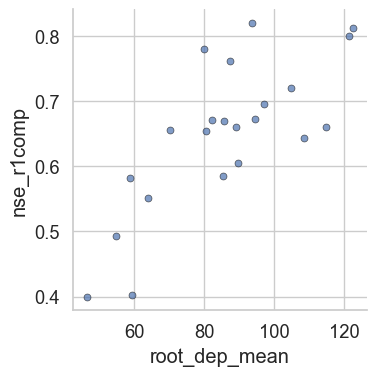

In [143]:
# Example variable names — CHANGE THESE
x_var = "root_dep_mean"
y_var = "nse_r1comp"

fig, ax = plt.subplots(figsize=(4, 4))

ax.scatter(
    data_diff_val_complete_dict_plot_garonne[x_var],
    data_diff_val_complete_dict_plot_garonne[y_var],
    s=25,
    edgecolor="k",
    linewidth=0.5,
    alpha=0.7
)

ax.set_xlabel(x_var)
ax.set_ylabel(y_var)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("../results/figs/figures/S15_fig_scatterroot_nse.png", dpi=300, bbox_inches='tight')

plt.show()

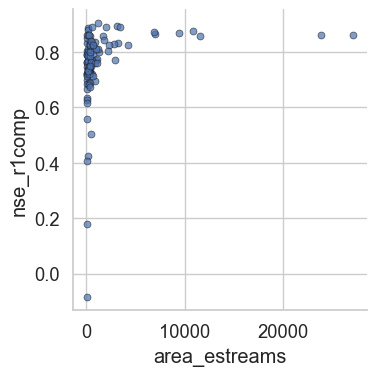

In [142]:
# Example variable names — CHANGE THESE
x_var = "area_estreams"
y_var = "nse_r1comp"

fig, ax = plt.subplots(figsize=(4, 4))

ax.scatter(
    data_diff_val_complete_dict_plot[x_var],
    data_diff_val_complete_dict_plot[y_var],
    s=25,
    edgecolor="k",
    linewidth=0.5,
    alpha=0.7
)

ax.set_xlabel(x_var)
ax.set_ylabel(y_var)

ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
plt.savefig("../results/figs/figures/S15_fig_scatter_area_nse.png", dpi=300, bbox_inches='tight')
plt.tight_layout()
plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3909379330.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3909379330.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3909379330.py:101: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3909379330.py:103: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_

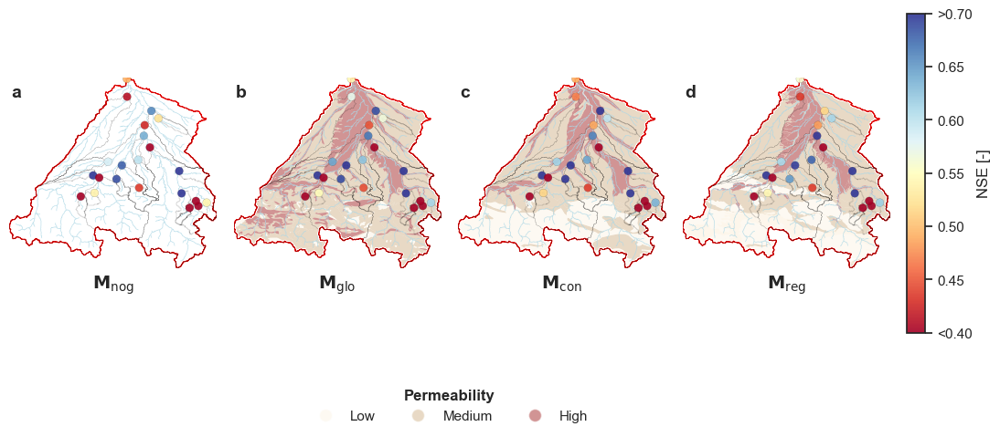

In [115]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{nog}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.7
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.7, num=7
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.70"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
#plt.savefig(
#    "../results/figs/fig_4geomaps.png",
#    dpi=300,
#    bbox_inches='tight'
#)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/2014762071.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/2014762071.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/2014762071.py:101: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/2014762071.py:103: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_

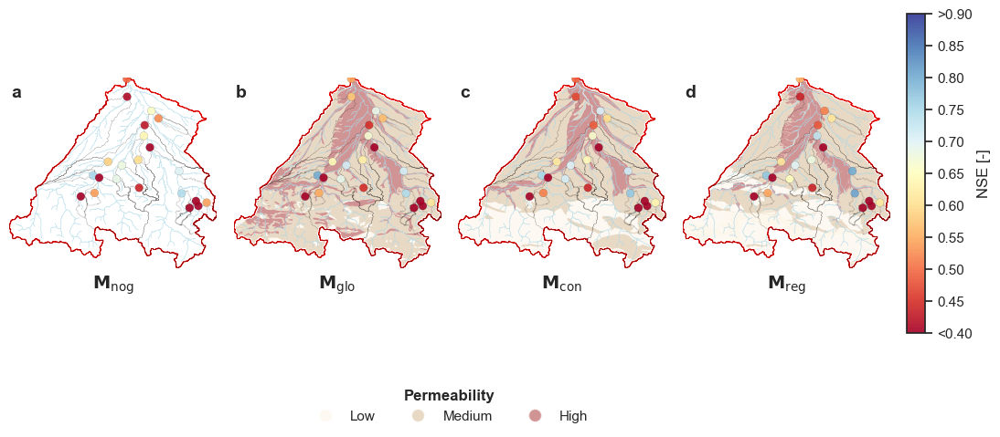

In [119]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_val_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{nog}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.9
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.9, num=11
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.90"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
#plt.savefig(
#    "../results/figs/fig_4geomaps.png",
#    dpi=300,
#    bbox_inches='tight'
#)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:101: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:103: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_

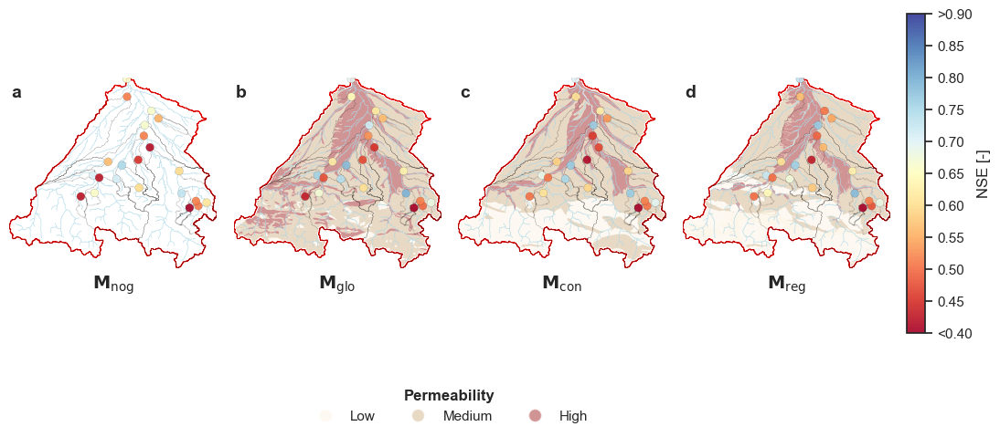

In [167]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_cal_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{nog}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.9
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.9, num=11
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.90"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
#plt.savefig(
#    "../results/figs/fig_4geomaps.png",
#    dpi=300,
#    bbox_inches='tight'
#)

plt.show()

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:84: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  combined_geometry = FR_selected_gdf.unary_union
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:99: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:101: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_1714/3226356843.py:103: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_

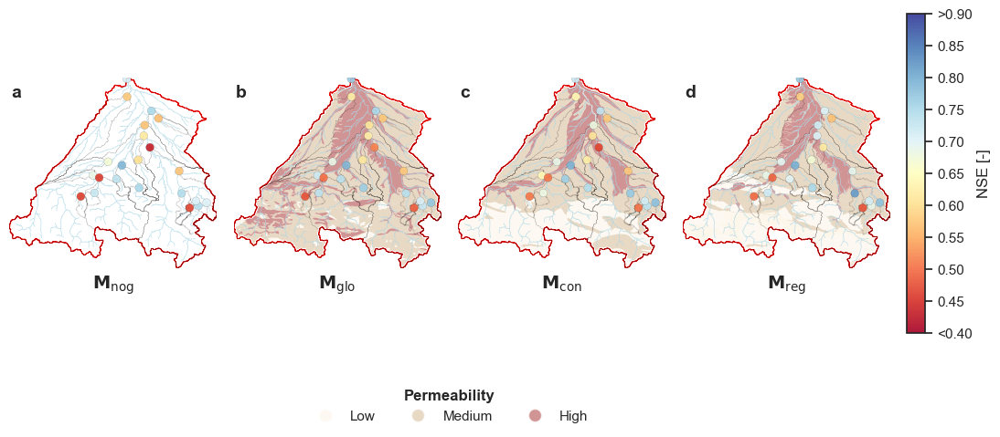

In [118]:
network_estreams_gdf = estreams_attributes_garonne_clipped_filters.loc[~estreams_attributes_garonne_clipped_filters.index.duplicated(keep='first')]

catchment_boundaries_garonne = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]

#selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "oldlace",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_garonne_dissolved['color'] = GLiM_garonne_dissolved['permeability'].map(color_mapping_glim)
geology_median_garonne_dissolved['color'] = geology_median_garonne_dissolved['permeability'].map(color_mapping_geology)
geology_high_garonne_dissolved['color'] = geology_high_garonne_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_cal_complete_garonne.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{nog}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = garonne.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = FR_selected_gdf.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)


# Color setup
vmin, vmax = 0.4, 0.9
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_garonne_dissolved.plot(column='permeability', ax=ax, color=GLiM_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'median':
        geology_median_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_median_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)
    elif bg_type == 'high':
        geology_high_garonne_dissolved.plot(column='permeability', ax=ax, color=geology_high_garonne_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.5)

    # Add rivers and boundary for all
    garonne.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_garonne.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_garonne.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.4, 0.9, num=11
                    )
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f">0.90"]
#cbar.set_ticks(ticks)
cbar.set_ticks(np.arange(vmin, vmax + 0.05, 0.05))

cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.5),
    'Medium': to_rgba('tan', 0.5),
    'High': to_rgba('brown', 0.5)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label, linewidth=0.5)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


#axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
#axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
#plt.savefig(
#    "../results/figs/fig_4geomaps.png",
#    dpi=300,
#    bbox_inches='tight'
#)

plt.show()

#### Calibration

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/2402717926.py:86: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/2402717926.py:88: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/2402717926.py:90: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/2402717926.py:176

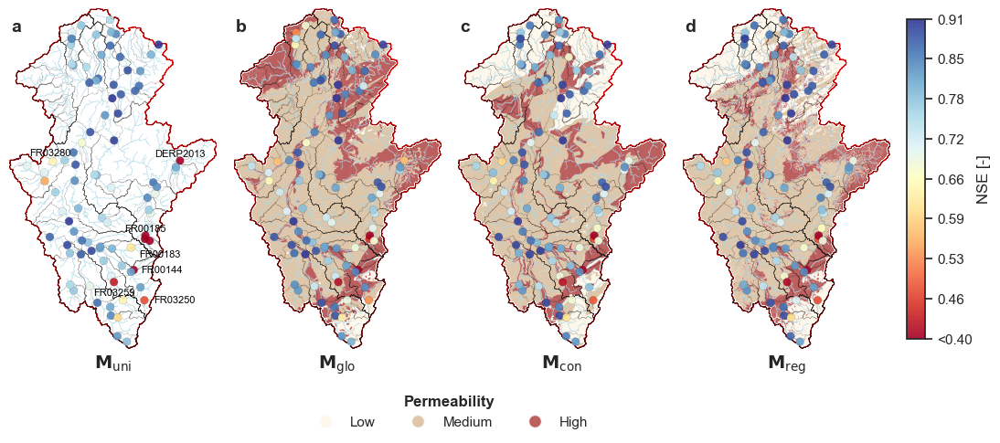

In [273]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_calibration_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = moselle.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
#plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Color setup
vmin, vmax = 0.40, 0.91
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'median':
        geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'high':
        geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

    # Add rivers and boundary for all
    moselle.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.40, 0.91, num=9)
tick_labels = [f"<0.40"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.91"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/fig_4geomaps_cal.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

#### Space evaluation

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/972619865.py:89: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/972619865.py:91: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/972619865.py:93: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_12599/972619865.py:179: Us

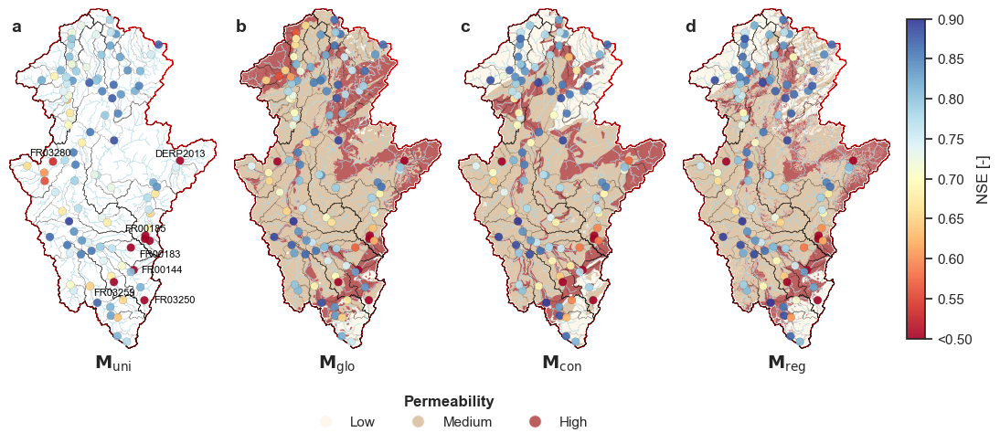

In [207]:
selected_ids = ["DERP2013", "FR000144", "FR000183", "FR000185", "FR003250", "FR003259","FR003280"]


import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.lines as mlines


network_estreams_gdf = estreams_attributes_clipped_filters.loc[~estreams_attributes_clipped_filters.index.duplicated(keep='first')]

# Create a GeoDataFrame from network_estreams_filtered
geometry = [Point(xy) for xy in zip(network_estreams_gdf['lon'], network_estreams_gdf['lat'])]
network_estreams_gdf = gpd.GeoDataFrame(network_estreams_gdf, geometry=geometry, crs='EPSG:4326')
network_estreams_gdf["basin_id"] = network_estreams_gdf.index

# Define the first color mapping for GLiM_dissolved
color_mapping_glim = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

# Define the second color mapping for geology_median_dissolved
color_mapping_geology2 = {
    'very low': "oldlace",  
    'low': "tan",  
    'medium': "tan",  
    'high': "brown"
}

color_dict_legend = {
    'very low': 'oldlace',
    'low': 'tan',
    'medium': 'tan',
    'high': 'brown'
}

# Add a column for colors based on the class
GLiM_moselle_dissolved['color'] = GLiM_moselle_dissolved['permeability'].map(color_mapping_glim)
geology_median_moselle_dissolved['color'] = geology_median_moselle_dissolved['permeability'].map(color_mapping_geology)
geology_high_moselle_dissolved['color'] = geology_high_moselle_dissolved['permeability'].map(color_mapping_geology2)

# Set style
sns.set_theme(style="ticks")

# Copy and add coordinates
df = data_diff_cal_complete.copy()
df[["lat", "lon"]] = network_estreams[["lat", "lon"]]

# Create figure
fig, axes = plt.subplots(1, 4, figsize=(10, 5), sharex=True, sharey=True)

# NSE columns and titles
nse_cols = ['nse_nogeo', 'nse_g1comp', 'nse_c1comp', 'nse_r1comp']
titles = ['a', 'b', 'c', 'd']
main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

background_maps = ['none', 'GLiM', 'median', 'high']

# Set plot limits to the bounding box of the selected study areas
FR_selected_gdf = moselle.copy()
bounds = FR_selected_gdf.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

## Create a mask that covers the entire plotting area
#plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
#mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Color setup
vmin, vmax = 0.5, 0.9
cmap_nse = plt.cm.RdYlBu

# Plot loop
for ax, col, subtitle, maintitle, bg_type in zip(axes, nse_cols, titles, main_titles, background_maps):

    # Add background geology map where appropriate
    if bg_type == 'GLiM':
        GLiM_moselle_dissolved.plot(column='permeability', ax=ax, color=GLiM_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'median':
        geology_median_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_median_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)
    elif bg_type == 'high':
        geology_high_moselle_dissolved.plot(column='permeability', ax=ax, color=geology_high_moselle_dissolved['color'], edgecolor='none', linewidth=0, alpha=0.75)

    # Add rivers and boundary for all
    moselle.plot(ax=ax, color='none', linewidth=2, alpha=1)
    rivers_moselle.plot(ax=ax, color='lightblue', linewidth=0.5, alpha=0.75)

#   if bg_type != 'none':
    FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=0.25)
    mask.plot(ax=ax, facecolor='white', edgecolor='red', linewidth=0.75)

    # Scatter NSE values
    sc = ax.scatter(
        df['lon'], df['lat'],
        c=df[col],
        cmap=cmap_nse,
        vmin=vmin,
        vmax=vmax,
        s=40,
        edgecolor='k',
        linewidth=0.1,
        alpha=0.9,
        zorder=10
    )

    # Subplot letter
    ax.text(0.01, 0.97, subtitle, transform=ax.transAxes, fontsize=14, fontweight='bold', va='top', ha='left')

    # Set plot limits to the bounding box of the study area
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)

    # Clean look
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel(maintitle, fontsize=14, fontweight='bold')
    ax.set_ylabel("")
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)


    catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.1, label='Sub-catchments')



# Colorbar setup
fig.subplots_adjust(right=0.85)
cbar_ax = fig.add_axes([1.0, 0.15, 0.02, 0.7])
cbar = fig.colorbar(sc, cax=cbar_ax)
cbar.set_label('NSE [-]')
ticks = np.linspace(0.5, 0.9, num=9)
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.colors import to_rgba

# Define the color dictionary with alpha transparency (0.5 for 50% opacity)
color_dict_legend = {
    'Low': to_rgba('oldlace', 0.75),
    'Medium': to_rgba('tan', 0.75),
    'High': to_rgba('brown', 0.75)
}

# Create custom legend elements with alpha applied to markerfacecolor
legend_elements = [Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10, label=label)
                   for label, color in color_dict_legend.items()]

# Add the legend outside the plot area with minimal space
legend = fig.legend(handles=legend_elements, title='Permeability', loc='center', frameon=False, 
                   bbox_to_anchor=(0.5, -0.01), ncol=5)
# Make the legend title bold
legend.get_title().set_fontweight('bold')


axes[0].text(7.419000,49.27, "DERP2013", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.014472,48.7, "FR00185", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.18,48.5, "FR00183", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.2,48.38, "FR00144", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(7.35,48.15, "FR03250", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(6.645964,48.21, "FR03259", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
axes[0].text(5.9,49.28, "FR03280", fontsize=8, ha='center', va='bottom', zorder=20, color='black')
	
# Save and show
plt.tight_layout()

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/fig_4geomaps_space.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [209]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.55][["nse_r1comp", "nse_nogeo"]]

,nse_r1comp,nse_nogeo
FR000183,0.483997,0.391630
FR000185,0.261731,0.360620
FR000144,0.250477,-0.190943
FR003280,0.410790,0.535879
DERP2013,0.500465,-0.454676
FR003259,0.282321,0.329937
FR003250,0.231655,0.392146


### Catchments with the lowest performance

#### Some analysis

In [19]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.5][["nse_r1comp", "nse_nogeo"]]


,nse_r1comp,nse_nogeo
FR000183,0.488465,0.381274
FR000185,0.263676,0.356058
FR000144,0.235977,-0.214744
FR003280,0.402323,0.531344
DERP2013,0.443957,-0.506631
FR003259,0.272996,0.323611
FR003250,0.181581,0.382867


In [20]:
estreams_attributes.loc[["FR000183","FR000185", "FR000144", "FR003280", "DERP2013", "FR003259", "FR003250"], ["frac_snow", "sno_cov_mean", "root_dep_mean",'soil_fra_sand_mean',
       'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', "bedrk_dep", "hfd_mean"]]

,frac_snow,sno_cov_mean,root_dep_mean,soil_fra_sand_mean,soil_fra_silt_mean,soil_fra_clay_mean,soil_fra_grav_mean,bedrk_dep,hfd_mean
basin_id,,,,,,,,,
FR000183,0.042,5.440,93.143,71.914,16.614,11.471,7.014,0.887,152.760
FR000185,0.043,5.536,92.353,68.257,18.866,12.877,7.235,0.912,145.097
FR000144,0.047,7.244,79.831,76.475,15.559,7.966,5.483,0.917,172.085
FR003280,0.036,2.491,103.243,30.568,33.054,36.378,8.878,1.248,148.667
DERP2013,0.039,3.575,116.881,39.495,35.219,25.285,9.293,1.017,166.582
FR003259,0.041,3.622,128.125,51.312,24.641,24.047,6.672,1.009,136.647
FR003250,0.075,11.555,89.701,73.896,16.537,9.567,7.597,0.802,156.082


In [21]:
estreams_attributes_clipped_filters.bedrk_dep.describe()

count    112.000000
mean       1.269929
std        0.543463
min        0.691000
25%        1.024250
50%        1.111500
75%        1.247250
max        4.694000
Name: bedrk_dep, dtype: float64

In [22]:
estreams_attributes_clipped_filters.sno_cov_mean.describe()

count    112.000000
mean       4.879259
std        2.027789
min        2.060000
25%        3.188000
50%        4.614000
75%        6.350000
max       11.555000
Name: sno_cov_mean, dtype: float64

In [23]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.55][["nse_r1comp","nse_g1comp", "nse_nogeo", "bfi_obs", "bfi_r1comp"]]

,nse_r1comp,nse_g1comp,nse_nogeo,bfi_obs,bfi_r1comp
FR000183,0.488465,0.468859,0.381274,0.740801,0.729413
FR000185,0.263676,0.308589,0.356058,0.537419,0.762668
FR000144,0.235977,0.165087,-0.214744,0.698369,0.801613
FR003280,0.402323,0.422430,0.531344,0.665425,0.498500
DERP2013,0.443957,0.348807,-0.506631,0.816544,0.801445
FR003259,0.272996,0.343248,0.323611,0.576604,0.726737
FR003250,0.181581,0.311894,0.382867,0.685264,0.535945


In [24]:
len(data_diff_val_complete[data_diff_val_complete.nse_r1comp>0.5])/108

0.9351851851851852

In [25]:
estreams_attributes_clipped_filters.loc[["DERP2013", "FR003280", "FR003250", "FR000185", "FR003259"]][["root_dep_mean", "perm_low_regi", "perm_high_regi", "perm_high_glob2", "perm_low_glob2"]]

,root_dep_mean,perm_low_regi,perm_high_regi,perm_high_glob2,perm_low_glob2
basin_id,,,,,
DERP2013,116.881,0.0,91.0,92.0,0.0
FR003280,103.243,0.0,0.0,0.0,0.0
FR003250,89.701,96.0,4.0,0.0,94.0
FR000185,92.353,2.0,75.0,71.0,2.0
FR003259,128.125,0.0,66.0,35.0,0.0


In [26]:
network_estreams.loc[data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.5].index.tolist()]


,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,elevation,...,num_continuous_days,num_days_gaps,num_days_reliable,num_days_noflag,num_days_suspect,gauge_flag,duplicated_suspect,watershed_group,gauges_upstream,nested_catchments
basin_id,,,,,,,,,,,,,,,,,,,,,
FR000183,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,268,...,5322,399.0,19568.0,62.0,120.0,A,NaN,1,1,[FR000183]
FR000185,A902101060,A9021050,FR,FR_EAUFRANCE,La Sarre à Hermelange,7.014472,48.680322,7.014472,48.680322,258,...,4108,1711.0,13759.0,0.0,22.0,D,[FR003292],1,3,"[FR000183, FR000184, FR000185]"
FR000144,A623201001,A6232010,FR,FR_EAUFRANCE,La Plaine à Raon-l'Étape [La Trouche],6.877879,48.416320,6.877879,48.416320,290,...,11494,179.0,19423.0,0.0,29.0,A,NaN,1,1,[FR000144]
FR003280,A832201001,Le Woigot Ã Briey,FR,FR_EAUFRANCE,Le Woigot à Briey,5.933378,49.246953,5.933378,49.246953,204,...,15790,39.0,19517.0,818.0,188.0,B,NaN,1,3,"[FR003278, FR003279, FR003280]"
DERP2013,2642030800,Contwig,DE,DE_RP,Schwarzbach,7.419000,49.254000,7.419000,49.254000,NaN,...,24532,101.0,0.0,25162.0,0.0,B,NaN,1,1,[DERP2013]
FR003259,A664031002,L'ArentÃƒÂ¨le ÃƒÂ Saint-Gorgon et ÃƒÂ Sainte...,FR,FR_EAUFRANCE,L'Arentèle à Saint-Gorgon et à Sainte-Hélène,6.645964,48.324169,6.645964,48.324169,295,...,4268,64.0,6737.0,0.0,275.0,A,NaN,1,2,"[FR000152, FR003259]"
FR003250,A600101001,La Meurthe Ã Fraize,FR,FR_EAUFRANCE,La Meurthe à Fraize,7.002529,48.184730,7.002529,48.184730,498,...,7524,192.0,18280.0,0.0,606.0,A,NaN,1,1,[FR003250]


#### Plot of the hydrographs

In [676]:
# Base directory and group names
base_dir = Path("../results/sim/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.median(dim="group")

In [678]:
# Base directory and group names
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean_garonne = combined.median(dim="group")

In [94]:
data_diff_val_complete[0:10]

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,hfd_obs,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo
LU000018,0.623167,0.656544,0.515473,0.661654,0.552706,0.663353,0.800025,0.541536,0.654113,127.166667,...,2.305895,1.731172,1.142526,2.655898,1.937037,0.895844,0.699256,0.701622,0.703222,0.690309
LU000010,0.736587,0.694558,0.689694,0.781961,0.622472,0.666757,0.776345,0.536320,0.646960,130.500000,...,1.430667,1.722703,1.231856,2.760369,1.960620,0.926464,0.799266,0.799395,0.796793,0.787888
LU000001,0.822228,0.631810,0.877058,0.875687,0.549832,0.525752,0.569345,0.787654,0.638234,121.500000,...,3.860265,3.673564,3.158744,1.279501,1.798806,1.192096,1.075056,1.055832,1.081987,1.060214
DERP2028,0.824758,0.748662,0.629006,0.706292,0.592346,0.768685,0.808396,0.741989,0.641671,131.360000,...,2.249432,1.594274,1.417228,1.624455,2.024797,1.076659,0.981786,0.977432,0.980678,0.979753
FR000183,0.381274,0.468859,0.468789,0.488465,0.740801,0.729413,0.725957,0.711384,0.639381,143.640000,...,2.204864,1.492491,1.475270,1.692929,1.940255,1.358760,1.117682,1.105955,1.110896,1.112764
DERP2008,0.725419,0.816535,0.784371,0.803070,0.463799,0.541792,0.589410,0.533013,0.644855,120.320000,...,3.553243,3.889546,3.316604,2.764790,2.085375,1.047299,1.030159,1.019865,1.013702,1.011802
FR000137,0.749384,0.804027,0.798259,0.805258,0.513152,0.545543,0.567894,0.525656,0.640952,120.520000,...,2.966331,2.713732,2.623395,2.969173,2.057411,0.995667,0.980845,0.980867,0.985966,0.983133
FR003294,0.655522,0.688224,0.680527,0.687140,0.526730,0.525945,0.549793,0.533317,0.649204,118.320000,...,2.515494,2.971062,2.845283,2.869261,2.121811,0.914831,0.772318,0.773103,0.777816,0.778285
FR000185,0.356058,0.308589,0.254690,0.263676,0.537419,0.762668,0.760217,0.729550,0.631692,139.428571,...,3.200160,1.292625,1.255738,1.479305,1.903427,0.799352,1.184124,1.167569,1.181095,1.194112
FR000154,0.740449,0.748546,0.752649,0.744467,0.546750,0.539594,0.573422,0.539525,0.651190,128.480000,...,1.965744,2.929959,2.718527,2.941249,2.092886,0.863725,0.699526,0.702685,0.707107,0.700384


In [95]:
data_diff_val_complete[["bfi_obs", "bfi_nogeo", "bfi_r1comp", "nse_r1comp"]][-20:]

,bfi_obs,bfi_nogeo,bfi_r1comp,nse_r1comp
FR003257,0.524937,0.646410,0.625163,0.812415
FR003296,0.544513,0.643966,0.634810,0.787751
FR000171,0.527469,0.653833,0.552552,0.793622
FR000140,0.570017,0.626647,0.600939,0.885177
DEBU1956,0.602919,0.641835,0.614062,0.855106
LU000002,0.576345,0.654732,0.608045,0.772331
LU000016,0.568219,0.658629,0.579306,0.694848
FR003250,0.685264,0.628615,0.535945,0.181581
FR000132,0.658858,0.612957,0.652564,0.712411
FR003254,0.756521,0.650467,0.726529,0.586972


In [39]:
ts

<xarray.Dataset> Size: 7kB
Dimensions:        (date: 92)
Coordinates:
  * date           (date) datetime64[ns] 736B 2006-10-01 ... 2006-12-31
    gauge_id       <U8 32B 'LU000016'
Data variables:
    regional       (date) float64 736B 0.2116 0.2786 0.6998 ... 0.5319 2.121
    continental    (date) float64 736B 0.2255 0.2923 0.6493 ... 0.5556 1.943
    global         (date) float64 736B 0.1778 0.2417 0.566 ... 0.5352 2.383
    nogeology      (date) float64 736B 0.2711 0.3053 0.5146 ... 0.5788 1.597
    random         (date) float64 736B 0.3414 0.3479 0.581 ... 0.7026 1.572
    observation    (date) float64 736B 0.5318 0.456 2.091 ... 0.7161 2.196
    precipitation  (date) float64 736B 5.25 19.64 20.8 0.71 ... 0.0 13.39 13.57
    temperature    (date) float64 736B 16.77 14.22 12.53 11.4 ... 0.16 4.78 9.51
    evaporation    (date) float64 736B 1.99 1.29 0.93 1.63 ... 0.37 0.55 0.38

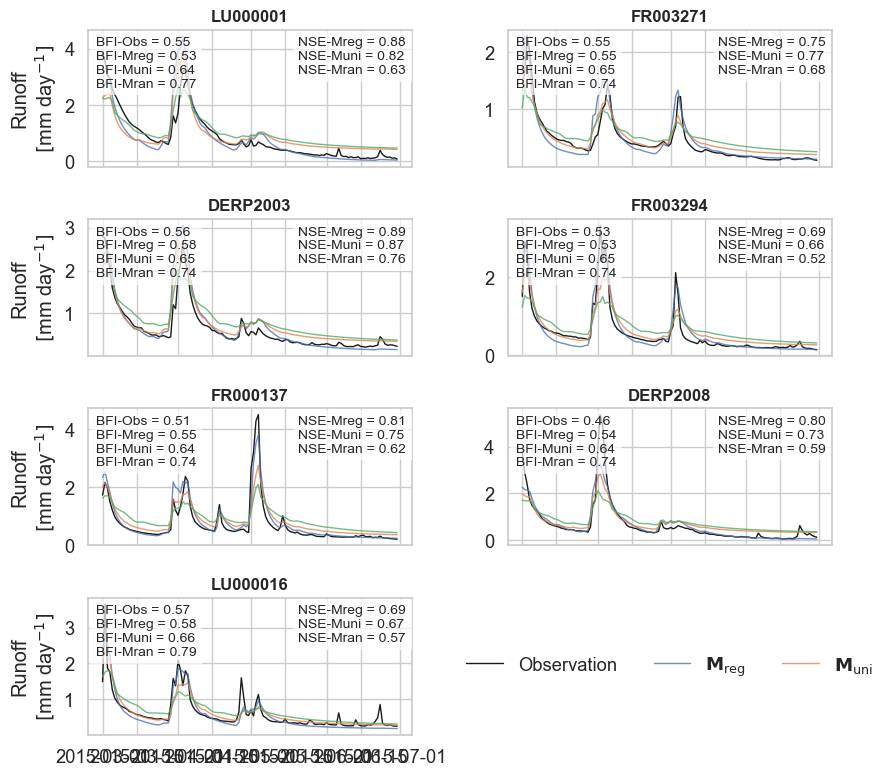

In [46]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["LU000001", "FR003271", "DERP2003", "FR003294", "FR000137", "DERP2008", "LU000016"]  # Your 6 gauge IDs
start_date = "2015-03-01"
end_date = "2015-06-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(9, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["nogeology"], label="No geology", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["random"], label="Random", linewidth=1.0, alpha=0.8)

    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse1 = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse2 = data_diff_val_complete.loc[gauge_id, "nse_nogeo"]
    nse3 = data_diff_val_complete.loc[gauge_id, "nse_rand"]

    bfi_obs = data_diff_val_complete.loc[gauge_id, "bfi_obs"]
    bfi_nogeo = data_diff_val_complete.loc[gauge_id, "bfi_nogeo"]
    bfi_r1comp = data_diff_val_complete.loc[gauge_id, "bfi_r1comp"]
    bfi_rand = data_diff_val_complete.loc[gauge_id, "bfi_rand"]

    nse_label = f"NSE-Mreg = {nse1:.2f}\nNSE-Muni = {nse2:.2f}\nNSE-Mran = {nse3:.2f}"
    bfi_label = f"BFI-Obs = {bfi_obs:.2f}\nBFI-Mreg = {bfi_r1comp:.2f}\nBFI-Muni = {bfi_nogeo:.2f}\nBFI-Mran = {bfi_rand:.2f}"

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.65, 0.95, nse_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.025, 0.95, bfi_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"$\mathbf{M_{\mathrm{reg}}}$", r"$\mathbf{M_{\mathrm{uni}}}$"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/SI_hydrographs_MregMuni.png",
    dpi=300,
    bbox_inches='tight'
)

In [87]:
ds_mean

<xarray.Dataset> Size: 16MB
Dimensions:        (gauge_id: 22, date: 9861)
Coordinates:
  * date           (date) datetime64[ns] 79kB 1988-10-01 ... 2015-09-30
  * gauge_id       (gauge_id) object 176B 'FR001526' 'FR001544' ... 'FR004162'
Data variables:
    regional       (gauge_id, date) float64 2MB 0.0 0.0 0.0 ... 0.03595 0.03577
    continental    (gauge_id, date) float64 2MB 0.0 0.0 0.0 ... 0.06877 0.06862
    global         (gauge_id, date) float64 2MB 0.0 0.0 0.0 ... 0.1163 0.1161
    nogeology      (gauge_id, date) float64 2MB 0.0 0.0 ... 0.006517 0.006266
    random         (gauge_id, date) float64 2MB 0.0 0.0 0.0 ... 0.07296 0.07281
    observation    (gauge_id, date) float64 2MB 0.1795 0.1738 ... 0.1048 0.1017
    precipitation  (gauge_id, date) float64 2MB 0.0 0.0 0.0 ... 0.0 0.3874 0.0
    temperature    (gauge_id, date) float64 2MB 9.48 11.54 13.34 ... 15.15 15.37
    evaporation    (gauge_id, date) float64 2MB 2.37 2.57 2.63 ... 2.57 2.27

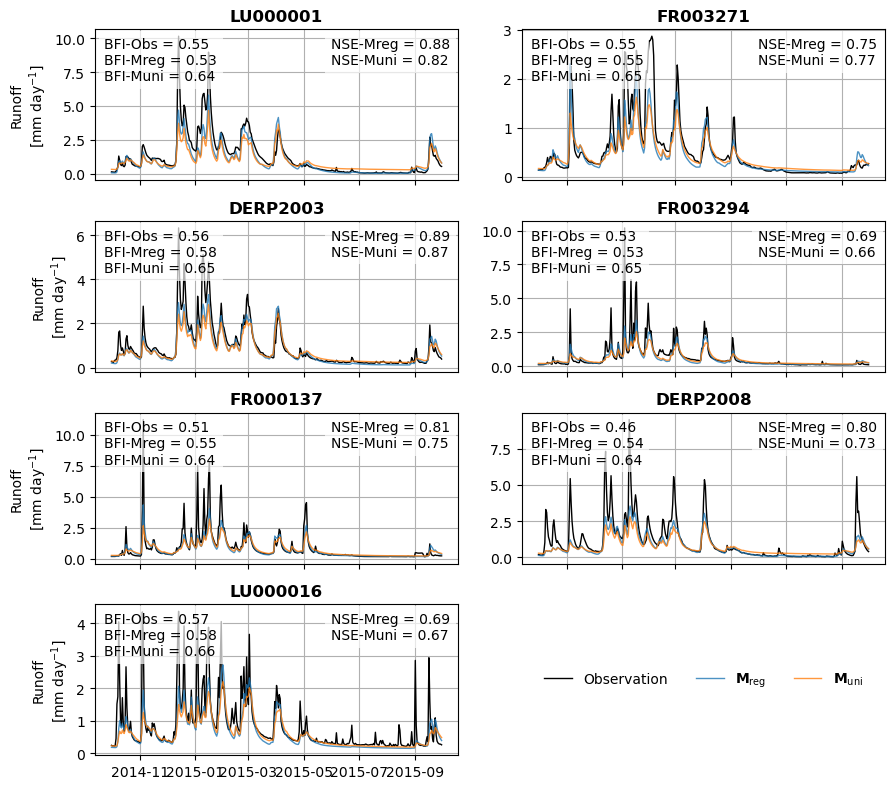

In [99]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["LU000001", "FR003271", "DERP2003", "FR003294", "FR000137", "DERP2008", "LU000016"]  # Your 6 gauge IDs
start_date = "2014-10-01"
end_date = "2015-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(9, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    ax.plot(ts.date, ts["nogeology"], label="No geology", linewidth=1.0, alpha=0.8)

    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse1 = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse2 = data_diff_val_complete.loc[gauge_id, "nse_nogeo"]
    
    bfi_obs = data_diff_val_complete.loc[gauge_id, "bfi_obs"]
    bfi_nogeo = data_diff_val_complete.loc[gauge_id, "bfi_nogeo"]
    bfi_r1comp = data_diff_val_complete.loc[gauge_id, "bfi_r1comp"]

    nse_label = f"NSE-Mreg = {nse1:.2f}\nNSE-Muni = {nse2:.2f}"
    bfi_label = f"BFI-Obs = {bfi_obs:.2f}\nBFI-Mreg = {bfi_r1comp:.2f}\nBFI-Muni = {bfi_nogeo:.2f}"

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.65, 0.95, nse_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.025, 0.95, bfi_label,
        transform=ax.transAxes,
        ha='left', va='top',
        fontsize=10,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"$\mathbf{M_{\mathrm{reg}}}$", r"$\mathbf{M_{\mathrm{uni}}}$"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/SI_hydrographs_MregMuni.png",
    dpi=300,
    bbox_inches='tight'
)

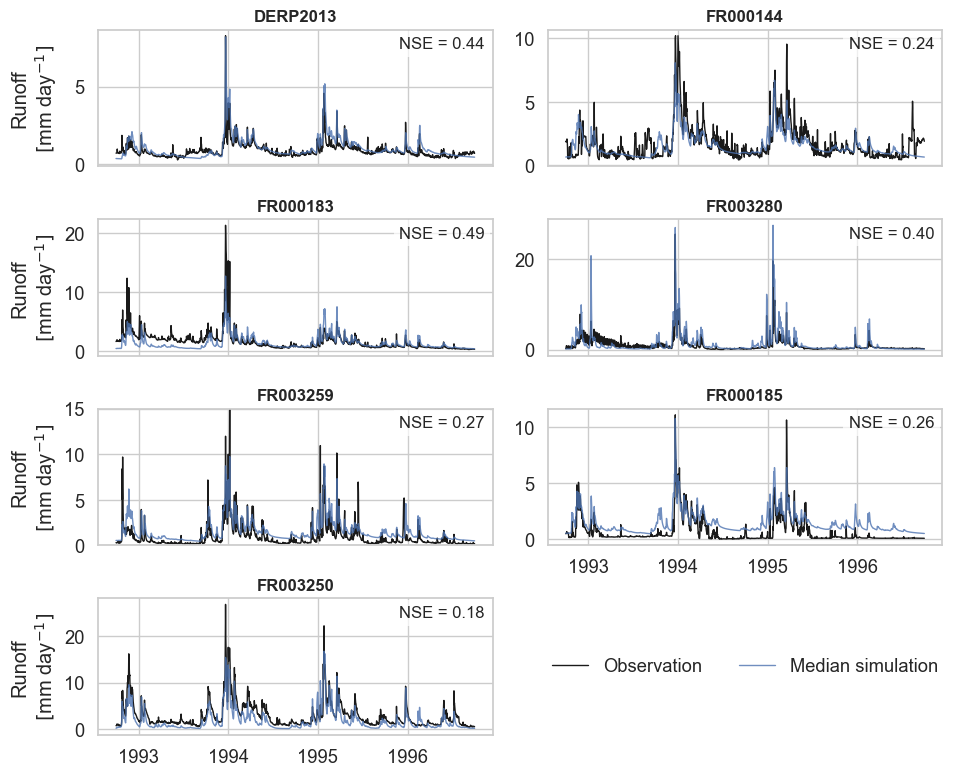

In [154]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["DERP2013", "FR000144", "FR000183", "FR003280", "FR003259", "FR000185","FR003250"]  # Your 6 gauge IDs
start_date = "1992-10-01"
end_date = "1996-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(10, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=12,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)
axes[4].set_ylim(0, 15)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Median simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

import matplotlib.dates as mdates

# Set x-axis ticks to years
for ax in axes[:-1]:  # Skip last subplot used for legend
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[5].tick_params(labelbottom=True)  # Force x-tick labels visible


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_badNSE.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [683]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp<0.5]

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,nse_rand,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,...,slope_c1comp,slope_g1comp,slope_nogeo,slope_rand,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo,qmean_rand
FR000144,-0.490350,-0.143821,-0.216190,-0.023114,-0.562057,0.703975,0.824836,0.748476,0.774954,0.666821,...,1.535819,1.542943,1.988824,2.121426,1.340293,1.027539,1.018507,1.004664,1.033569,1.015826
FR000185,0.547490,0.516848,0.474992,0.451513,0.556156,0.569667,0.785041,0.760701,0.744983,0.658125,...,NaN,NaN,NaN,NaN,0.785258,0.973510,0.970033,0.960799,0.985240,0.985363
FR003250,0.609019,0.531767,0.463189,0.373536,0.687758,0.683582,0.524372,0.551751,0.589937,0.619836,...,2.667029,2.817418,1.924019,1.861676,2.262666,1.942050,1.958156,1.911400,1.956049,1.940216
FR003280,0.178767,0.112961,0.137890,0.074027,0.187298,0.696390,0.541829,0.570091,0.551949,0.672216,...,2.620721,2.811188,1.898213,2.483329,1.337076,0.571009,0.581808,0.585669,0.576745,0.584688


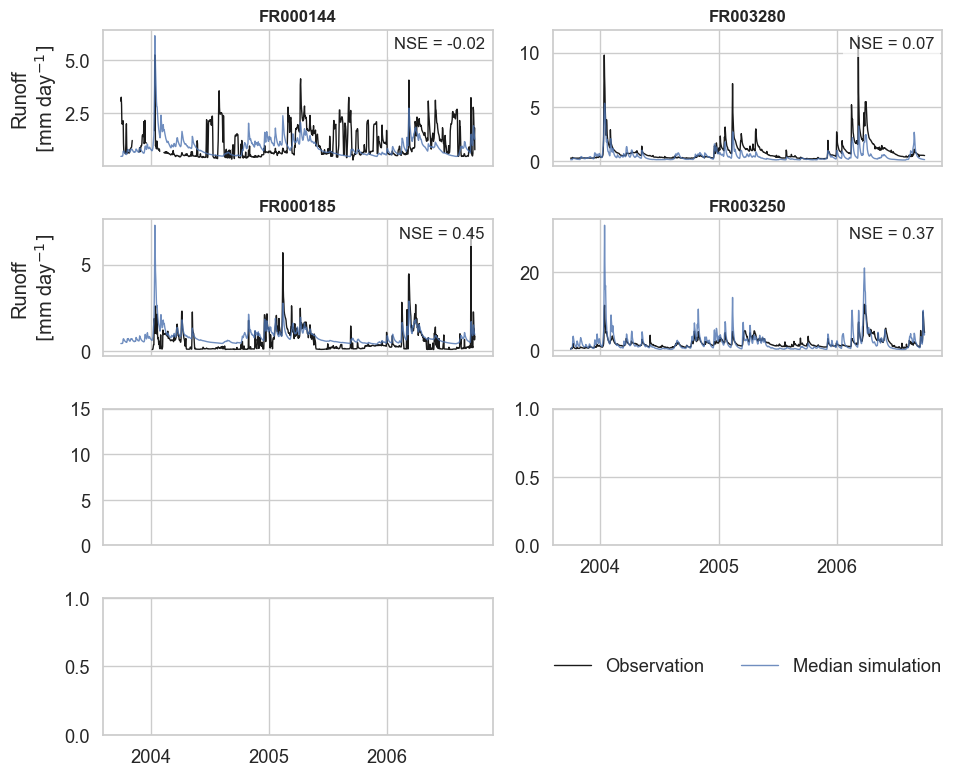

In [684]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["FR000144", "FR003280", "FR000185","FR003250"]  # Your 6 gauge IDs
start_date = "2003-10-01"
end_date = "2006-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(4, 2, figsize=(10, 8), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=1.0, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=1.0, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=12,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)
axes[4].set_ylim(0, 15)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
legend_ax = axes[-1]
legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Median simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)

import matplotlib.dates as mdates

# Set x-axis ticks to years
for ax in axes[:-1]:  # Skip last subplot used for legend
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

axes[5].tick_params(labelbottom=True)  # Force x-tick labels visible


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/figures/hydrographs_badNSE.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

In [89]:
# Moselle
# Base directory and group names
base_dir = Path("../results/sim_moselle/space-time")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

In [90]:
# Garonne
# Base directory and group names
base_dir = Path("../results/sim_garonne/space-time")
group_names = [f"Group_{i}" for i in range(1, 3)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean_garonne = combined.mean(dim="group")

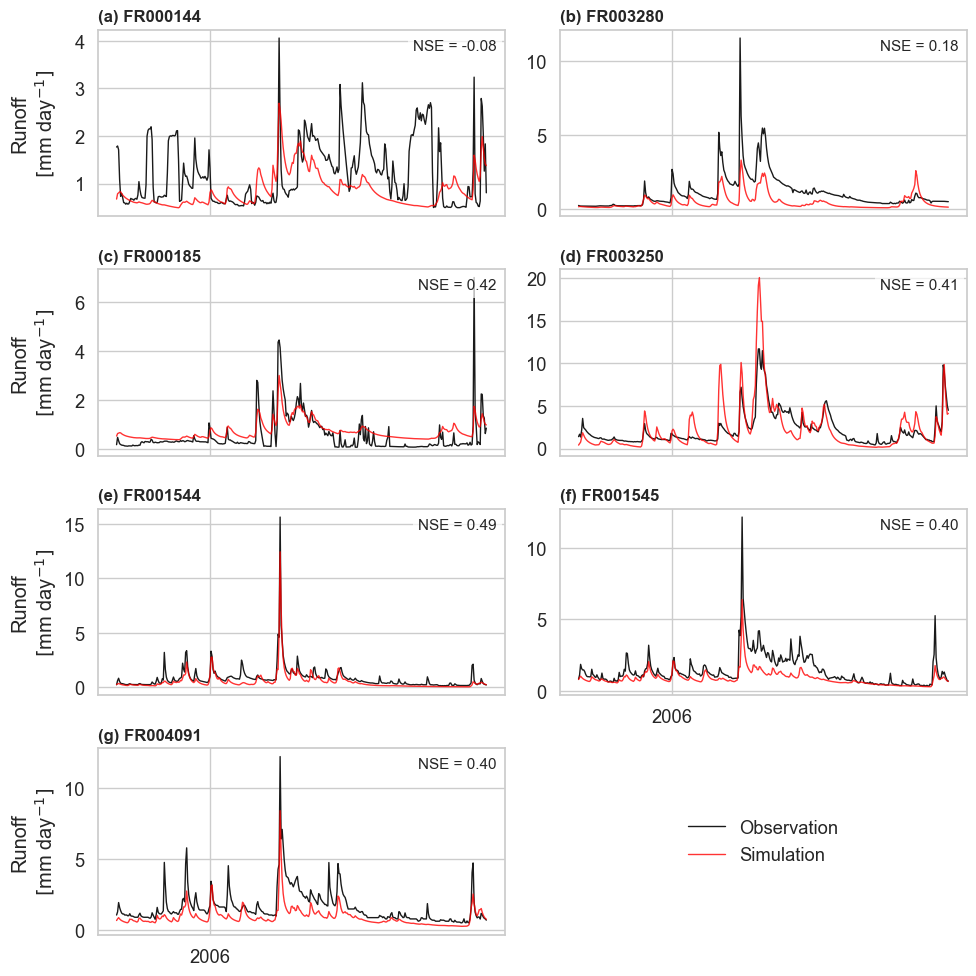

In [104]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# ------------------------------------------------------------
# PARAMETERS
# ------------------------------------------------------------

gauges_main = ["FR000144", "FR003280", "FR000185", "FR003250"]
gauges_garonne = ["FR001544", "FR001545", "FR004091"]

gauge_ids = gauges_main + gauges_garonne

start_date = "2005-10-01"
end_date   = "2006-09-30"

n_gauges = len(gauge_ids)
titles = ["a", "b", "c", "d", "e", "f", "g"]
# ------------------------------------------------------------
# CREATE SUBPLOTS (4 × 2 = 8 slots)
# ------------------------------------------------------------

fig, axes = plt.subplots(4, 2, figsize=(10, 10), sharex=True)
axes = axes.flatten()

# ------------------------------------------------------------
# PLOT HYDROGRAPHS
# ------------------------------------------------------------

for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]

    # Select correct dataset
    if gauge_id in gauges_main:
        ds_plot = ds_mean
        data_diff_val_complete_plot = data_diff_val_complete.copy()
        ts = ds_plot.sel(
            gauge_id=gauge_id,
            date=slice(start_date, end_date)
        )

        ax.plot(ts.date, ts["observation"], color="k", linewidth=1.0, label="Observation")
        ax.plot(ts.date, ts["regional"], color="red", linewidth=1.0, alpha=0.8, label="Simulation")

    else:
        ds_plot = ds_mean_garonne
        data_diff_val_complete_plot = data_diff_val_complete_garonne.copy()
        ts = ds_plot.sel(
            gauge_id=gauge_id,
            date=slice(start_date, end_date)
        )

        ax.plot(ts.date, ts["observation"], color="k", linewidth=1.0, label="Observation")
        ax.plot(ts.date, ts["regional"], color="red", linewidth=1.0, alpha=0.8, label="Simulation")




    title_complete = f"({titles[i]}) {gauge_id}"
    ax.set_title(title_complete, fontsize=12, fontweight="bold", loc="left")
    ax.grid(True)

    if i % 2 == 0:
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # NSE annotation
    nse = data_diff_val_complete_plot.loc[gauge_id, "nse_r1comp"]
    ax.text(
        0.98, 0.95, f"NSE = {nse:.2f}",
        transform=ax.transAxes,
        ha="right", va="top",
        fontsize=11,
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.7)
    )

# ------------------------------------------------------------
# X-AXIS FORMATTING
# ------------------------------------------------------------

for ax in axes[:n_gauges]:
    ax.xaxis.set_major_locator(mdates.YearLocator())
    ax.xaxis.set_major_formatter(mdates.DateFormatter("%Y"))

for ax in axes[-3:]:
    ax.tick_params(labelbottom=True)

# ------------------------------------------------------------
# LEGEND IN LAST PANEL
# ------------------------------------------------------------

legend_ax = axes[n_gauges]
legend_ax.axis("off")

handles, labels = axes[0].get_legend_handles_labels()
legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=1
)

# ------------------------------------------------------------
# TURN OFF UNUSED AXES
# ------------------------------------------------------------

for j in range(n_gauges + 1, len(axes)):
    axes[j].axis("off")

fig.align_ylabels(axes)
plt.tight_layout()

# ------------------------------------------------------------
# SAVE
# ------------------------------------------------------------

plt.savefig(
    "../results/figs/figures/hydrographs_badNSE_7catchments.png",
    dpi=300,
    bbox_inches="tight"
)

plt.show()


In [112]:
estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes = pd.read_csv("/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/data/estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.csv", index_col=0)

In [114]:
estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.columns[-20:]

Index(['perm_high_glob2', 'perm_medium_glob2', 'perm_low_glob2',
       'perm_high_cont2', 'perm_medium_cont2', 'perm_low_cont2',
       'lakes_depth_mean', 'lakes_depth_mean_norm', 'q_mean_yr', 'p_mean_yr',
       'norm_ups_cap', 'NSE', 'NSElstm', 'group', 'perm_high_regi',
       'perm_medium_regi', 'perm_low_regi', 'perm_high_rand',
       'perm_medium_rand', 'perm_low_rand'],
      dtype='object')

In [129]:
estreams_garonne_and_moselle_130_gauges_with_permeability_variants_and_lakes.loc[["FR003280", "FR003250", "FR000185"]]["perm_high_regi"]

basin_id
FR003280     0.0
FR003250     4.0
FR000185    75.0
Name: perm_high_regi, dtype: float64

In [121]:
data_diff_val_complete.loc["FR003250"]

nse_nogeo         0.619723
nse_g1comp        0.552076
nse_c1comp        0.485533
nse_r1comp        0.406970
nse_rand          0.703120
bfi_obs           0.686351
bfi_r1comp        0.524039
bfi_c1comp        0.551705
bfi_g1comp        0.591392
bfi_nogeo         0.624564
bfi_rand          0.675571
hfd_obs         157.083333
hfd_r1comp      136.000000
hfd_c1comp      137.750000
hfd_g1comp      138.833333
hfd_nogeo       144.083333
hfd_rand        147.250000
slope_obs         1.720128
slope_r1comp      2.958278
slope_c1comp      2.688192
slope_g1comp      2.762922
slope_nogeo       1.956120
slope_rand        1.737168
qmean_obs         2.122664
qmean_r1comp      1.885128
qmean_c1comp      1.890108
qmean_g1comp      1.848408
qmean_nogeo       1.894929
qmean_rand        1.912378
Name: FR003250, dtype: float64

In [126]:
data_diff_val_complete.loc["FR000185"]

nse_nogeo         0.527389
nse_g1comp        0.486416
nse_c1comp        0.420944
nse_r1comp        0.422526
nse_rand          0.534445
bfi_obs           0.570762
bfi_r1comp        0.781081
bfi_c1comp        0.769655
bfi_g1comp        0.741357
bfi_nogeo         0.661755
bfi_rand          0.660706
hfd_obs         141.888889
hfd_r1comp      147.111111
hfd_c1comp      146.222222
hfd_g1comp      143.777778
hfd_nogeo       138.333333
hfd_rand        138.111111
slope_obs              NaN
slope_r1comp           NaN
slope_c1comp           NaN
slope_g1comp           NaN
slope_nogeo            NaN
slope_rand             NaN
qmean_obs         0.774233
qmean_r1comp      0.984768
qmean_c1comp      0.983805
qmean_g1comp      0.976248
qmean_nogeo       0.994009
qmean_rand        0.999042
Name: FR000185, dtype: float64

#### Performance after 1994

In [155]:
# Parameters
gauge_ids = ["DERP2013", "FR000144", "FR000183", "FR003280", "FR003259", "FR000185", "FR003250"]
start_date = "1995-10-01"
end_date = "2015-09-30"

# Compute and print NSEE per gauge
for gauge_id in gauge_ids:
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))

    # Observations and regional simulation
    observations = ts["observation"].values
    simulation = ts["regional"].values

    # Compute NSEE
    nsee_value = compute_nse(observations, simulation)

    # Print result
    print(f"{gauge_id}: NSEE = {nsee_value:.3f}")

DERP2013: NSEE = 0.553
FR000144: NSEE = 0.104
FR000183: NSEE = 0.779
FR003280: NSEE = 0.458
FR003259: NSEE = 0.196
FR000185: NSEE = 0.336
FR003250: NSEE = 0.120


### Catchments with the highest performance

In [377]:
data_diff_val_complete[data_diff_val_complete.nse_r1comp>0.88][["nse_r1comp","nse_c1comp", "nse_g1comp", "nse_nogeo", "bfi_obs", "bfi_r1comp"]]

,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,bfi_obs,bfi_r1comp
LU000001,0.884523,0.881554,0.649280,0.818454,0.549832,0.541392
FR003249,0.892924,0.891078,0.884859,0.866954,0.581528,0.602991
FR000128,0.884267,0.880618,0.832449,0.826265,0.526895,0.551680
FR003241,0.886049,0.884207,0.866354,0.853902,0.575086,0.600708
FR003265,0.900366,0.899369,0.897081,0.891996,0.605153,0.632555
DEBU1957,0.889051,0.888017,0.889836,0.882486,0.607290,0.629697
FR003237,0.899046,0.896788,0.879130,0.867927,0.583372,0.596317
FR000140,0.884409,0.883873,0.872127,0.858613,0.570017,0.604185
DERP2003,0.890121,0.889400,0.851956,0.874557,0.560047,0.582378


In [69]:
data_diff_val_complete.loc[['DERP2011', 'DERP2013', 'DERP2027', 'FR000184', 'FR000201', 'FR003250']]

,nse_nogeo,nse_g1comp,nse_c1comp,nse_r1comp,bfi_obs,bfi_r1comp,bfi_c1comp,bfi_g1comp,bfi_nogeo,hfd_obs,...,slope_obs,slope_r1comp,slope_c1comp,slope_g1comp,slope_nogeo,qmean_obs,qmean_r1comp,qmean_c1comp,qmean_g1comp,qmean_nogeo
DERP2011,0.796410,0.830064,0.793363,0.818362,0.562614,0.622298,0.659665,0.595894,0.649066,129.92,...,2.012416,2.252475,2.073676,2.225895,2.063100,0.851127,0.977919,0.980737,0.980479,0.972921
DERP2013,-0.454676,0.336643,0.571146,0.500465,0.816544,0.807227,0.819108,0.771225,0.647853,160.76,...,0.958338,1.386901,1.301790,1.555445,2.118597,0.762804,0.819871,0.821231,0.823370,0.820557
DERP2027,0.761128,0.791102,0.760716,0.769759,0.578469,0.592599,0.661527,0.593280,0.653474,131.52,...,1.823202,2.647934,2.125812,2.336622,2.043438,1.150596,0.953463,0.954118,0.952190,0.944660
FR000184,0.335225,0.623459,0.587743,0.620917,0.764557,0.826784,0.827827,0.779276,0.644843,151.44,...,1.439657,1.205495,1.154815,1.451579,1.945676,1.346135,1.145649,1.141432,1.145384,1.147091
FR000201,0.727409,0.789981,0.774783,0.786002,0.436507,0.549143,0.586976,0.540289,0.655680,116.16,...,3.464184,2.706693,2.531908,2.779720,2.048432,0.849581,0.674314,0.678791,0.683550,0.673594
FR003250,0.392146,0.425633,0.280377,0.231655,0.685264,0.549293,0.564374,0.655188,0.633475,147.04,...,1.810170,2.935070,2.640790,2.458819,1.833348,2.390766,1.599011,1.582984,1.588207,1.562289


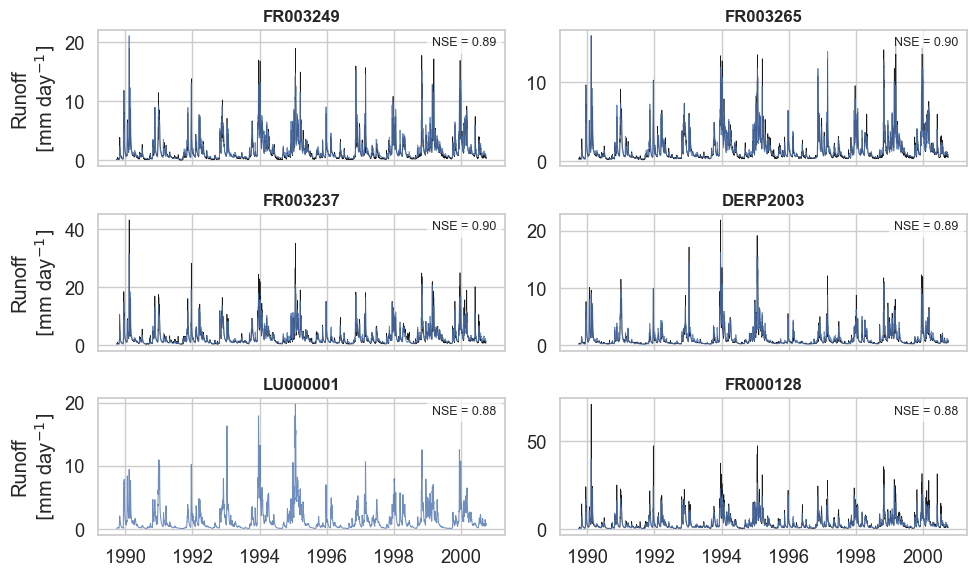

In [77]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["FR003249", "FR003265", "FR003237", "DERP2003", "LU000001", "FR000128"]  # Your 6 gauge IDs
start_date = "1989-10-01"
end_date = "2000-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(3, 2, figsize=(10, 6), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=0.5, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=0.75, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=9,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
#legend_ax = axes[-1]
#legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Mean simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_goodNSE.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

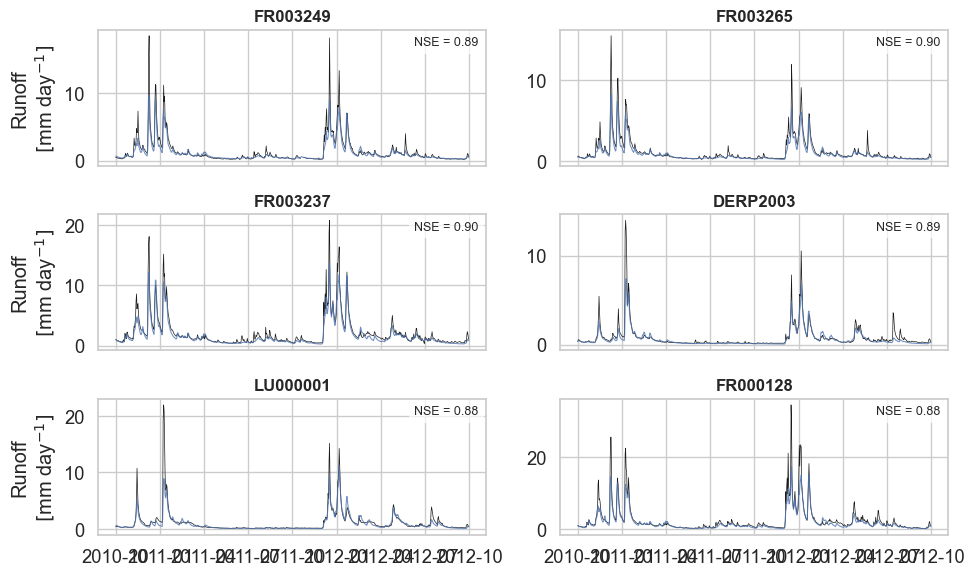

In [386]:
import matplotlib.pyplot as plt

# Define parameters
gauge_ids = ["FR003249", "FR003265", "FR003237", "DERP2003", "LU000001", "FR000128"]  # Your 6 gauge IDs
start_date = "2010-10-01"
end_date = "2012-09-30"

# Create subplots (2 columns × 3 rows)
fig, axes = plt.subplots(3, 2, figsize=(10, 6), sharex=True)
axes = axes.flatten()  # Flatten to easily loop

# Plot each hydrograph
for i, gauge_id in enumerate(gauge_ids):
    ax = axes[i]
    
    # Subset the dataset for this gauge and time range
    ts = ds_mean.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    # Plot observation and regional simulation
    ax.plot(ts.date, ts["observation"], label="Observation", linewidth=0.5, color="k")
    ax.plot(ts.date, ts["regional"], label="Regional", linewidth=0.75, alpha=0.8)
    
    ax.set_title(f"{gauge_id}", fontsize=12, fontweight="bold")
    #ax.set_ylim(0, 20)
    ax.grid(True)

    if i % 2 == 0:  # Left column
        ax.set_ylabel("Runoff\n$[$mm day$^{-1}]$")

    # Get NSE value (rounded for display)
    nse = data_diff_val_complete.loc[gauge_id, "nse_r1comp"]
    nse_label = f"NSE = {nse:.2f}"
    
    # Add NSE label inside the plot (top-right corner)
    ax.text(
        0.98, 0.95, nse_label,
        transform=ax.transAxes,
        ha='right', va='top',
        fontsize=9,
        bbox=dict(facecolor='white', edgecolor='none', alpha=0.7)
    )

    #if i == 5:
    #    ax.set_xticklabels(["1990", "1992", "1994", "1996", "1998", "2000"])



#axes[0].set_ylim(0, 10)
#axes[1].set_ylim(0, 10)


main_titles = [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", 
                r"$\mathbf{M_{\mathrm{reg}}}$"]

# Use last subplot for legend
#legend_ax = axes[-1]
#legend_ax.axis("off")

# Custom legend
handles, labels = axes[0].get_legend_handles_labels()
labels = ["Observation", r"Mean simulation"]

legend_ax.legend(
    handles, labels,
    loc="center",
    frameon=False,
    ncol=3
)


fig.align_ylabels(axes)

plt.tight_layout(rect=[0, 0, 1, 1])  # Leave space for legend


# Save including everything (colorbar + legend)
plt.savefig(
    "../results/figs/hydrographs_goodNSE_1year.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()

### Study area

In [ ]:
catchment_boundaries_moselle = catchment_boundaries.loc[network_estreams_gdf.index.tolist(), :]
world = gpd.read_file(r"/Users/nascimth/Documents/data/gis/world.shp")
lakes = gpd.read_file(r"file:///Users/nascimth/Documents/data/gis/paper_moselle_superflexpy/lakes_moselle.shp")

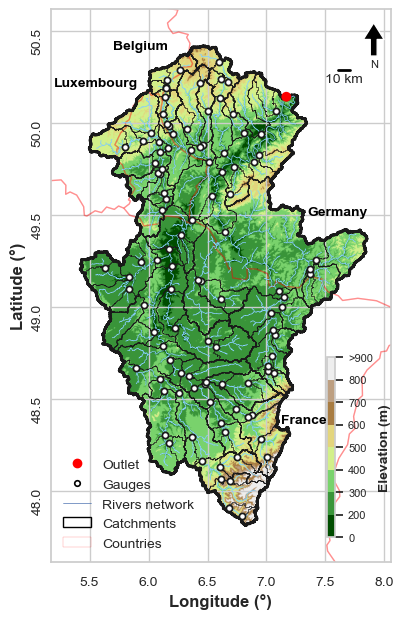

In [212]:
import matplotlib as mpl
from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap

# Define custom terrain colormap without blue
terrain_no_blue_colors = [
    (0.0,  "#004d00"),  # dark green
    (0.25, "#66cc66"),  # light green
    (0.5,  "#ffff99"),  # yellow
    (0.75, "#996633"),  # brown
    (1.0,  "#eeeeee")   # light gray/white
]

terrain_no_blue = LinearSegmentedColormap.from_list("terrain_no_blue", terrain_no_blue_colors)



# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(4, 6))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('white')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

world.plot(ax=ax, color='none', edgecolor='red', linewidth=1, alpha=0.25)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 200, 300, 400, 500, 600, 700, 800, 900]  # Define class boundaries
cmap = plt.get_cmap(terrain_no_blue)  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.8, 0.12, 0.02, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)

tick_labels = [str(b) for b in bounds[:-1]] + ['>900']
cbar.ax.set_yticklabels(tick_labels)

cbar.ax.tick_params(labelsize=8)  # Set the font size for the ticks
cbar.set_label('Elevation (m)', fontsize=10)  # Set the label with a smaller font size

# Adjust the colorbar size (shrink)
#cbar.ax.set_aspect('auto')

# Set the title and show the plot
#ax.set_title('C', loc = "left", fontsize=14, fontweight="bold")

# Plot the river
rivers_moselle.plot(ax=ax, linewidth=0.5, color="lightskyblue")

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax, facecolor='none', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2, label='Sub-catchments')
catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, label='Sub-catchments')


## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax, color='black', markersize=30, edgecolor='none', linewidth=0.5, 
#                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='white', markersize=20, edgecolor='k', linewidth=1.25, 
                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=50, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.25, x_max+0.2)
ax.set_ylim(y_min-0.2, y_max+0.2)


ax.set_xlabel("Longitude (°)", fontsize=12)
ax.set_ylabel("Latitude (°)", fontsize=12)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Catchments')
countries_patch = Patch(facecolor='none', edgecolor='red', lw=0.25, alpha = 0.5, label='Countries')

# For streamflow gauges (as black dots)
#streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch, countries_patch], 
                   loc='lower left', fontsize=10, title="", title_fontsize='8', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.95, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=8, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=10)

# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

# Adding some text
ax.text(5.7, 50.4, 'Belgium', fontsize=10, color='black', fontweight='bold')
ax.text(5.2, 50.2, 'Luxembourg', fontsize=10, color='black', fontweight='bold')
ax.text(7.35, 49.50, 'Germany', fontsize=10, color='black', fontweight='bold')
ax.text(7.12, 48.37, 'France', fontsize=10, color='black', fontweight='bold')

import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
#ax.set_aspect('equal')
ax.grid(True)
# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

# Save including everything (colorbar + legend)
plt.savefig(
    r"/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/results/figs/study_area.png",
    dpi=300,
    bbox_inches='tight'
)
# Show the plot
plt.show()

### Parameters plots

In [ ]:
#Moselle parameters loading
import re
import os
import glob

def is_valid_key(k):
    # Exclude keys that end in Group_X_2
    
    return not re.search(r'Group_\d+_2$', k)

def is_valid_key_2(k):
    # Include only keys that end in Group_X_2
    return re.search(r'Group_\d+_2$', k)

# Dictionary to store all parameter dicts
all_param_dicts = {}

# Loop through all CSVs in the current directory
for filepath in glob.glob("../results/groups/*moselle*comp*.csv"):
    file_key = os.path.splitext(os.path.basename(filepath))[0]  # Strip .csv
    
    param_dict = {}

    # Read file and parse lines
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith(","):  # Skip empty or malformed lines
                continue
            parts = line.split(",")
            if len(parts) == 2:
                key, value = parts
                try:
                    param_dict[key] = float(value)
                except ValueError:
                    pass  # Skip lines where value is not a float
            else:
                pass  # Skip malformed lines

    # Store the parsed dictionary
    all_param_dicts[file_key] = param_dict


regional_keys_2 = [k for k in all_param_dicts if "regi" in k and is_valid_key_2(k)]
continental_keys_2 = [k for k in all_param_dicts if "cont" in k and is_valid_key_2(k)]
global_keys_2 = [k for k in all_param_dicts if "glob" in k and is_valid_key_2(k)]


regional_keys_1 = [k for k in all_param_dicts if "regi" in k and is_valid_key(k)]
continental_keys_1 = [k for k in all_param_dicts if "cont" in k and is_valid_key(k)]
global_keys_1 = [k for k in all_param_dicts if "glob" in k and is_valid_key(k)]


#################### Regional parameters
dfs=[]
for key in regional_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_2 = pd.concat(dfs)

regional_params_2.high_snow_k = 1/regional_params_2.high_snow_k
regional_params_2.high_slow_k = 1/regional_params_2.high_slow_k
regional_params_2.high_fast_k = 1/regional_params_2.high_fast_k
regional_params_2.general_snow_k = 1/regional_params_2.general_snow_k
regional_params_2.general_slow_k = 1/regional_params_2.general_slow_k
regional_params_2.general_fast_k = 1/regional_params_2.general_fast_k
regional_params_2.low_snow_k = 1/regional_params_2.low_snow_k
regional_params_2.low_slow_k = 1/regional_params_2.low_slow_k
regional_params_2.low_fast_k = 1/regional_params_2.low_fast_k

dfs=[]
for key in regional_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_1 = pd.concat(dfs)

regional_params_1.high_snow_k = 1/regional_params_1.high_snow_k
regional_params_1.high_slow_k = 1/regional_params_1.high_slow_k
regional_params_1.high_fast_k = 1/regional_params_1.high_fast_k
regional_params_1.general_snow_k = 1/regional_params_1.general_snow_k
regional_params_1.general_slow_k = 1/regional_params_1.general_slow_k
regional_params_1.general_fast_k = 1/regional_params_1.general_fast_k
regional_params_1.low_snow_k = 1/regional_params_1.low_snow_k
regional_params_1.low_slow_k = 1/regional_params_1.low_slow_k
regional_params_1.low_fast_k = 1/regional_params_1.low_fast_k

#################### Continental parameters
dfs=[]
for key in continental_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_2 = pd.concat(dfs)
continental_params_2.high_snow_k = 1/continental_params_2.high_snow_k
continental_params_2.high_slow_k = 1/continental_params_2.high_slow_k
continental_params_2.high_fast_k = 1/continental_params_2.high_fast_k
continental_params_2.general_snow_k = 1/continental_params_2.general_snow_k
continental_params_2.general_slow_k = 1/continental_params_2.general_slow_k
continental_params_2.general_fast_k = 1/continental_params_2.general_fast_k
continental_params_2.low_snow_k = 1/continental_params_2.low_snow_k
continental_params_2.low_slow_k = 1/continental_params_2.low_slow_k
continental_params_2.low_fast_k = 1/continental_params_2.low_fast_k

dfs=[]
for key in continental_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_1 = pd.concat(dfs)
continental_params_1.high_snow_k = 1/continental_params_1.high_snow_k
continental_params_1.high_slow_k = 1/continental_params_1.high_slow_k
continental_params_1.high_fast_k = 1/continental_params_1.high_fast_k
continental_params_1.general_snow_k = 1/continental_params_1.general_snow_k
continental_params_1.general_slow_k = 1/continental_params_1.general_slow_k
continental_params_1.general_fast_k = 1/continental_params_1.general_fast_k
continental_params_1.low_snow_k = 1/continental_params_1.low_snow_k
continental_params_1.low_slow_k = 1/continental_params_1.low_slow_k
continental_params_1.low_fast_k = 1/continental_params_1.low_fast_k

#################### Global parameters
dfs=[]
for key in global_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_2 = pd.concat(dfs)
global_params_2.high_snow_k = 1/global_params_2.high_snow_k
global_params_2.high_slow_k = 1/global_params_2.high_slow_k
global_params_2.high_fast_k = 1/global_params_2.high_fast_k
global_params_2.general_snow_k = 1/global_params_2.general_snow_k
global_params_2.general_slow_k = 1/global_params_2.general_slow_k
global_params_2.general_fast_k = 1/global_params_2.general_fast_k
global_params_2.low_snow_k = 1/global_params_2.low_snow_k
global_params_2.low_slow_k = 1/global_params_2.low_slow_k
global_params_2.low_fast_k = 1/global_params_2.low_fast_k

dfs=[]
for key in global_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_1 = pd.concat(dfs)
global_params_1.high_snow_k = 1/global_params_1.high_snow_k
global_params_1.high_slow_k = 1/global_params_1.high_slow_k
global_params_1.high_fast_k = 1/global_params_1.high_fast_k
global_params_1.general_snow_k = 1/global_params_1.general_snow_k
global_params_1.general_slow_k = 1/global_params_1.general_slow_k
global_params_1.general_fast_k = 1/global_params_1.general_fast_k
global_params_1.low_snow_k = 1/global_params_1.low_snow_k
global_params_1.low_slow_k = 1/global_params_1.low_slow_k
global_params_1.low_fast_k = 1/global_params_1.low_fast_k


##### Concatenate all parameters
global_params = pd.concat([global_params_2], ignore_index=True)
continental_params = pd.concat([continental_params_2], ignore_index=True)
regional_params = pd.concat([regional_params_2], ignore_index=True)

#### Figure with log axis

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/2801019289.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

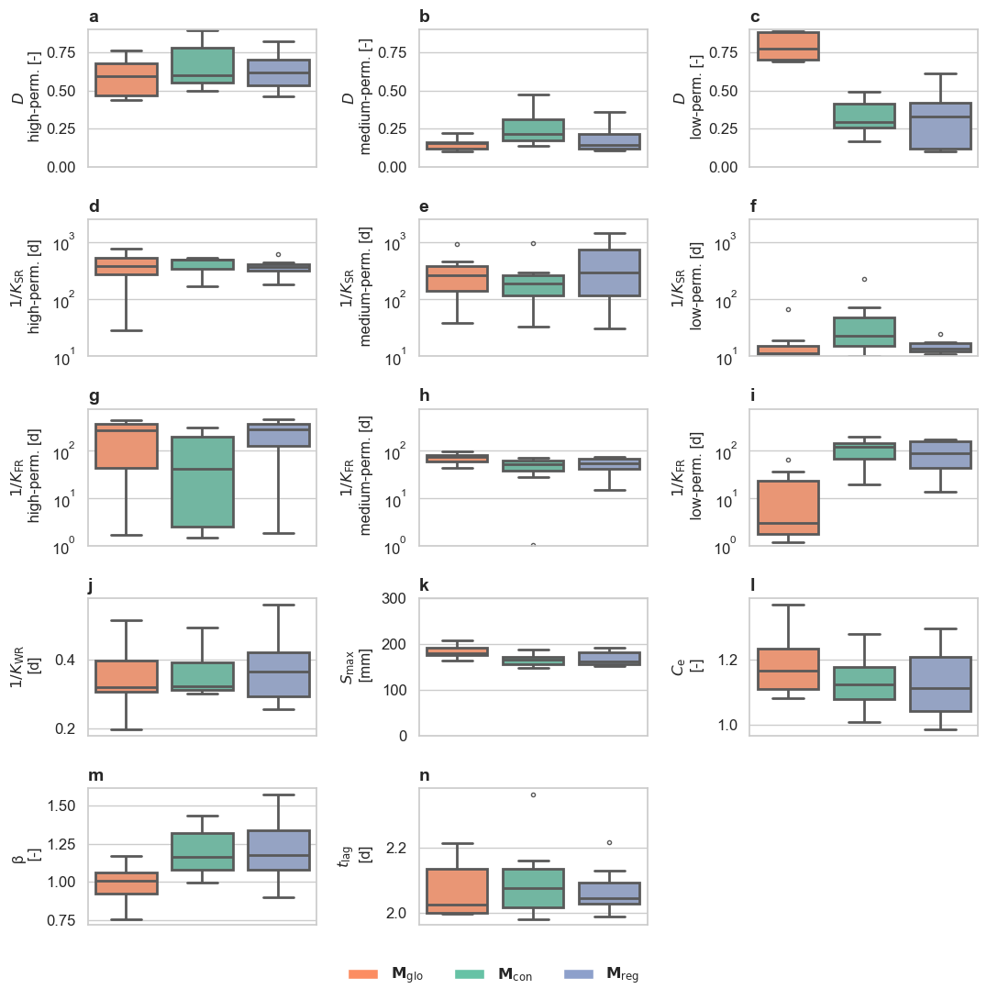

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['text.usetex'] = False


subplot_titles = list("abcdefghijklmnopqrstu")  # Enough for 26 variables


# Seaborn styling
sns.set_theme(style="whitegrid", font_scale=1.2)

# Prepare long-format data
def prepare_long_df(df, name):
    df_long = df.copy()
    df_long['source'] = name
    return df_long

regional_long = prepare_long_df(regional_params, 'Regional')
continental_long = prepare_long_df(continental_params, 'Continental')
global_long = prepare_long_df(global_params, 'Global')

all_long = pd.concat([global_long, continental_long, regional_long], axis=0)
all_long = all_long.melt(id_vars='source', var_name='variable', value_name='value')

# Colors for groups
palette = {
    'Regional': '#8da0cb',     # blue
    'Continental': '#66c2a5',  # green
    'Global': '#fc8d62'        # orange
}

# Variables to plot
variables = [

    'high_lowersplitter_splitpar', 
    'general_lowersplitter_splitpar',
    'low_lowersplitter_splitpar',

    'high_slow_k',
    'general_slow_k',
    'low_slow_k',
    
    'high_fast_k', 
    'general_fast_k',
    'low_fast_k',

    'high_snow_k', 
    'high_unsaturated_Smax', 
    'high_unsaturated_Ce',
    'high_unsaturated_beta', 
    'high_lag-fun_lag-time',
    ]


# Pretty labels for y-axes
pretty_labels = {

    'general_lowersplitter_splitpar': r'$\mathit{D}$' + '\n medium-perm. [-]',
    'high_lowersplitter_splitpar': r'$\mathit{D}$' + '\n high-perm. [-]',#
    'low_lowersplitter_splitpar': r'$\mathit{D}$' + '\n low-perm. [-]',#
    'high_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n high-perm. [d]',
    'high_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n high-perm. [d]',#
    'general_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n medium-perm. [d]',#
    'general_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n medium-perm. [d]',#
    'low_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n low-perm. [d]',#
    'low_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n low-perm. [d]',#

    'high_snow_k': r'$1/\mathit{K}_{\mathrm{WR}}$' + '\n [d]',#
    'high_unsaturated_Smax': r'$\mathit{S}_{\mathrm{max}}$' + '\n [mm]',
    'high_unsaturated_Ce': r'$\mathit{C}_{\mathrm{e}}$' + '\n [-]',#
    'high_unsaturated_beta': 'β \n [-]',#
    'high_lag-fun_lag-time': r'$\mathit{t}_{\mathrm{lag}}$' + '\n [d]',#


}

# Layout
ncols = 3
nrows = int(np.ceil(len(variables) / ncols))
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(11, 11), sharey=False)
axes = axes.flatten()

# Plot
for i, var in enumerate(variables):
    ax = axes[i]
    sns.boxplot(
        data=all_long[all_long['variable'] == var],
        x='source', y='value',
        palette=palette,
        linewidth=2.0,
        fliersize=3,
        ax=ax
    )
    ax.set_title(subplot_titles[i], fontsize=14, weight='bold', loc="left")  # "A", "B", ...
    ax.set_xlabel('')
    ax.set_ylabel(pretty_labels.get(var, var), fontsize=12)
    ax.set_xticks([])  # remove x-axis group labels
    ax.tick_params(labelsize=12)

# Hide unused axes
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Custom legend
legend_elements = [
    Patch(facecolor=palette['Global'], label=r"$\mathbf{M_{\mathrm{glo}}}$"),
    Patch(facecolor=palette['Continental'], label=r"$\mathbf{M_{\mathrm{con}}}$"),
    Patch(facecolor=palette["Regional"], label=r"$\mathbf{M_{\mathrm{reg}}}$"),
]

axes[0].set_ylim(0, 0.9)  
axes[1].set_ylim(0, 0.9)  
axes[2].set_ylim(0, 0.9)  

axes[3].set_ylim(10, 2500)  
axes[4].set_ylim(10, 2500)  
axes[5].set_ylim(10, 2500)

axes[6].set_ylim(1, 750)  
axes[7].set_ylim(1, 750)  
axes[8].set_ylim(1, 750)  
axes[10].set_ylim(0, 300)  


axes[3].set_yscale('log')
axes[4].set_yscale('log')
axes[5].set_yscale('log')

axes[6].set_yscale('log')
axes[7].set_yscale('log')
axes[8].set_yscale('log')

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

# Align all y-axis labels
for ax in axes:
    ax.yaxis.set_label_coords(-0.2, 0.5)  # adjust -0.15 as needed

#axes[8].set_ylim(-10, 200)
plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.savefig("../results/figs/figures/figSXX_paramsMoselle.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

In [68]:
#Garonne parameters loading
import re
import os
import glob

def is_valid_key(k):
    # Exclude keys that end in Group_X_2
    
    return not re.search(r'Group_\d+_2$', k)

def is_valid_key_2(k):
    # Include only keys that end in Group_X_2
    return re.search(r'Group_\d+_2$', k)

# Dictionary to store all parameter dicts
all_param_dicts = {}

# Loop through all CSVs in the current directory
for filepath in glob.glob("../results/groups/*garonne*comp*.csv"):
    file_key = os.path.splitext(os.path.basename(filepath))[0]  # Strip .csv
    
    param_dict = {}

    # Read file and parse lines
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            if not line or line.startswith(","):  # Skip empty or malformed lines
                continue
            parts = line.split(",")
            if len(parts) == 2:
                key, value = parts
                try:
                    param_dict[key] = float(value)
                except ValueError:
                    pass  # Skip lines where value is not a float
            else:
                pass  # Skip malformed lines

    # Store the parsed dictionary
    all_param_dicts[file_key] = param_dict


regional_keys_2 = [k for k in all_param_dicts if "regi" in k and is_valid_key_2(k)]
continental_keys_2 = [k for k in all_param_dicts if "cont" in k and is_valid_key_2(k)]
global_keys_2 = [k for k in all_param_dicts if "glob" in k and is_valid_key_2(k)]


regional_keys_1 = [k for k in all_param_dicts if "regi" in k and is_valid_key(k)]
continental_keys_1 = [k for k in all_param_dicts if "cont" in k and is_valid_key(k)]
global_keys_1 = [k for k in all_param_dicts if "glob" in k and is_valid_key(k)]


#################### Regional parameters
dfs=[]
for key in regional_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_2 = pd.concat(dfs)

regional_params_2.high_snow_k = 1/regional_params_2.high_snow_k
regional_params_2.high_slow_k = 1/regional_params_2.high_slow_k
regional_params_2.high_fast_k = 1/regional_params_2.high_fast_k
regional_params_2.general_snow_k = 1/regional_params_2.general_snow_k
regional_params_2.general_slow_k = 1/regional_params_2.general_slow_k
regional_params_2.general_fast_k = 1/regional_params_2.general_fast_k
regional_params_2.low_snow_k = 1/regional_params_2.low_snow_k
regional_params_2.low_slow_k = 1/regional_params_2.low_slow_k
regional_params_2.low_fast_k = 1/regional_params_2.low_fast_k

dfs=[]
for key in regional_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

regional_params_1 = pd.concat(dfs)

regional_params_1.high_snow_k = 1/regional_params_1.high_snow_k
regional_params_1.high_slow_k = 1/regional_params_1.high_slow_k
regional_params_1.high_fast_k = 1/regional_params_1.high_fast_k
regional_params_1.general_snow_k = 1/regional_params_1.general_snow_k
regional_params_1.general_slow_k = 1/regional_params_1.general_slow_k
regional_params_1.general_fast_k = 1/regional_params_1.general_fast_k
regional_params_1.low_snow_k = 1/regional_params_1.low_snow_k
regional_params_1.low_slow_k = 1/regional_params_1.low_slow_k
regional_params_1.low_fast_k = 1/regional_params_1.low_fast_k

#################### Continental parameters
dfs=[]
for key in continental_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_2 = pd.concat(dfs)
continental_params_2.high_snow_k = 1/continental_params_2.high_snow_k
continental_params_2.high_slow_k = 1/continental_params_2.high_slow_k
continental_params_2.high_fast_k = 1/continental_params_2.high_fast_k
continental_params_2.general_snow_k = 1/continental_params_2.general_snow_k
continental_params_2.general_slow_k = 1/continental_params_2.general_slow_k
continental_params_2.general_fast_k = 1/continental_params_2.general_fast_k
continental_params_2.low_snow_k = 1/continental_params_2.low_snow_k
continental_params_2.low_slow_k = 1/continental_params_2.low_slow_k
continental_params_2.low_fast_k = 1/continental_params_2.low_fast_k

dfs=[]
for key in continental_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

continental_params_1 = pd.concat(dfs)
continental_params_1.high_snow_k = 1/continental_params_1.high_snow_k
continental_params_1.high_slow_k = 1/continental_params_1.high_slow_k
continental_params_1.high_fast_k = 1/continental_params_1.high_fast_k
continental_params_1.general_snow_k = 1/continental_params_1.general_snow_k
continental_params_1.general_slow_k = 1/continental_params_1.general_slow_k
continental_params_1.general_fast_k = 1/continental_params_1.general_fast_k
continental_params_1.low_snow_k = 1/continental_params_1.low_snow_k
continental_params_1.low_slow_k = 1/continental_params_1.low_slow_k
continental_params_1.low_fast_k = 1/continental_params_1.low_fast_k

#################### Global parameters
dfs=[]
for key in global_keys_2:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_2 = pd.concat(dfs)
global_params_2.high_snow_k = 1/global_params_2.high_snow_k
global_params_2.high_slow_k = 1/global_params_2.high_slow_k
global_params_2.high_fast_k = 1/global_params_2.high_fast_k
global_params_2.general_snow_k = 1/global_params_2.general_snow_k
global_params_2.general_slow_k = 1/global_params_2.general_slow_k
global_params_2.general_fast_k = 1/global_params_2.general_fast_k
global_params_2.low_snow_k = 1/global_params_2.low_snow_k
global_params_2.low_slow_k = 1/global_params_2.low_slow_k
global_params_2.low_fast_k = 1/global_params_2.low_fast_k

dfs=[]
for key in global_keys_1:
    df = pd.DataFrame.from_dict(all_param_dicts[key], orient="index").T
    dfs.append(df)

global_params_1 = pd.concat(dfs)
global_params_1.high_snow_k = 1/global_params_1.high_snow_k
global_params_1.high_slow_k = 1/global_params_1.high_slow_k
global_params_1.high_fast_k = 1/global_params_1.high_fast_k
global_params_1.general_snow_k = 1/global_params_1.general_snow_k
global_params_1.general_slow_k = 1/global_params_1.general_slow_k
global_params_1.general_fast_k = 1/global_params_1.general_fast_k
global_params_1.low_snow_k = 1/global_params_1.low_snow_k
global_params_1.low_slow_k = 1/global_params_1.low_slow_k
global_params_1.low_fast_k = 1/global_params_1.low_fast_k


##### Concatenate all parameters
global_params = pd.concat([global_params_2], ignore_index=True)
continental_params = pd.concat([continental_params_2], ignore_index=True)
regional_params = pd.concat([regional_params_2], ignore_index=True)

In [75]:
estreams_attributes.loc[["DEBU1959", "FR001604"], "sno_cov_mean"]

basin_id
DEBU1959    3.656
FR001604    5.958
Name: sno_cov_mean, dtype: float64

In [79]:
network_estreams_garonne_22_gauges[["sno_cov_mean", "frac_snow"]].describe()

,sno_cov_mean,frac_snow
count,22.000000,22.000000
mean,3.139591,0.030682
std,3.337688,0.027010
min,0.327000,0.006000
25%,0.425500,0.009250
50%,1.148000,0.023500
75%,6.317250,0.047750
max,8.588000,0.118000


In [80]:
network_estreams_moselle_108_gauges[["sno_cov_mean", "frac_snow"]].describe()

,sno_cov_mean,frac_snow
count,108.000000,108.000000
mean,4.808231,0.046176
std,2.028694,0.016035
min,2.060000,0.026000
25%,3.185000,0.034000
50%,4.359500,0.042000
75%,6.105250,0.058000
max,11.555000,0.095000


In [ ]:
estreams_attributes.loc[["DEBU1959", "FR001604"], "sno_cov_mean"]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/3811771684.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/3811771684.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/3811771684.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_58696/3811771684.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated a

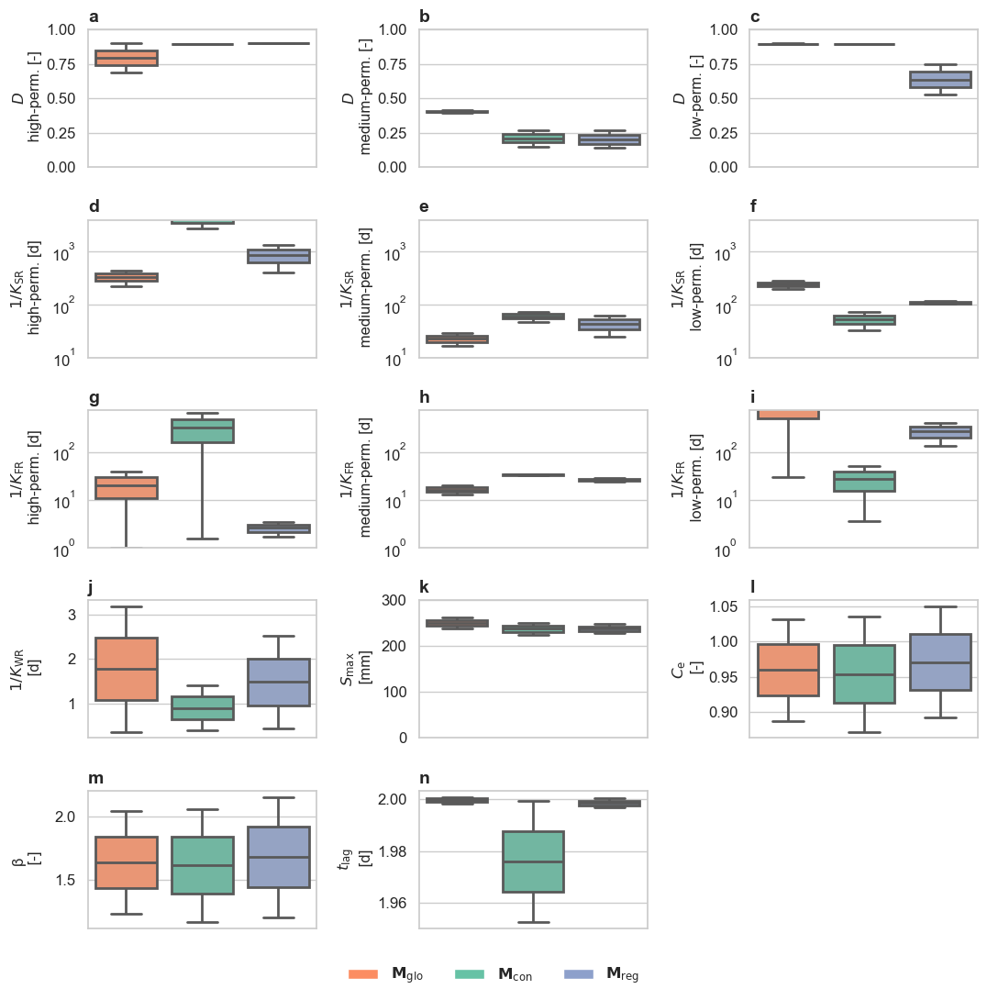

In [72]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.patches import Patch
import matplotlib as mpl
mpl.rcParams['text.usetex'] = False


subplot_titles = list("abcdefghijklmnopqrstu")  # Enough for 26 variables


# Seaborn styling
sns.set_theme(style="whitegrid", font_scale=1.2)

# Prepare long-format data
def prepare_long_df(df, name):
    df_long = df.copy()
    df_long['source'] = name
    return df_long

regional_long = prepare_long_df(regional_params, 'Regional')
continental_long = prepare_long_df(continental_params, 'Continental')
global_long = prepare_long_df(global_params, 'Global')

all_long = pd.concat([global_long, continental_long, regional_long], axis=0)
all_long = all_long.melt(id_vars='source', var_name='variable', value_name='value')

# Colors for groups
palette = {
    'Regional': '#8da0cb',     # blue
    'Continental': '#66c2a5',  # green
    'Global': '#fc8d62'        # orange
}

# Variables to plot
variables = [

    'high_lowersplitter_splitpar', 
    'general_lowersplitter_splitpar',
    'low_lowersplitter_splitpar',

    'high_slow_k',
    'general_slow_k',
    'low_slow_k',
    
    'high_fast_k', 
    'general_fast_k',
    'low_fast_k',

    'high_snow_k', 
    'high_unsaturated_Smax', 
    'high_unsaturated_Ce',
    'high_unsaturated_beta', 
    'high_lag-fun_lag-time',
    ]


# Pretty labels for y-axes
pretty_labels = {

    'general_lowersplitter_splitpar': r'$\mathit{D}$' + '\n medium-perm. [-]',
    'high_lowersplitter_splitpar': r'$\mathit{D}$' + '\n high-perm. [-]',#
    'low_lowersplitter_splitpar': r'$\mathit{D}$' + '\n low-perm. [-]',#
    'high_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n high-perm. [d]',
    'high_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n high-perm. [d]',#
    'general_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n medium-perm. [d]',#
    'general_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n medium-perm. [d]',#
    'low_slow_k': r'$1/\mathit{K}_{\mathrm{SR}}$' + '\n low-perm. [d]',#
    'low_fast_k': r'$1/\mathit{K}_{\mathrm{FR}}$' + '\n low-perm. [d]',#

    'high_snow_k': r'$1/\mathit{K}_{\mathrm{WR}}$' + '\n [d]',#
    'high_unsaturated_Smax': r'$\mathit{S}_{\mathrm{max}}$' + '\n [mm]',
    'high_unsaturated_Ce': r'$\mathit{C}_{\mathrm{e}}$' + '\n [-]',#
    'high_unsaturated_beta': 'β \n [-]',#
    'high_lag-fun_lag-time': r'$\mathit{t}_{\mathrm{lag}}$' + '\n [d]',#


}

# Layout
ncols = 3
nrows = int(np.ceil(len(variables) / ncols))
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(11, 11), sharey=False)
axes = axes.flatten()

# Plot
for i, var in enumerate(variables):
    ax = axes[i]
    sns.boxplot(
        data=all_long[all_long['variable'] == var],
        x='source', y='value',
        palette=palette,
        linewidth=2.0,
        fliersize=3,
        ax=ax
    )
    ax.set_title(subplot_titles[i], fontsize=14, weight='bold', loc="left")  # "A", "B", ...
    ax.set_xlabel('')
    ax.set_ylabel(pretty_labels.get(var, var), fontsize=12)
    ax.set_xticks([])  # remove x-axis group labels
    ax.tick_params(labelsize=12)

# Hide unused axes
for j in range(len(variables), len(axes)):
    fig.delaxes(axes[j])

# Custom legend
legend_elements = [
    Patch(facecolor=palette['Global'], label=r"$\mathbf{M_{\mathrm{glo}}}$"),
    Patch(facecolor=palette['Continental'], label=r"$\mathbf{M_{\mathrm{con}}}$"),
    Patch(facecolor=palette["Regional"], label=r"$\mathbf{M_{\mathrm{reg}}}$"),
]

axes[0].set_ylim(0, 1)  
axes[1].set_ylim(0, 1)  
axes[2].set_ylim(0, 1)  

axes[3].set_ylim(10, 4000)  
axes[4].set_ylim(10, 4000)  
axes[5].set_ylim(10, 4000)

axes[6].set_ylim(1, 750)  
axes[7].set_ylim(1, 750)  
axes[8].set_ylim(1, 750)  
axes[10].set_ylim(0, 300)  


axes[3].set_yscale('log')
axes[4].set_yscale('log')
axes[5].set_yscale('log')

axes[6].set_yscale('log')
axes[7].set_yscale('log')
axes[8].set_yscale('log')

fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol=3,
    fontsize=12,
    frameon=False
)

# Align all y-axis labels
for ax in axes:
    ax.yaxis.set_label_coords(-0.2, 0.5)  # adjust -0.15 as needed

#axes[8].set_ylim(-10, 200)
plt.tight_layout(rect=[0, 0.05, 1, 1]) 
plt.savefig("../results/figs/figures/figSXX_paramsGaronne.png", dpi=300)  # You can change the filename or format (e.g., .pdf, .svg)

plt.show()

### Supporting information

#### Figure S1

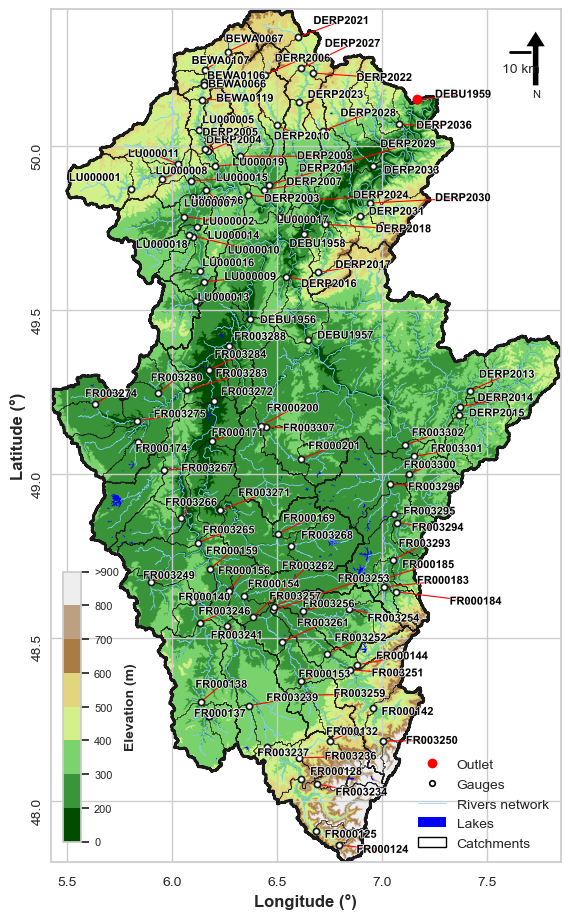

In [415]:
import matplotlib as mpl
from matplotlib.colors import BoundaryNorm
from matplotlib.colors import LinearSegmentedColormap
import adjustText
from adjustText import adjust_text
# Define custom terrain colormap without blue
terrain_no_blue_colors = [
    (0.0,  "#004d00"),  # dark green
    (0.25, "#66cc66"),  # light green
    (0.5,  "#ffff99"),  # yellow
    (0.75, "#996633"),  # brown
    (1.0,  "#eeeeee")   # light gray/white
]

terrain_no_blue = LinearSegmentedColormap.from_list("terrain_no_blue", terrain_no_blue_colors)



# Create the figure with two main columns: one for the first figure, one for the second figure (which will have 3 subplots)
fig, ax = plt.subplots(figsize=(9, 9))


data_df = estreams_attributes_dfs["DEBU1959"]
# Load the world shapefile dataset provided by GeoPandas

# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 12           # Change the font size
mpl.rcParams['font.weight'] = 'normal'   # Change font weight
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight


# Clear the subplot
ax.clear()

# Set the background color to white
ax.set_facecolor('white')

# Set plot limits to the bounding box of the selected study areas
bounds = moselle.total_bounds
x_min, y_min, x_max, y_max = bounds[0], bounds[1], bounds[2], bounds[3]

# Create a mask that covers the entire plotting area
plot_extent = box(x_min - 1, y_min - 1, x_max + 1, y_max + 1)
mask = gpd.GeoDataFrame({'geometry': [plot_extent]}, crs='EPSG:4326')

# Combine the selected geometries into one
combined_geometry = moselle.unary_union

# Create the mask by subtracting the combined geometry from the plot extent
mask['geometry'] = mask.difference(combined_geometry)

#world.plot(ax=ax, color='none', edgecolor='red', linewidth=1, alpha=0.25)

# Calculate the extent
left, bottom = transform * (0, 0)
right, top = transform * (elevation_wgs.shape[1], elevation_wgs.shape[0])
extent = (left, right, top, bottom)  # Notice the order for top and bottom

# Define the color classes (discrete intervals)
bounds = [0, 200, 300, 400, 500, 600, 700, 800, 900]  # Define class boundaries
cmap = plt.get_cmap(terrain_no_blue)  # Choose a colormap
norm = BoundaryNorm(bounds, cmap.N)  # Normalize based on the class boundaries

# Plot the elevation data with class intervals
cax = ax.imshow(elevation_wgs, cmap=cmap, norm=norm, extent=extent)

# Add colorbar with class labels
#cbar = fig.colorbar(cax, ticks=bounds)
#cbar.set_label('Elevation (m)')
# Create a small colorbar inside the plot
cbar_ax = fig.add_axes([0.23, 0.075, 0.02, 0.3])  # [left, bottom, width, height]
cbar = fig.colorbar(cax, cax=cbar_ax, orientation='vertical', ticks=bounds)

tick_labels = [str(b) for b in bounds[:-1]] + ['>900']
cbar.ax.set_yticklabels(tick_labels)

cbar.ax.tick_params(labelsize=8)  # Set the font size for the ticks
cbar.set_label('Elevation (m)', fontsize=10)  # Set the label with a smaller font size

# Adjust the colorbar size (shrink)
#cbar.ax.set_aspect('auto')

# Set the title and show the plot
#ax.set_title('C', loc = "left", fontsize=14, fontweight="bold")

# Plot the river
rivers_moselle.plot(ax=ax, linewidth=0.5, color="lightskyblue")

# Plot the mask to cover everything outside the study area
#mask.plot(ax=ax, facecolor='none', edgecolor='darkred', linewidth=0.8)

# Overlay the study area boundaries
FR_selected_gdf.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=1, label='Sub-catchments')

moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=2, label='Sub-catchments')
catchment_boundaries_moselle.plot(ax=ax, facecolor='none', edgecolor='k', linewidth=0.5, label='Sub-catchments')
lakes.plot(ax=ax, facecolor='blue', edgecolor='none', linewidth=1, label='Lakes and reservoirs')

## Plot the points from network_estreams_filtered
#network_estreams_gdf.plot(ax=ax, color='black', markersize=30, edgecolor='none', linewidth=0.5, 
#                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.plot(ax=ax, color='white', markersize=20, edgecolor='k', linewidth=1.25, 
                          label='Streamflow gauges', zorder=1000)

# Plot the points from network_estreams_filtered
network_estreams_gdf.loc[["DEBU1959"]].plot(ax=ax, color='red', markersize=50, edgecolor='none', linewidth=0.5, 
                          label='Outlet', zorder=1000)

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min-0.25, x_max+0.2)
ax.set_ylim(y_min-0.2, y_max+0.2)


ax.set_xlabel("Longitude (°)", fontsize=12)
ax.set_ylabel("Latitude (°)", fontsize=12)

# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', label='Catchments')

#countries_patch = Patch(facecolor='none', edgecolor='red', lw=0.25, alpha = 0.5, label='Countries')

# For streamflow gauges (as black dots)
#streamflow_marker = Line2D([0], [0], color='black', lw=0, marker='o', markersize=4, label='Gauges')
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network')

## Add the legend with all items
#legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, subcatchment_patch, countries_patch], 
#                   loc='lower left', fontsize=10, title="", title_fontsize='8', frameon=False)

# Add a north arrow
x, y, arrow_length = 0.95, 0.975, 0.075
ax.annotate('N', xy=(x, y), xytext=(x, y-arrow_length), arrowprops=dict(facecolor='black', width=5, headwidth=15), ha='center', va='center', fontsize=8, xycoords=ax.transAxes)

# Add a scale bar 
scalebar_length = 10  # in kilometers
x_scalebar = x_max - (x_max - x_min) * 0.1
y_scalebar = y_min + (y_max - y_min) * 0.95
ax.plot([x_scalebar, x_scalebar + scalebar_length/100], [y_scalebar, y_scalebar], color='black', linewidth=2)
ax.text(x_scalebar + (scalebar_length/200), y_scalebar - (y_max - y_min) * 0.02, f'{scalebar_length} km', ha='center', va='center', fontsize=10)

# Rotate the existing y-tick labels without changing them
ax.set_yticklabels(ax.get_yticklabels(), rotation=90, ha='center', fontsize=10)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=10)

# Add labels for selected basin_ids
label_df = network_estreams_gdf.index.tolist()

# Set plot limits to the bounding box of the study area
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

import matplotlib.patheffects as pe

texts = []
points_x, points_y = [], []  # store the reference points

for basin in label_df:
    x = network_estreams_gdf.loc[basin, 'lon']
    y = network_estreams_gdf.loc[basin, 'lat']
    t = ax.text(
        x, y, basin,
        fontsize=8, ha='left', va='bottom',
        color='black', zorder=20000, fontweight="bold"
    )
    # Add white outline
    t.set_path_effects([
        pe.withStroke(linewidth=1, foreground="white")
    ])
    texts.append(t)
    points_x.append(x)
    points_y.append(y)

# Adjust with leader lines
adjust_text(
    texts, 
    x=points_x, y=points_y,  # anchor texts to their points
    ax=ax,
    expand_text=(0.1, 0.1),
    arrowprops=dict(arrowstyle="-", color="red", lw=0.8, zorder=19999))

import matplotlib.ticker as ticker
ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
ax.yaxis.set_major_formatter(ticker.FormatStrFormatter('%.1f'))
#ax.set_aspect('equal')
ax.grid(True)


# Create manual legend entries:
# For sub-catchments (as a polygon with a black boundary)
subcatchment_patch = Patch(facecolor='none', edgecolor='black', linewidth=1, label='Catchments')
lakes_patch = Patch(facecolor='blue', edgecolor='none', linewidth=1, label='Lakes')


# For streamflow gauges (as black dots)
streamflow_marker = Line2D(
    [0], [0],
    color='none',                # No line connecting markers
    marker='o',                  # Circle marker
    markersize=4,                # Size in points
    markerfacecolor='white',     # Fill color inside the circle
    markeredgecolor='black',     # Color of the circle's edge
    markeredgewidth=1.2,         # Width of the edge
    label='Gauges'
)

# For outlet gauges (as black dots)
outlet_marker = Line2D([0], [0], color='red', lw=0, marker='o', markersize=6, label='Outlet')

# For another line (representing rivers)
river_line = Line2D([0], [0], lw=0.5, label='Rivers network', color='lightskyblue')

# Add the legend with all items
legend = ax.legend(handles=[outlet_marker, streamflow_marker, river_line, lakes_patch, subcatchment_patch], 
                   loc='lower right', fontsize=10, title="", title_fontsize='8', frameon=False)



# Adjust the layout to remove extra space
plt.tight_layout(pad=0)

# Save including everything (colorbar + legend)
plt.savefig(
    r"/Users/nascimth/Library/CloudStorage/OneDrive-Eawag/Eawag/Papers/Moselle_superflexpy/GitHub/estreams_superflexpy/results/figs/appendix_study)area.png",
    dpi=300,
    bbox_inches='tight'
)

# Show the plot
plt.show()

#### Correlations

In [86]:
estreams_attributes_clipped_filters["nse_r1comp"] = data_diff_val_complete["nse_r1comp"]
estreams_attributes_clipped_filters["nse_c1comp"] = data_diff_val_complete["nse_c1comp"]
estreams_attributes_clipped_filters["nse_g1comp"] = data_diff_val_complete["nse_g1comp"]
estreams_attributes_clipped_filters["nse_nogeo"] = data_diff_val_complete["nse_nogeo"]
estreams_attributes_clipped_filters["bfi_obs"] = data_diff_val_complete["bfi_obs"]

estreams_attributes_clipped_filters_plot = estreams_attributes_clipped_filters.copy()
estreams_attributes_clipped_filters_plot.drop("group", inplace=True, axis=1)
estreams_attributes_clipped_filters_plot_nodup = estreams_attributes_clipped_filters_plot[~estreams_attributes_clipped_filters_plot.index.duplicated(keep='first')]
estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]

corr_series = estreams_attributes_clipped_filters_plot.iloc[:, 30:].corr(method="pearson")["nse_r1comp"]
filtered_corr = corr_series[abs(corr_series) > 0.0]

filtered_corr[20:40]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/3934226551.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/3934226551.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["lakes_v

hp_time              0.165274
lp_freq             -0.133100
lp_dur              -0.058889
lp_time              0.017367
ele_mt_max           0.085766
ele_mt_mean         -0.062911
ele_mt_min          -0.213930
slp_dg_mean         -0.327416
flat_area_fra        0.106113
steep_area_fra      -0.391404
elon_ratio           0.106516
strm_dens            0.086838
lit_dom             -0.094143
bedrk_dep            0.242876
perm_verylow_glob   -0.074466
perm_low_glob        0.220460
perm_medium_glob     0.123555
perm_high_glob      -0.160111
lit_fra_su           0.215180
lit_fra_ss          -0.186315
Name: nse_r1comp, dtype: float64

In [87]:
corr_series = estreams_attributes_clipped_filters_plot.iloc[:, 30:].corr(method="pearson")["nse_g1comp"]
filtered_corr = corr_series[abs(corr_series) > 0.2]

filtered_corr

baseflow_index          -0.343992
hfd_mean                -0.545481
hfd_std                 -0.371417
q_5                     -0.296343
ele_mt_min              -0.266157
slp_dg_mean             -0.334079
flat_area_fra            0.207581
steep_area_fra          -0.350439
lit_dom                 -0.248861
bedrk_dep                0.290017
perm_low_glob            0.244927
perm_medium_glob         0.309231
perm_high_glob          -0.422997
lit_fra_su               0.251958
lit_fra_ss              -0.453646
lit_fra_sc               0.214089
lit_fra_mt               0.244927
lit_fra_va              -0.571087
perm_high_cont          -0.325242
lit_fra_Gravels          0.266144
lit_fra_Sandstones      -0.371259
root_dep_mean            0.329026
root_dep_max             0.246618
soil_tawc_mean           0.221433
soil_fra_sand_mean      -0.320538
soil_fra_silt_mean       0.242124
soil_fra_clay_mean       0.290644
soil_fra_grav_mean       0.358654
soil_bd_mean            -0.357769
lai_mean      

In [88]:
data_diff_val_complete.min() 

nse_nogeo       -0.506631
nse_g1comp       0.165087
nse_c1comp       0.095085
nse_r1comp       0.181581
bfi_obs          0.420919
bfi_r1comp       0.498500
bfi_c1comp       0.523026
bfi_g1comp       0.508287
bfi_nogeo        0.588289
hfd_obs         97.277778
hfd_r1comp      97.388889
hfd_c1comp      98.777778
hfd_g1comp      96.166667
hfd_nogeo       93.722222
slope_obs        0.958338
slope_r1comp     1.232520
slope_c1comp     1.142526
slope_g1comp     1.279501
slope_nogeo      1.798806
qmean_obs        0.518305
qmean_r1comp     0.578160
qmean_c1comp     0.581992
qmean_g1comp     0.586953
qmean_nogeo      0.578906
dtype: float64

In [89]:

corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="pearson")["lakes_vol_frac"]
filtered_corr = corr_series[abs(corr_series) > 0.0]
filtered_corr[-10:]

perm_high_glob2      0.146316
perm_medium_glob2   -0.131991
perm_low_glob2      -0.007677
nse_r1comp          -0.298286
nse_c1comp          -0.359153
nse_g1comp          -0.339669
nse_nogeo           -0.375259
bfi_obs              0.153948
lakes_area_frac      0.727570
lakes_vol_frac       1.000000
Name: lakes_vol_frac, dtype: float64

In [90]:
estreams_attributes_clipped_filters_plot_nodup.columns[40:]

Index(['hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time',
       'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max', 'ele_mt_mean',
       'ele_mt_min', 'slp_dg_mean', 'flat_area_fra', 'steep_area_fra',
       'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep', 'perm_verylow_glob',
       'perm_low_glob', 'perm_medium_glob', 'perm_high_glob', 'lit_fra_su',
       'lit_fra_ss', 'lit_fra_sm', 'lit_fra_sc', 'lit_fra_mt', 'lit_fra_pi',
       'lit_fra_py', 'lit_fra_vi', 'lit_fra_ev', 'lit_fra_ig', 'lit_fra_pa',
       'lit_fra_pb', 'lit_fra_va', 'lit_fra_vb', 'perm_high_cont',
       'perm_medium_cont', 'perm_low_cont', 'perm_verylow_cont',
       'lit_fra_Conglomerates', 'lit_fra_Conglomerates and sands',
       'lit_fra_Gravels', 'lit_fra_Sands', 'lit_fra_Sandstones',
       'lit_fra_Sandstones and sands', 'root_dep_mean', 'root_dep_max',
       'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean'

In [101]:
corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="spearman")["hfd_mean"]
corr_series.iloc[-20
                 :]

lakes_num              0.073267
lakes_tot_area         0.066557
lakes_tot_vol          0.056840
sno_cov_mean          -0.046515
irri_1990             -0.150949
irri_2005             -0.184487
stations_num_p_mean   -0.151855
perm_high_regi         0.643059
perm_medium_regi      -0.000728
perm_low_regi         -0.308139
perm_high_glob2        0.221761
perm_medium_glob2     -0.211071
perm_low_glob2         0.323503
nse_r1comp            -0.317834
nse_c1comp            -0.327547
nse_g1comp            -0.082907
nse_nogeo             -0.110163
bfi_obs                0.828624
lakes_area_frac        0.036171
lakes_vol_frac         0.040239
Name: hfd_mean, dtype: float64

In [107]:
estreams_attributes_clipped_filters_plot_nodup["area"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
corr_series = estreams_attributes_clipped_filters_plot_nodup.iloc[:, 30:].corr(method="spearman")["nse_r1comp"]
corr_series.iloc[-10:
                 :]

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_65216/1697488289.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["area"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"]


perm_medium_glob2   -0.194363
perm_low_glob2       0.241368
nse_r1comp           1.000000
nse_c1comp           0.969495
nse_g1comp           0.746873
nse_nogeo            0.890108
bfi_obs             -0.146684
lakes_area_frac      0.129895
lakes_vol_frac       0.193008
area                 0.544676
Name: nse_r1comp, dtype: float64

In [329]:
estreams_attributes_clipped_filters_plot_nodup["lakes_area_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["area_estreams"]

estreams_attributes_clipped_filters_plot_nodup["lakes_mean_depth"] = estreams_attributes_clipped_filters_plot_nodup["lakes_tot_vol"] / estreams_attributes_clipped_filters_plot_nodup["lakes_tot_area"]



In [330]:
estreams_attributes_clipped_filters_plot_nodup

,Unnamed: 0,gauge_id,gauge_name,gauge_country,gauge_provider,river,lon_snap,lat_snap,lon,lat,...,perm_low_glob2,nse_r1comp,nse_c1comp,nse_g1comp,nse_nogeo,bfi_obs,lakes_area_frac,marker_size,lakes_vol_frac,lakes_mean_depth
basin_id,,,,,,,,,,,,,,,,,,,,,
LU000018,0,5,Schoenfels,LU,LU_CONTACTFORM,Mamer,6.100795,49.723112,6.100795,49.723112,...,0.0,0.661654,0.515473,0.656544,0.623167,0.552706,0.000000,10,0.000000,NaN
LU000010,1,6,Hunnebuer,LU,LU_CONTACTFORM,Eisch,6.079524,49.729184,6.079524,49.729184,...,0.0,0.781961,0.689694,0.694558,0.736587,0.622472,0.000000,50,0.000000,NaN
LU000001,2,17,Bigonville,LU,LU_CONTACTFORM,Sure,5.801399,49.869821,5.801399,49.869821,...,0.0,0.875687,0.877058,0.631810,0.822228,0.549832,0.000000,100,0.000000,NaN
DERP2028,3,2674030900,Eisenschmitt,DE,DE_RP,Salm,6.718000,50.048000,6.718000,50.048000,...,1.0,0.706292,0.629006,0.748662,0.824758,0.592346,0.000000,10,0.000000,NaN
FR000183,4,A900105050,A9001050,FR,FR_EAUFRANCE,La Sarre à Laneuveville-lès-Lorquin,7.008689,48.654579,7.008689,48.654579,...,6.0,0.488465,0.468789,0.468859,0.381274,0.740801,0.000000,10,0.000000,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DERP2007,106,2628050400,Pruemzurlay,DE,DE_RP,Pruem,6.437000,49.868000,6.437000,49.868000,...,0.0,0.834975,0.819834,0.855475,0.798634,0.501588,0.000451,100,0.003455,7.653846
FR003271,107,A782101001,La Seille Ã Nomeny,FR,FR_EAUFRANCE,La Seille à Nomeny,6.227788,48.888271,6.227788,48.888271,...,0.0,0.751781,0.771728,0.753425,0.770787,0.545286,0.008363,100,0.040702,4.867097
FR003301,108,A930108040,La Sarre Ã Wittring,FR,FR_EAUFRANCE,La Sarre à Wittring,7.150066,49.053225,7.150066,49.053225,...,0.0,0.861112,0.850951,0.859052,0.838624,0.545102,0.010854,200,0.056401,5.196457


In [331]:
estreams_attributes_clipped_filters_plot_nodup[estreams_attributes_clipped_filters_plot_nodup.hfd_mean>150][["hfd_mean", "lakes_tot_area","lakes_num", "area_estreams", "lakes_area_frac", "lulc_2006_agriculture", "lakes_tot_vol", "lakes_vol_frac", "lakes_mean_depth", "nse_r1comp"]]

,hfd_mean,lakes_tot_area,lakes_num,area_estreams,lakes_area_frac,lulc_2006_agriculture,lakes_tot_vol,lakes_vol_frac,lakes_mean_depth,nse_r1comp
basin_id,,,,,,,,,,
FR000183,152.760,0.00,0.0,70.750,0.000000,0.151,0.00,0.000000,NaN,0.488465
FR000144,172.085,2.86,2.0,117.784,0.024282,0.032,57.45,0.487757,20.087413,0.235977
FR000184,160.347,0.00,0.0,89.950,0.000000,0.042,0.00,0.000000,NaN,0.636002
DERP2013,166.582,0.10,1.0,530.000,0.000189,0.311,0.62,0.001170,6.200000,0.443957
FR003250,156.082,0.00,0.0,67.143,0.000000,0.164,0.00,0.000000,NaN,0.181581
DERP2014,151.561,0.28,1.0,430.000,0.000651,0.482,1.42,0.003302,5.071429,0.803130


In [327]:
0.4877/10**6

4.877e-07

In [332]:
estreams_attributes_clipped_filters_plot_nodup.lakes_mean_depth.describe()

count    61.000000
mean      8.097114
std       8.398328
min       1.500000
25%       3.261905
50%       5.196457
75%       7.653846
max      37.575758
Name: lakes_mean_depth, dtype: float64

In [319]:
estreams_attributes_clipped_filters_plot_nodup.lakes_tot_vol.describe()

count    108.000000
mean      27.434259
std       64.801459
min        0.000000
25%        0.000000
50%        0.725000
75%       34.697500
max      396.310000
Name: lakes_tot_vol, dtype: float64

In [317]:
estreams_attributes_clipped_filters_plot_nodup.lakes_vol_frac.describe()

count    108.000000
mean       0.018140
std        0.052393
min        0.000000
25%        0.000000
50%        0.001934
75%        0.016164
max        0.487757
Name: lakes_vol_frac, dtype: float64

In [103]:
estreams_attributes_clipped_filters_plot_nodup[estreams_attributes_clipped_filters_plot_nodup.nse_r1comp<0.5][["hfd_mean", "lakes_tot_area","lakes_num", "area_estreams", "lakes_area_frac", "lulc_2006_agriculture", "lakes_tot_vol", "lakes_vol_frac", "nse_r1comp"]]

,hfd_mean,lakes_tot_area,lakes_num,area_estreams,lakes_area_frac,lulc_2006_agriculture,lakes_tot_vol,lakes_vol_frac,nse_r1comp
basin_id,,,,,,,,,
FR000183,152.760,0.00,0.0,70.750,0.000000,0.151,0.00,0.000000,0.488465
FR000185,145.097,0.00,0.0,188.492,0.000000,0.156,0.00,0.000000,0.263676
FR000144,172.085,2.86,2.0,117.784,0.024282,0.032,57.45,0.487757,0.235977
FR003280,148.667,0.00,0.0,74.738,0.000000,0.749,0.00,0.000000,0.402323
DERP2013,166.582,0.10,1.0,530.000,0.000189,0.311,0.62,0.001170,0.443957
FR003259,136.647,0.00,0.0,64.746,0.000000,0.414,0.00,0.000000,0.272996
FR003250,156.082,0.00,0.0,67.143,0.000000,0.164,0.00,0.000000,0.181581


<Axes: >

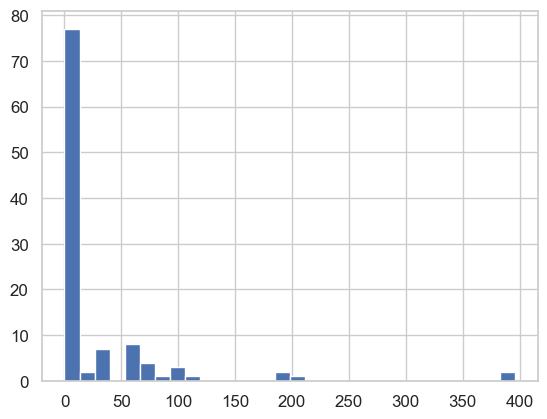

In [320]:
estreams_attributes_clipped_filters_plot_nodup.lakes_tot_vol.hist(bins=30)

<Axes: >

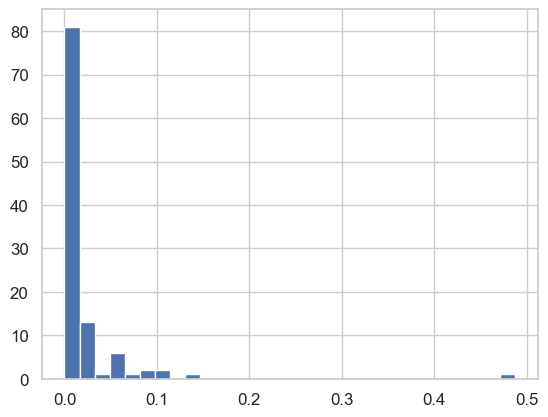

In [311]:
estreams_attributes_clipped_filters_plot_nodup.lakes_vol_frac.hist(bins=30)

<Axes: >

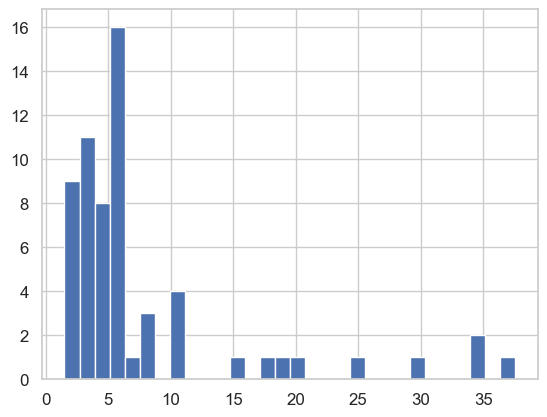

In [333]:
estreams_attributes_clipped_filters_plot_nodup.lakes_mean_depth.hist(bins=30)

#### Figure S3

In [383]:
estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac_in_mm"] = estreams_attributes_clipped_filters_plot_nodup["lakes_vol_frac"] * 1000

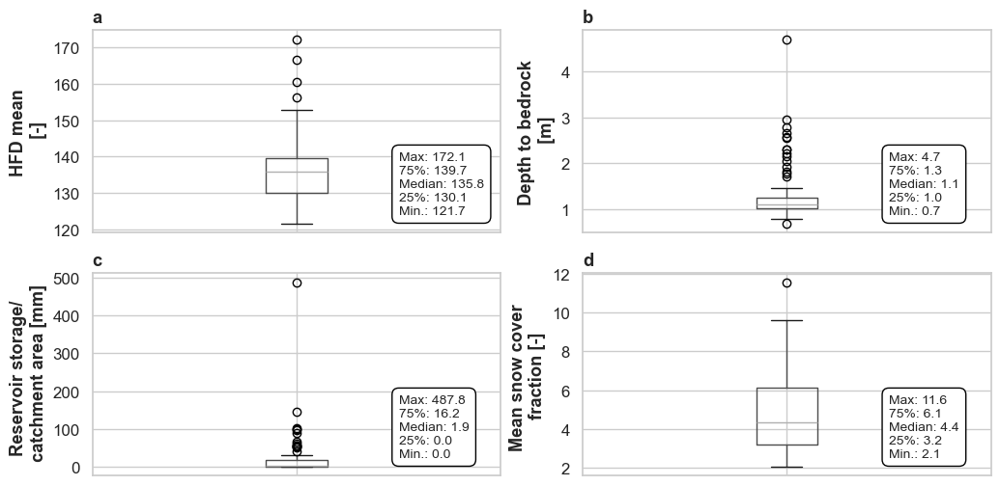

In [398]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 6))
axes = axes.flatten()  # convert 2x2 array into 1D list of axes

panels = [
    ("hfd_mean", "HFD mean\n [-]", "a"),
    ("bedrk_dep", "Depth to bedrock\n [m]", "b"),
    ("lakes_vol_frac_in_mm", "Reservoir storage/ \n catchment area [mm]", "c"),
    ("sno_cov_mean", "Mean snow cover \nfraction [-]", "d")
]

# Loop through the panels
for i, (x_col, xlabel, label) in enumerate(panels):
    ax = axes[i]



    # draw the boxplot
    estreams_attributes_clipped_filters_plot_nodup.boxplot(column=x_col, ax=ax)
    ax.set_ylabel(xlabel)
    ax.set_xticklabels([])

    ax.set_title(label, loc="left", fontweight="bold")

    # compute stats
    vals = estreams_attributes_clipped_filters_plot_nodup[x_col].dropna()
    q25 = vals.quantile(0.25)
    median = vals.median()
    q75 = vals.quantile(0.75)
    vmax = vals.max()
    vmin = vals.min()

    # prepare text
    stats_text = (
        f"Max: {vmax:.1f}\n"
        f"75%: {q75:.1f}\n"
        f"Median: {median:.1f}\n"
        f"25%: {q25:.1f}\n"
        f"Min.: {vmin:.1f}"
    )

    # add a single text box at 90% x, 90% y (axes coords)
    ax.text(
        0.75, 0.4, stats_text,
        transform=ax.transAxes,        # <-- use axes fraction coordinates
        fontsize=10,
        verticalalignment="top",
        horizontalalignment="left",
        bbox=dict(facecolor="white", edgecolor="black", boxstyle="round,pad=0.5")
    )

# Save figure
plt.savefig(
    "../results/figs/boxplot_figures3.png",
    dpi=300,
    bbox_inches='tight'

    
)
plt.show()


In [399]:
estreams_attributes_clipped_filters_plot_nodup.root_dep_mean.describe()

count    108.000000
mean     104.802389
std       17.581981
min       67.233000
25%       92.945500
50%      110.495000
75%      117.545500
max      130.000000
Name: root_dep_mean, dtype: float64

In [400]:
estreams_attributes_clipped_filters_plot_nodup.bedrk_dep.describe()

count    108.000000
mean       1.283593
std        0.548733
min        0.691000
25%        1.030000
50%        1.112500
75%        1.252000
max        4.694000
Name: bedrk_dep, dtype: float64

#### Figure S4

/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_83009/1076636666.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  estreams_attributes_clipped_filters_plot_nodup["marker_size"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"].apply(get_marker_size)


nse_g1comp
nse_r1comp
nse_g1comp
nse_r1comp


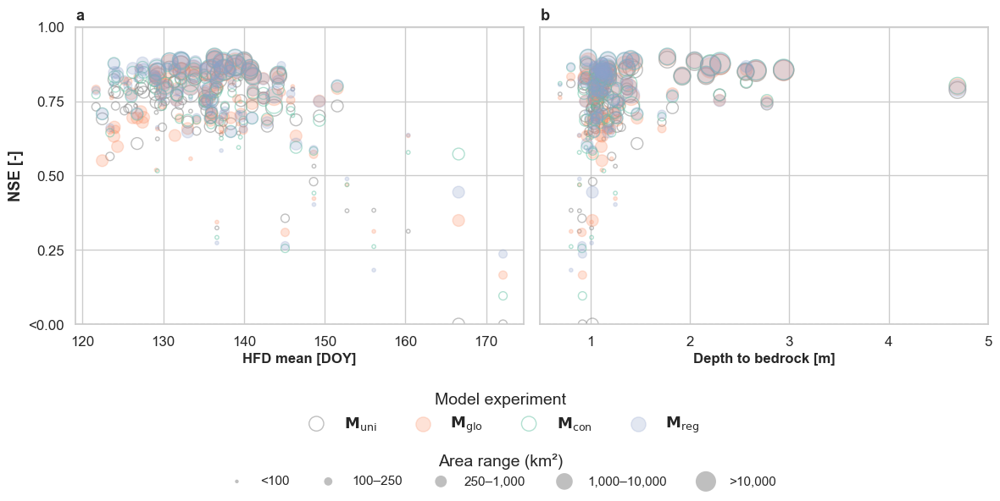

In [128]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mticker

# Set Seaborn style
sns.set(style="whitegrid", font_scale=1.1)

# Create 1x2 subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6), sharey=True)

# Define the two variables to plot
panels = [
    ("hfd_mean", "HFD mean [DOY]", "a"),
    ("bedrk_dep", "Depth to bedrock [m]", "b"),
]

# Define NSE columns and colors
nse_columns = {
    "nse_nogeo": "gray",
    "nse_g1comp": "#fc8d62",
    "nse_c1comp": "#66c2a5",
    "nse_r1comp": "#8da0cb",
}

# Function to determine marker size
def get_marker_size(area):
    if area < 100:
        return 10
    elif 100 <= area < 250:
        return 50
    elif 250 <= area < 1000:
        return 100
    elif 1000 <= area < 10000:
        return 200
    else:
        return 300

# Pre-compute marker sizes based on catchment area
estreams_attributes_clipped_filters_plot_nodup["marker_size"] = estreams_attributes_clipped_filters_plot_nodup["area_estreams"].apply(get_marker_size)

# Loop through the panels
for i, (x_col, xlabel, label) in enumerate(panels):
    ax = axes[i]

    for nse_col, color in nse_columns.items():


        if nse_col == "nse_nogeo":
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color="none", label=nse_col if i == 0 else "", alpha=0.5, s=sizes, edgecolors=color)
        elif nse_col == "nse_c1comp":
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color="none", label=nse_col if i == 0 else "", alpha=0.5, s=sizes, edgecolors=color)
        else:
            print(nse_col)
            x = estreams_attributes_clipped_filters_plot_nodup[x_col]
            y = estreams_attributes_clipped_filters_plot_nodup[nse_col].clip(lower=0, upper=1)
            sizes = estreams_attributes_clipped_filters_plot_nodup["marker_size"]
            ax.scatter(x, y, color=color, label=nse_col if i == 0 else "", alpha=0.25, s=sizes)


    ax.set_xlabel(xlabel, fontsize=12)
    ax.set_ylabel("NSE [-]" if i == 0 else "")
    ax.set_title(label, loc='left', fontsize=13, fontweight="bold")
    ax.axhline(0, linestyle='--', color='gray', linewidth=1)
    ax.set_yticks([0, 0.25, 0.5, 0.75, 1.0])
    ax.set_yticklabels(["<0.00", "0.25", "0.50", "0.75", "1.00"])
    ax.set_ylim(0, 1)

# First legend: NSE model experiment
handles_model, _ = axes[0].get_legend_handles_labels()
fig.legend(
    handles_model,
    [r"$\mathbf{M_{\mathrm{uni}}}$", r"$\mathbf{M_{\mathrm{glo}}}$", r"$\mathbf{M_{\mathrm{con}}}$", r"$\mathbf{M_{\mathrm{reg}}}$"],
    title="Model experiment",
    loc='lower center',
    ncol=4,
    fontsize=13,
    title_fontsize=14,
    frameon=False,
    bbox_to_anchor=(0.5, 0.1)  # slightly below plot
)

# Second legend: Marker size (area)
size_handles = [
    plt.scatter([], [], s=10,  color="gray", alpha=0.5, label='<100', edgecolors='none'),
    plt.scatter([], [], s=50,   color="gray",alpha=0.5, label='100–250', edgecolors='none'),
    plt.scatter([], [], s=100,   color="gray",alpha=0.5, label='250–1,000', edgecolors='none'),
    plt.scatter([], [], s=200,   color="gray",alpha=0.5, label='1,000–10,000', edgecolors='none'),
    plt.scatter([], [], s=300,  color="gray",alpha=0.5, label='>10,000', edgecolors='none')
]

fig.legend(
    handles=size_handles,
    title='Area range (km²)',
    loc='lower center',
    ncol=5,
    bbox_to_anchor=(0.5, 0),  # lower than the model legend
    frameon=False,
    fontsize=11,
    title_fontsize=14
)
#axes[0].set_xscale("log")
#axes[1].set_xscale("log")

axes[0].xaxis.set_major_formatter(mticker.ScalarFormatter())
axes[0].xaxis.set_minor_formatter(mticker.ScalarFormatter())  # hide minor tick labels if cluttered



ticks = [1, 2, 3, 4, 5]
axes[1].set_xticks(ticks)
axes[1].set_xticklabels([str(t) for t in ticks])  # show as plain numbers

#axes[1].xaxis.set_major_formatter(mticker.ScalarFormatter())
#axes[1].xaxis.set_minor_formatter(mticker.ScalarFormatter())  # hide minor tick labels if cluttered




# Adjust layout to reserve enough space for both legends
plt.tight_layout(rect=[0, 0.23, 1, 1])  # leave more space at the bottom

# Save figure
plt.savefig(
    "../results/figs/correlations_hfd_bedrockarea_scaled.png",
    dpi=300,
    bbox_inches='tight'

    
)

plt.show()


#### Supporting Tables (CSVs)

In [339]:
estreams_attributes_clipped_filters_plot_nodup_appendix = estreams_attributes_clipped_filters_plot_nodup.copy()

estreams_attributes_clipped_filters_plot_nodup_appendix["perm_high_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_high_cont"] 
estreams_attributes_clipped_filters_plot_nodup_appendix["perm_medium_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_medium_cont"] + estreams_attributes_clipped_filters_plot_nodup_appendix["perm_low_cont"]
estreams_attributes_clipped_filters_plot_nodup_appendix["perm_low_cont2"] = estreams_attributes_clipped_filters_plot_nodup_appendix["perm_verylow_cont"] 

estreams_attributes_clipped_filters_plot_nodup_appendix = estreams_attributes_clipped_filters_plot_nodup_appendix[['gauge_id', 
                                                                                                                  'gauge_name',
                                                                                                                  'gauge_country',
       'gauge_provider', 'river', 'lon_snap', 'lat_snap', 'area_official', 'area_estreams', 'area_flag', 'area_rel',
       'start_date', 'end_date', 'num_years', 'gauges_upstream', 'q_mean', 'q_runoff_ratio',
       'q_elas_Sankarasubramanian', 'slope_sawicz', 'baseflow_index',
       'hfd_mean', 'hfd_std', 'q_5', 'q_95', 'hq_freq', 'hq_dur', 'lq_freq', 'lq_dur', 'zero_q_freq', 'p_mean', 'pet_mean',
       'aridity', 'p_seasonality', 'frac_snow', 'hp_freq', 'hp_dur', 'hp_time', 'lp_freq', 'lp_dur', 'lp_time', 'ele_mt_max',
       'ele_mt_mean', 'ele_mt_min', 'slp_dg_mean', 'flat_area_fra',
       'steep_area_fra', 'elon_ratio', 'strm_dens', 'lit_dom', 'bedrk_dep',
        'lit_fra_su','lit_fra_ss', 'lit_fra_sm', 'lit_fra_sc', 'lit_fra_mt', 'lit_fra_pi',
       'lit_fra_py', 'lit_fra_vi', 'lit_fra_ev', 'lit_fra_ig', 'lit_fra_pa',
       'lit_fra_pb', 'lit_fra_va', 'lit_fra_vb', 

       'perm_high_regi', 'perm_medium_regi', 'perm_low_regi', 
       'perm_high_cont2', 'perm_medium_cont2', 'perm_low_cont2', 
       'perm_high_glob2', 'perm_medium_glob2', 'perm_low_glob2',
       
       'root_dep_mean', 'root_dep_max',
       'root_dep_min', 'soil_tawc_mean', 'soil_fra_sand_mean',
       'soil_fra_silt_mean', 'soil_fra_clay_mean', 'soil_fra_grav_mean', 'soil_bd_mean', 'soil_oc_mean', 
       
       'lai_mean',
       'ndvi_mean', 'lulc_2006_urban', 'lulc_2006_NonIrriAgri',
       'lulc_2006_Agric', 'lulc_2006_forest', 'lulc_2006_grass',
       'lulc_2006_agriculture', 'dam_num', 'res_num', 'lakes_num',
       'lakes_tot_area', 'lakes_tot_vol', 'sno_cov_mean', 'irri_1990',
       'irri_2005', 'stations_num_p_mean',  'nse_r1comp', 'nse_c1comp',
       'nse_g1comp', 'nse_nogeo']]

In [361]:
estreams_attributes_clipped_filters_plot_nodup_appendix.to_csv("../results/supporting_information/moselle_attributes.csv", index=True)

In [114]:
data_diff_val_complete_dict_plot[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]
data_diff_cal_complete_dict_plot[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]    
data_diff_calibration_complete[["lat", "lon"]] = estreams_attributes_clipped_filters_plot_nodup[["lat_snap", "lon_snap"]]    


data_diff_val_complete_dict_plot.to_csv("../results/supporting_information/space_time_eval_median_nse_signatures.csv", index=True)
data_diff_cal_complete_dict_plot.to_csv("../results/supporting_information/space_eval_median_nse_signatures.csv", index=True)
data_diff_calibration_complete.to_csv("../results/supporting_information/calibration_median_nse_signatures.csv", index=True)


In [362]:
estreams_attributes_clipped_filters_plot_nodup_appendix.iloc[:, 15:].corr(method='pearson').to_csv("../results/supporting_information/moselle_attributes_correlation_pearson.csv", index=True)
estreams_attributes_clipped_filters_plot_nodup_appendix.iloc[:, 15:].corr(method='spearman').to_csv("../results/supporting_information/moselle_attributes_correlation_spearman.csv", index=True)

## Case for the three catchments with baseflow wrong

In [169]:
from pathlib import Path
import xarray as xr

# Base directory and group names
base_dir = Path("../results/sim/FR003250_FR000185_FR003259")
group_names = [f"Group_{i}" for i in range(1, 8)]

# Load all groups into a list of datasets
datasets = [load_group_with_inputs(group, base_dir) for group in group_names]

# Merge into one dataset with a new dimension: "group"
combined = xr.concat(datasets, dim="group")

# Compute the average across groups
ds_mean = combined.mean(dim="group")

# Initialize dict to collect NSEs
nse_results = {}

# Define the time range
start_date = "1989-10-01"
end_date = "2015-09-30"

selected_gauge_ids = ["FR003250", "FR000185", "FR003259"]

# Clip by gauges and time
ds_mean_clipped = ds_mean.sel(
    gauge_id=selected_gauge_ids,
    date=slice(start_date, end_date)
)

# Loop over gauges and compute NSE within defined time period
for gauge_id in ds_mean_clipped.gauge_id.values:
    # Subset for gauge and time period
    ts = ds_mean_clipped.sel(gauge_id=gauge_id).sel(date=slice(start_date, end_date))
    
    obs = ts["observation"].values

    nse_results[gauge_id] = {
        'nse_r1comp': compute_nse(obs, ts["regional"].values),
    }


# Convert to DataFrame
data_diff_val_FR003250_FR000185_FR003259_dict_plot = pd.DataFrame.from_dict(nse_results, orient='index')


# Sources to evaluate
sources = ['observation', 'regional']

MIN_VALID_POINTS = 365  # You can adjust this threshold if needed

def safe_bfi(sim, obs):
    masked_sim = sim[~np.isnan(obs)]
    masked_sim = masked_sim[~np.isnan(masked_sim)]
    if len(masked_sim) < MIN_VALID_POINTS:
        return np.nan
    return baseflow_index(masked_sim, alpha=0.925, warmup=365, n_passes=3)[0]

def safe_hfd(sim, obs):
    masked_sim = sim[~np.isnan(obs)]
    masked_sim = masked_sim[~np.isnan(masked_sim)]
    if len(masked_sim) < MIN_VALID_POINTS:
        return np.nan
    return hfd_mean(masked_sim, datetime_coord="date")

def safe_slope(sim, obs):
    masked_sim = sim[~np.isnan(obs)]
    masked_sim = masked_sim[~np.isnan(masked_sim)]
    if len(masked_sim) < MIN_VALID_POINTS:
        return np.nan
    return slope_fdc(masked_sim)

def safe_qmean(sim, obs):
    masked_sim = sim[~np.isnan(obs)]
    masked_sim = masked_sim[~np.isnan(masked_sim)]
    if len(masked_sim) < MIN_VALID_POINTS:
        return np.nan
    return q_mean(masked_sim)

signature_funcs = {
    'bfi': safe_bfi,
    'hfd': safe_hfd,
    'slope': safe_slope,
    'qmean': safe_qmean,
}

# Initialize storage
signature_results = []

# Loop over gauges
for gauge in tqdm.tqdm(ds_mean_clipped.gauge_id.values):
    obs = ds_mean_clipped.sel(gauge_id=gauge)['observation']
    row = {'gauge_id': gauge}

    for sig_short, sig_func in signature_funcs.items():
        for source in sources:
            discharge = ds_mean_clipped.sel(gauge_id=gauge)[source]
            try:
                result = sig_func(discharge, obs)
            except Exception as e:
                print(f"{sig_short} failed for {gauge} [{source}]: {e}")
                result = np.nan

            # Define correct column name
            col_name = f"{sig_short}_{'obs' if source == 'observation' else ('r1comp' if source == 'regional' else ('c1comp' if source == 'continental' else ('g1comp' if source == 'global' else 'nogeo')))}"
            row[col_name] = result

    signature_results.append(row)

# Convert to DataFrame
signature_df = pd.DataFrame(signature_results)
signature_df.set_index('gauge_id', inplace=True)

# Merge signatures with NSEs
data_diff_val_FR003250_FR000185_FR003259_dict_plot = data_diff_val_FR003250_FR000185_FR003259_dict_plot.join(signature_df, how='left')


100%|██████████| 3/3 [00:00<00:00, 29.72it/s]


In [170]:
data_diff_val_FR003250_FR000185_FR003259_dict_plot

,nse_r1comp,bfi_obs,bfi_r1comp,hfd_obs,hfd_r1comp,slope_obs,slope_r1comp,qmean_obs,qmean_r1comp
FR003250,0.419718,0.685264,0.816228,147.040000,151.480000,1.810170,1.151496,2.390766,1.563744
FR000185,0.353026,0.537419,0.542533,139.428571,124.523810,3.200160,3.297333,0.799352,1.225870
FR003259,0.221587,0.576604,0.536554,134.222222,126.666667,2.215223,3.353227,0.874788,1.396102


# Extra figures (posters)

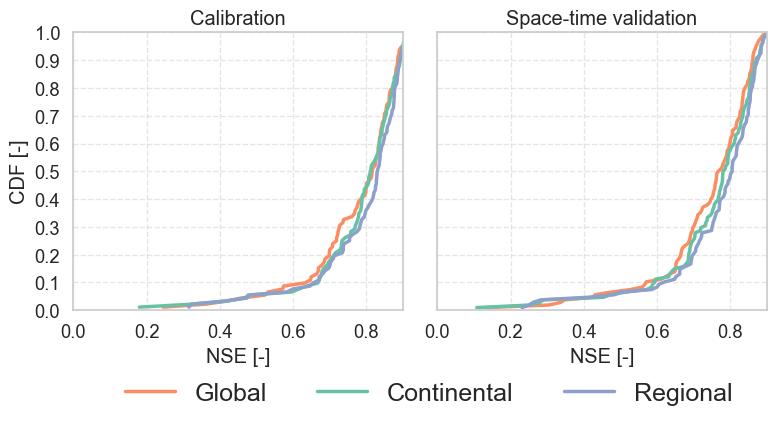

In [32]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as ticker

# Plotting function
def plot_cdf_mean(ax, data_input, title, label_letter):
    # Check if input is a dict or DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")
    
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')


# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}
labels_pretty = {
    'nse_g1comp': r"Global",
    'nse_c1comp': r"Continental",
    'nse_r1comp': r"Regional",
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 2, figsize=(8, 4), sharey=True)

# Calibration and space validation use dictionaries
plot_cdf_mean(axs[0], data_diff_calibration_complete_dict_plot, "Calibration", "")
axs[0].set_ylabel("CDF [-]")

#plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot, "Space validation", "b")

# Space-time validation uses the DataFrame directly
plot_cdf_mean(axs[1], data_diff_val_complete_dict_plot, "Space-time validation", "")

# Legend shared
handles, labels = axs[0].get_legend_handles_labels()
fig.legend(handles, labels,
           #title="Model experiment",
           loc='lower center',
           bbox_to_anchor=(0.55, -0.1),
           ncol=4,
           fontsize=18,
           title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    "../results/figs/poster_cdfs.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


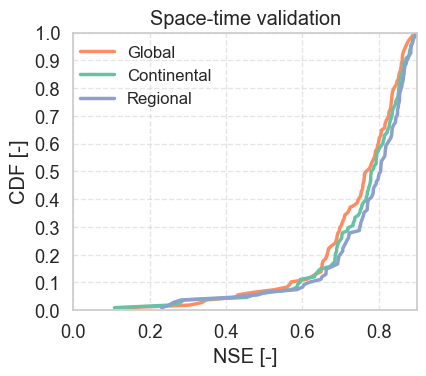

In [83]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.ticker as ticker

# Plotting function
def plot_cdf_mean(ax, data_input, title, label_letter):
    # Check if input is a dict or DataFrame
    if isinstance(data_input, dict):
        dfs = list(data_input.values())
        all_data = pd.concat(dfs, axis=0)
    elif isinstance(data_input, pd.DataFrame):
        all_data = data_input.copy()
    else:
        raise ValueError("data_input must be a dict of DataFrames or a single DataFrame.")
    
    data_combined = all_data.groupby(all_data.index).mean()

    for model_type in ['nse_g1comp', 'nse_c1comp', 'nse_r1comp']:
        if model_type not in data_combined.columns:
            continue
        nse_values = np.sort(data_combined[model_type].dropna())
        if len(nse_values) == 0:
            continue
        cumulative = np.arange(1, len(nse_values) + 1) / len(nse_values)
        ax.plot(
            nse_values, cumulative,
            color=colors[model_type],
            linewidth=2.5,
            label=labels_pretty[model_type]
        )

    ax.set_title(title)
    ax.set_xlim(-0.0, 0.9)
    ax.set_ylim(0, 1.0)
    ax.set_xlabel("NSE [-]")
    ax.grid(True, linestyle='--', alpha=0.5)
    ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))

    # Subplot label (a, b, c)
    ax.text(0, 1.075, label_letter, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')


# Set styles
sns.set(style="whitegrid", font_scale=1.2)

# Color and label maps
colors = {
    'nse_g1comp': '#fc8d62',
    'nse_c1comp': '#66c2a5',
    'nse_r1comp': '#8da0cb',
}
labels_pretty = {
    'nse_g1comp': r"Global",
    'nse_c1comp': r"Continental",
    'nse_r1comp': r"Regional",
}

# --- FIGURE 1: CDF plots ---
fig, axs = plt.subplots(1, 1, figsize=(4.5, 4), sharey=True)

# Calibration and space validation use dictionaries
#plot_cdf_mean(axs, data_diff_calibration_complete_dict_plot, "Calibration", "")
axs.set_ylabel("CDF [-]")

#plot_cdf_mean(axs[1], data_diff_cal_complete_dict_plot, "Space validation", "b")

# Space-time validation uses the DataFrame directly
plot_cdf_mean(axs, data_diff_val_complete_dict_plot, "Space-time validation", "")

# Legend shared
handles, labels = axs.get_legend_handles_labels()
fig.legend(handles, labels,
           #title="Model experiment",
           loc='center',
           bbox_to_anchor=(0.35, 0.78),
           ncol=1,
           fontsize=12,
           title_fontsize=14,
           frameon=False)

# Final layout
plt.tight_layout()
plt.savefig(
    "../results/figs/poster_cdfs.png",
    dpi=300,
    bbox_inches='tight'
)

plt.show()


/var/folders/sd/ytjf58757690_xfckxng56q00000gq/T/ipykernel_40569/4209680022.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


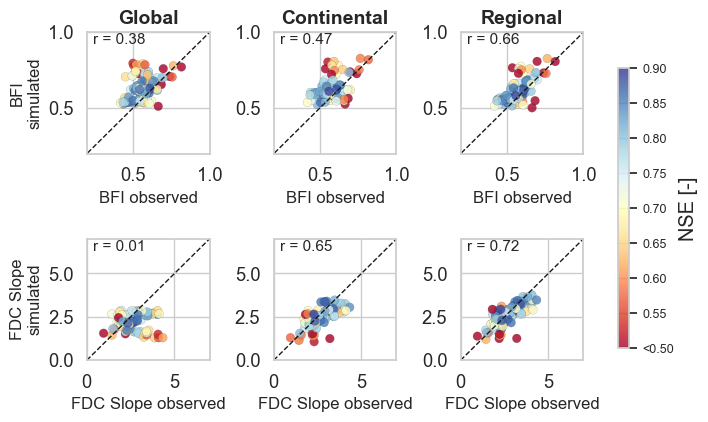

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import string
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Define variables and pretty titles
metrics = ['bfi', 'slope']
metric_titles = ['BFI', 'FDC Slope']

# Define suffixes and scales
suffixes = ['g1comp', 'c1comp', 'r1comp']
scale_titles = [r"Global", "Continental", "Regional"]

# Colormap and normalization
cmap = plt.cm.RdYlBu
vmin, vmax = 0.5, 0.9
norm = Normalize(vmin=vmin, vmax=vmax)

# Create subplots
fig, axs = plt.subplots(2, 3, figsize=(7, 4), sharex=False, sharey=False)
letters = list(string.ascii_lowercase)

# For shared colorbar, store one scatter artist
scatter_for_colorbar = None

# Loop through rows and columns
for row, (metric, row_title) in enumerate(zip(metrics, metric_titles)):
    for col, (suffix, scale_title) in enumerate(zip(suffixes, scale_titles)):
        ax = axs[row, col]
        var_obs = f"{metric}_obs"
        var_pred = f"{metric}_{suffix}"
        var_nse = f"nse_{suffix}"

        # Color values clipped to [0.5, 0.9]
        colors = data_diff_val_complete[var_nse].clip(lower=vmin, upper=vmax)

        # Scatterplot
        sc = ax.scatter(
            data_diff_val_complete[var_obs],
            data_diff_val_complete[var_pred],
            c=colors,
            cmap=cmap,
            norm=norm,
            s=40,
            edgecolor='k',
            linewidth=0.1,
            alpha=0.8
        )

        # Store one artist for colorbar
        if scatter_for_colorbar is None:
            scatter_for_colorbar = sc


        # Labels
        if col == 0:
            ax.set_ylabel(f"{row_title}\nsimulated", fontsize=12)
        else:
            ax.set_ylabel("")
        ax.set_xlabel(f"{row_title} observed", fontsize=12)

        # Correlation
        R = data_diff_val_complete[[var_obs, var_pred]].corr(method="pearson").iloc[0, 1]
        ax.text(
            0.05, 0.9, f"r = {R:.2f}", transform=ax.transAxes,
            fontsize=11, bbox=dict(facecolor='none', alpha=0.6, edgecolor='none')
        )

        # Subplot label
        subplot_idx = row * 4 + col
        #ax.text(
        #    -0.00, 1.14, f"{letters[subplot_idx]}", transform=ax.transAxes,
        #    fontsize=13, fontweight='bold', va='top', ha='left'
        #)

        # Set axis limits per metric
        if metric == 'bfi':
            ax.set_xlim(0.2, 1)
            ax.set_ylim(0.2, 1)
        elif metric == 'slope':
            ax.set_xlim(0, 7)
            ax.set_ylim(0, 7)
        elif metric == 'hfd':
            ax.set_xlim(110, 175)
            ax.set_ylim(110, 175)

axs[0, 0].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 1].plot([0, 1], [0, 1], 'k--', lw=1)
axs[0, 2].plot([0, 1], [0, 1], 'k--', lw=1)
#axs[0, 3].plot([0, 1], [0, 1], 'k--', lw=1)

axs[1, 0].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 1].plot([0, 7], [0, 7], 'k--', lw=1)
axs[1, 2].plot([0, 7], [0, 7], 'k--', lw=1)
#axs[1, 3].plot([0, 7], [0, 7], 'k--', lw=1)

#axs[2, 0].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 1].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 2].plot([100, 180], [100, 180], 'k--', lw=1)
#axs[2, 3].plot([100, 180], [100, 180], 'k--', lw=1)


# Add single vertical colorbar to the right
fig.subplots_adjust(right=0.88)  # Make room for colorbar
cbar_ax = fig.add_axes([0.90, 0.15, 0.015, 0.7])  # [left, bottom, width, height]
cbar = fig.colorbar(scatter_for_colorbar, cax=cbar_ax)
cbar.set_label("NSE [-]")
cbar.ax.tick_params(labelsize=9)



# Custom ticks and labels
ticks = np.linspace(0.5, 0.9, num=9)  # Adjust number of ticks if needed
tick_labels = [f"<0.50"] + [f"{t:.2f}" for t in ticks[1:-1]] + [f"0.90"]
cbar.set_ticks(ticks)
cbar.set_ticklabels(tick_labels)

## Column titles (below x-axis)
#col_positions = [0.25, 0.5, 0.79]
#for x, title in zip(col_positions, scale_titles):
#    fig.text(x, -0.1, title, ha='center', va='bottom', fontsize=14, fontweight='bold')
axs[0, 0].set_title("Global", fontsize=14, fontweight='bold')
axs[0, 1].set_title("Continental", fontsize=14, fontweight='bold')
axs[0, 2].set_title("Regional", fontsize=14, fontweight='bold')


# Final layout
plt.tight_layout()
plt.subplots_adjust(top=0.94, bottom=0.12, right=0.85)

# Optional save
plt.savefig("../results/figs/poster_signatures_colorbar.png", dpi=300,  bbox_inches="tight")

plt.show()

In [84]:
gdf = gpd.read_file(r"/Users/nascimth/Documents/data/gis/world.shp")


In [92]:
moselle.plot(ax=ax, facecolor='none', edgecolor='red', linewidth=1, label='Sub-catchments')


<Axes: xlabel='FDC Slope observed'>

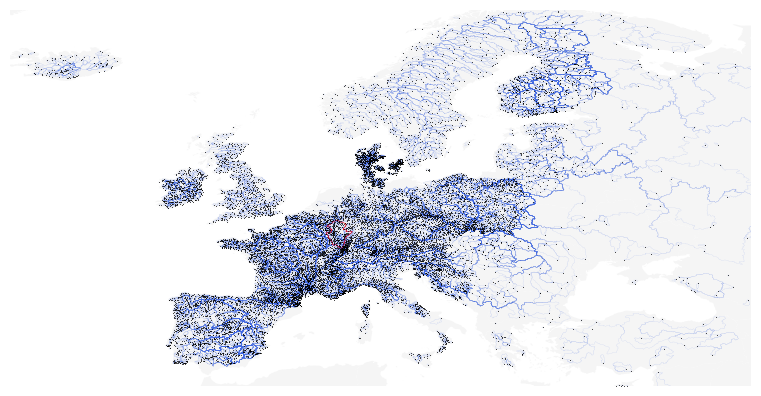

In [ ]:
# Set font properties using rcParams
mpl.rcParams['font.family'] = 'arial'  # Change the font family
mpl.rcParams['font.size'] = 8          # Change the font size
mpl.rcParams['font.weight'] = 'normal'  # Change font weight (e.g., 'bold', 'normal')
mpl.rcParams['axes.labelweight'] = 'bold'  # Change label font weight (e.g., 'bold', 'normal')

# Create a 2x1 subplot grid
fig, axs = plt.subplots(1, 1, figsize=(8, 4))

# Set the background color to white
axs.set_facecolor('white')
# Plot the shapefile with white facecolor and black boundaries
gdf.plot(ax=axs, facecolor='whitesmoke', edgecolor='None', linewidth=0.1)
axs.set_xlim(-24, 45) 
axs.set_ylim(35, 70)  

catchment_boundaries.plot(ax=axs, facecolor='None', edgecolor='royalblue', linewidth=0.05,  alpha=0.70)

moselle.plot(ax=axs, facecolor='none', edgecolor='red', linewidth=0.25, label='Sub-catchments')
axs.set_xlim(-24, 45) 
axs.set_ylim(35, 70)  

# Plot the gauges
axs.scatter(network_estreams['lon_snap'], network_estreams['lat_snap'], color='black', edgecolor='black',linewidth=0.5,
            marker='o', s=0.05, label = "Streamflow gauges")  # Adjust color, marker, and size as needed

axs.set_aspect('equal')  # Adjust aspect ratio as needed
axs.spines['top'].set_visible(False)
axs.spines['right'].set_visible(False)
axs.spines['bottom'].set_visible(False)
axs.spines['left'].set_visible(False)
axs.set_axis_off()  # Turn off both x-axis and y-axis

# Plot invisible scatter plot for legend
axs.plot([], [], color='royalblue', linewidth=0.8, label='Catchemnt boundaries')

#axs.legend(['Streamflow gauges', 'Catchment boundaries'], loc='lower left', frameon=False)


# Adjust layout and remove space between subplots
plt.tight_layout()

# Save or display the plot
#plt.show()
plt.savefig('../results/poster_figure_map.png', dpi=300)  # Replace 'figure.png' with your desired filename and forma

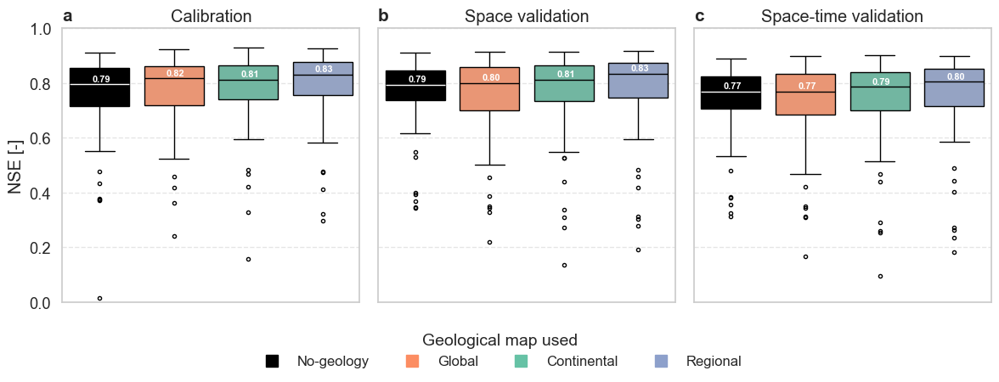

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import matplotlib.lines as mlines

# Seaborn style
sns.set(style="whitegrid", font_scale=1.2)

# Model labels and colors
column_label_map = {
    'nse_nogeo': 'No-Geology',
    'nse_g1comp': 'Global',
    'nse_c1comp': 'Continental',
    'nse_r1comp': 'Regional'
}
colors_box = {
    'No-Geology': 'black',
    'Global': '#fc8d62',
    'Continental': '#66c2a5',
    'Regional': '#8da0cb'
}

# Your input DataFrames for the three cases
dataframes = [
    data_diff_calibration_complete,
    data_diff_cal_complete,
    data_diff_val_complete
]
titles = ['Calibration', 'Space validation', 'Space-time validation']
subplot_labels = ['a', 'b', 'c']

# Create tidy DataFrames for seaborn
tidy_dataframes = []
for df, name in zip(dataframes, titles):
    df_tidy = pd.DataFrame({
        'NSE': pd.concat([df[col] for col in column_label_map]),
        'Model': sum([[column_label_map[col]] * len(df) for col in column_label_map], []),
        'Validation': name
    })
    tidy_dataframes.append(df_tidy)

df_all = pd.concat(tidy_dataframes, ignore_index=True)

# Plot
fig, axs = plt.subplots(1, 3, figsize=(12, 4), sharey=True)

for i, (ax, title, label) in enumerate(zip(axs, titles, subplot_labels)):
    df_sub = df_all[df_all["Validation"] == title]

    sns.boxplot(
        data=df_sub,
        x="Model",
        y="NSE",
        hue="Model",
        palette=colors_box,
        linewidth=1,
        fliersize=3,
        dodge=False,
        ax=ax
    )

    # Remove auto-generated legend
    if ax.get_legend():
        ax.get_legend().remove()

    # Annotate medians
    median_lines = ax.lines[4::6]
    for line in median_lines:
        y_data, x_data = line.get_xydata().mean(axis=0)
        ax.text(y_data - 0.1, x_data + 0.02, f"{x_data:.2f}", ha='left', va='center',
                fontweight='bold', fontsize=8, color='white')

        model_names = df_sub['Model'].unique()
        model_index = int(round(y_data))
        if model_index < len(model_names) and model_names[model_index] == 'No-Geology':
            line.set_color('white')

    ax.set_title(title)

    if i == 0:
        ax.set_ylabel("NSE [-]")
    else:
        ax.set_ylabel("")
        ax.tick_params(labelleft=False)  # Fully remove y-tick labels for right panels
    
    ax.set_xticks([])
    ax.set_xlabel("")
    ax.set_ylim(0, 1.0)
    ax.grid(True, linestyle='--', alpha=0.5)

    # Subplot label (a, b, c)
    ax.text(-0.0, 1.075, label, transform=ax.transAxes,
            fontsize=15, fontweight='bold', va='top', ha='left')

# Custom legend below
custom_handles = [
    mlines.Line2D([], [], color='black', marker='s', linestyle='None', markersize=10, label='No-geology'),
    mlines.Line2D([], [], color='#fc8d62', marker='s', linestyle='None', markersize=10, label='Global'),
    mlines.Line2D([], [], color='#66c2a5', marker='s', linestyle='None', markersize=10, label='Continental'),
    mlines.Line2D([], [], color='#8da0cb', marker='s', linestyle='None', markersize=10, label='Regional'),
]

fig.legend(
    handles=custom_handles,
    title="Geological map used",
    loc='lower center',
    bbox_to_anchor=(0.5, -0.15),
    ncol=4,
    fontsize=12,
    title_fontsize=14,
    frameon=False
)

plt.tight_layout()
plt.savefig("../results/figs/three_cdfs.png", dpi=300, bbox_inches='tight')
plt.show()

# End